In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import softmax
from scipy.special import rel_entr
from numpy import random
from itertools import cycle
import seaborn as sns
# matplotlib.use("pgf")
# matplotlib.rcParams.update({
#     "pgf.texsystem": "pdflatex",
#     'font.family': 'serif',
#     'text.usetex': True,
#     'pgf.rcfonts': False,
# })


In [3]:
def compute_popularity(df, col):
    pop = df.groupby([col]).size().reset_index(name='popularity')
    pop['popularity'] = pop['popularity'] / len(df)
    #number of users!!!
    return pop.sort_values('popularity', ascending=False)

In [4]:
def compute_popularity_2(df, col):
    pop = df.groupby([col]).size().reset_index(name='popularity')
    pop['popularity'] = pop['popularity'] / len(df)
    #number of users!!!
    return pop
#pop.sort_values('popularity', ascending=False)

In [5]:
def expo_score(k):
    return (11-k)/(10+1)

In [6]:
def compute_popularity(df, col):
    pop = df.groupby([col]).size().reset_index(name='popularity')
    pop['popularity'] = pop['popularity'] / len(df)
    return pop.sort_values('popularity', ascending=False)

def get_head_mid_tail(popularity, head_threshold, mid_threshold):
    p, i = 0, 0
    head_index, mid_index = 0, 0
    head_found, mid_found = False, False
    for index,row in popularity.iterrows():
        p += float(row['popularity'])
        if p > head_threshold and not head_found:
            head_index = i + 1
            head_found = True
        elif p > mid_threshold and not mid_found:
            mid_index = i + 1
            mid_found = True
        i += 1
    return list(popularity[:head_index]['itemid']), list(popularity[head_index:mid_index]['itemid']), list(popularity[mid_index:]['itemid'])

def label_items(row, head):
    
   if row['itemid'] in head:
       return 0
   else:
       return 1

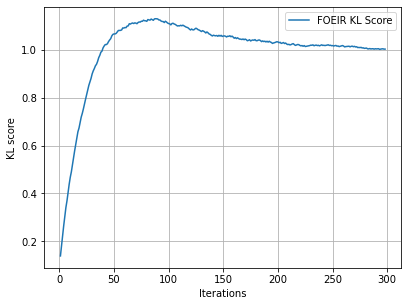

In [27]:
N = 300
KL = []
for t in range(2, N):
    df = pd.read_csv('T_3_final/t_' + str(t) + '/train-1.txt', names=['userid', 'movieid', 'rating'], sep='\t')
    df_1 = pd.read_csv('T_3_final/t_' + str(t) + '/out-1.txt', names=['userid', 'movieid', 'rating'], sep=',')
    df = compute_popularity(df,'movieid')
    df.reset_index(drop=True,inplace = True)
    df.sort_values('popularity', ascending=False)
    df['prob_pop'] = softmax(df['popularity'].values)
    P,Q = list(df['popularity']), list(df['prob_pop'])
    x = random.uniform(size=(1,len(df)))
    df['kl'] = sum(rel_entr(P, Q))
    #print(df['kl'])
    l = list(df['kl'].unique())
    KL.append(l)

kl = [i[0] for i in KL]
#print(kl)

fd = pd.DataFrame(kl, columns =['kl'])

fd['index'] = range(1, len(fd) + 1)
#print(fd)
    
fd = pd.DataFrame(fd, columns=['index', 'kl'])
fd.to_csv('T_3_final/t_1/kl_plot.txt',header=None, index=False, sep='\t', mode='w')
#fig = plt.figure(figsize=(15,10))
plt.plot(fd['index'], fd['kl'], label = 'FOEIR KL Score')
#plt.plot(range(10), linestyle='--', marker='o', color='b',
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,100])
#plt.title("Popularity Distribution Divergence from the Unifrom")
plt.xlabel("Iterations")
plt.ylabel("KL score")
#plt.grid()
#figure = plt.subplots(2,2)
plt.legend()
plt.grid()
plt.savefig('foeir_png/klplot_single.jpg',format='jpg',bbox_inches='tight', dpi=150)
plt.show()


    

      movieid  popularity  index
50         36    0.016476      1
51        913    0.001305      2
52         46    0.001305      3
53       3317    0.001305      4
54       1952    0.001142      5
...       ...         ...    ...
2697     2873    0.000163   2648
2698     1211    0.000163   2649
2699     1205    0.000163   2650
2700     1203    0.000163   2651
2701        1    0.000163   2652

[2652 rows x 3 columns]


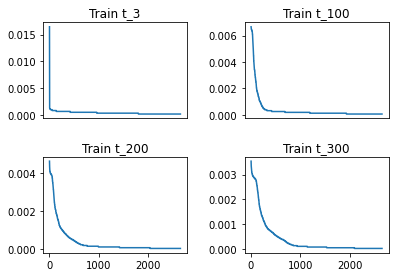

In [11]:
df1 = pd.read_csv('T_3_final/t_3/train-1.txt', names=['userid', 'movieid', 'rating'], sep='\t')
df2 = pd.read_csv('T_3_final/t_100/train-1.txt', names=['userid', 'movieid', 'rating'], sep='\t')
df3 = pd.read_csv('T_3_final/t_200/train-1.txt', names=['userid', 'movieid', 'rating'], sep='\t')
df4 = pd.read_csv('T_3_final/t_300/train-1.txt', names=['userid', 'movieid', 'rating'], sep='\t')


df1 = compute_popularity(df1,'movieid')
df1.reset_index(drop=True,inplace = True)
df1.sort_values('popularity', ascending=False)
df1['index'] = range(1,len(df1)+1)
df1.index += 50
print(df1)
df1.to_csv('T_3_final/t_1/sub_3.txt', header=None, index=False, sep='\t', mode='w')

df2 = compute_popularity(df2,'movieid')
df2.reset_index(drop=True,inplace = True)
df2.sort_values('popularity', ascending=False)
df2['index'] = range(1,len(df2)+1)
df2.index += 50
df2.to_csv('T_3_final/t_1/sub_100.txt', header=None, index=False, sep='\t', mode='w')


df3 = compute_popularity(df3,'movieid')
df3.reset_index(drop=True,inplace = True)
df3.sort_values('popularity', ascending=False)
df3['index'] = range(1,len(df3)+1)
df3.index += 50
df3.to_csv('T_3_final/t_1/sub_200.txt', header=None, index=False, sep='\t', mode='w')


df4 = compute_popularity(df4,'movieid')
df4.reset_index(drop=True,inplace = True)
df4.sort_values('popularity', ascending=False)
df4['index'] = range(1,len(df4)+1)
df4.index += 50
df4.to_csv('T_3_final/t_1/sub_300.txt', header=None, index=False, sep='\t', mode='w')


# Initialise the subplot function using number of rows and columns
figure, axis = plt.subplots(2, 2)
  
# For Sine Function
axis[0, 0].plot(df1['index'], df1['popularity'])
axis[0, 0].set_title("Train t_3")
axis[0,0].xaxis.set_visible(False)
#axis[0,0].grid()
#plt.gca().axes.get_yaxis().set_visible(False)
  
# For Cosine Function
axis[0, 1].plot(df2['index'], df2['popularity'])
axis[0, 1].set_title("Train t_100")
axis[0,1].xaxis.set_visible(False)
#axis[0,1].yaxis.set_visible(False)
#axis[0,1].grid()
#plt.gca().axes.get_yaxis().set_visible(False)
# For Tangent Function
axis[1, 0].plot(df3['index'], df3['popularity'])
axis[1, 0].set_title("Train t_200")
#axis[1, 0].grid()
  
# For Tanh Function
axis[1, 1].plot(df4['index'], df4['popularity'])
axis[1, 1].set_title("Train t_300")
#axis[1,1].yaxis.set_visible(False)
#axis[1,1].grid()
#axis[1,1].xaxis.set_visible(False)
  
# Combine all the operations and display
#plt.axis('off')
# plt.xticks([])
# plt.yticks([])
#plt.grid()
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.savefig('foeir_png/pop_subplots_single.jpg',format='jpg',bbox_inches='tight', dpi=150)
plt.show()

# plt.plot(df['index'], df['popularity'])
# #plt.plot(x, y)
# plt.ylim([0.0001,0.02])
# plt.xlim([1,100])
# plt.title("Popularity Plot")
# #plt.xlabel("Index")
# #plt.ylabel("Popularity Score")
# #plt.grid()
# figure = plt.subplots(2,2)
# plt.show()


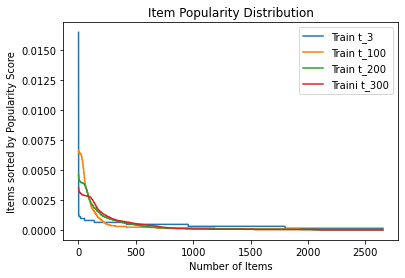

<Figure size 432x288 with 0 Axes>

In [9]:
plt.plot(df1['index'], df1['popularity'],label ='Train t_3')
plt.plot(df2['index'], df2['popularity'],label ='Train t_100')
plt.plot(df3['index'], df3['popularity'],label='Train t_200')
plt.plot(df4['index'], df4['popularity'],label='Traini t_300')
plt.title("Item Popularity Distribution")
plt.xlabel("Number of Items")
plt.ylabel("Items sorted by Popularity Score")
plt.grid()
#figure = plt.subplots(2,2)
plt.legend()
plt.grid()
plt.show()
plt.savefig('FINAL_T_3_FOEIR_PGF/subplots_all.jpg')


In [14]:
pd_2 = pd.read_csv('T_3_final/t_1/count_score_all.txt', names=['itemid', 'score','count'], sep='\t')
items_ranked = list(pd_2['itemid'].unique())

for i in items_ranked:   
    pd_3 = pd.read_csv('T_3_final/t_1/score_per_itm_iter' + str(i) + '.txt', names=['itemid', 'label', 'cum_score', 'iteration'], sep='\t')
    pd_3['cum_score'] = pd_3['cum_score'].cumsum().astype(float)
    if len(pd_3) > 1:
        pd_3 = pd_3.drop_duplicates(subset='itemid',keep='last').reset_index(drop=True)
        print(pd_3)
        pd_3.to_csv('T_3_final/t_1/exposed_after_boot.txt',header=None, index=False, sep='\t', mode='a')

   itemid  label   cum_score  iteration
0    2522  False  885.272727        249
   itemid  label   cum_score  iteration
0     179   True  749.181818         37
   itemid  label   cum_score  iteration
0    1779   True  721.818182        300
   itemid  label   cum_score  iteration
0    3225  False  646.090909        130
   itemid  label  cum_score  iteration
0    3095  False      593.0        165
   itemid  label   cum_score  iteration
0    1594  False  582.545455        285
   itemid  label  cum_score  iteration
0     111  False      579.0        297
   itemid  label   cum_score  iteration
0     972  False  520.363636        300
   itemid  label   cum_score  iteration
0    3306  False  489.090909        283
   itemid  label   cum_score  iteration
0    2345  False  486.909091        231
   itemid  label   cum_score  iteration
0    2167  False  483.454545        195
   itemid  label   cum_score  iteration
0    2824  False  478.727273        277
   itemid  label   cum_score  iteration
0   

   itemid  label   cum_score  iteration
0    3686  False  293.363636        300
   itemid  label   cum_score  iteration
0    2500  False  293.090909        267
   itemid  label   cum_score  iteration
0    2689   True  293.090909        300
   itemid  label   cum_score  iteration
0      78   True  292.909091        111
   itemid  label   cum_score  iteration
0    1985  False  291.909091        297
   itemid  label   cum_score  iteration
0     943  False  291.181818         34
   itemid  label  cum_score  iteration
0    2594  False      291.0        254
   itemid  label   cum_score  iteration
0    2864  False  290.545455        287
   itemid  label   cum_score  iteration
0     880  False  288.818182        236
   itemid  label   cum_score  iteration
0    2963   True  288.454545        290
   itemid  label   cum_score  iteration
0    3074  False  287.636364        269
   itemid  label   cum_score  iteration
0    2101  False  286.636364        260
   itemid  label   cum_score  iteration
0 

   itemid  label   cum_score  iteration
0    2285   True  218.636364         36
   itemid  label   cum_score  iteration
0    1100  False  218.181818        233
   itemid  label   cum_score  iteration
0    2778  False  218.090909         49
   itemid  label   cum_score  iteration
0    1614   True  217.454545        100
   itemid  label  cum_score  iteration
0    3284   True      217.0        109
   itemid  label   cum_score  iteration
0    1433  False  216.818182        275
   itemid  label   cum_score  iteration
0    1539   True  216.727273         78
   itemid  label   cum_score  iteration
0    1898   True  216.454545        300
   itemid  label   cum_score  iteration
0    1752  False  216.090909        126
   itemid  label   cum_score  iteration
0     140  False  215.909091        177
   itemid  label   cum_score  iteration
0     270  False  215.636364         39
   itemid  label   cum_score  iteration
0    2938  False  215.545455         48
   itemid  label   cum_score  iteration
0 

   itemid  label   cum_score  iteration
0     329  False  179.818182         24
   itemid  label   cum_score  iteration
0    3338   True  179.727273         46
   itemid  label   cum_score  iteration
0     432  False  179.272727        249
   itemid  label   cum_score  iteration
0     169   True  178.818182        273
   itemid  label   cum_score  iteration
0    1987  False  178.272727        256
   itemid  label   cum_score  iteration
0    3055  False  177.545455        169
   itemid  label   cum_score  iteration
0    1064  False  177.363636        300
   itemid  label   cum_score  iteration
0    2818   True  177.272727        300
   itemid  label   cum_score  iteration
0    2368  False  177.181818        187
   itemid  label   cum_score  iteration
0    3786  False  176.909091        256
   itemid  label   cum_score  iteration
0    1941  False  176.818182        142
   itemid  label   cum_score  iteration
0    2084  False  176.818182        266
   itemid  label   cum_score  iteration


   itemid  label   cum_score  iteration
0    3275  False  148.181818        277
   itemid  label  cum_score  iteration
0    3090  False      148.0        225
   itemid  label  cum_score  iteration
0    2013   True      148.0        300
   itemid  label   cum_score  iteration
0    2066   True  147.818182         84
   itemid  label   cum_score  iteration
0     847  False  147.636364        195
   itemid  label   cum_score  iteration
0     362  False  147.454545        173
   itemid  label   cum_score  iteration
0    2558  False  146.909091        182
   itemid  label   cum_score  iteration
0    2485  False  146.909091        139
   itemid  label   cum_score  iteration
0    1593  False  146.909091        130
   itemid  label   cum_score  iteration
0    3320  False  146.818182         98
   itemid  label   cum_score  iteration
0    2878  False  146.818182        231
   itemid  label   cum_score  iteration
0    2514  False  146.727273        140
   itemid  label   cum_score  iteration
0   

   itemid  label   cum_score  iteration
0    1130  False  123.909091        282
   itemid  label   cum_score  iteration
0    2332  False  123.818182        279
   itemid  label   cum_score  iteration
0    2313  False  123.545455        161
   itemid  label   cum_score  iteration
0    3743  False  123.454545        243
   itemid  label   cum_score  iteration
0    1870  False  123.272727        283
   itemid  label   cum_score  iteration
0    1178   True  123.090909        300
   itemid  label   cum_score  iteration
0     193  False  122.818182         74
   itemid  label   cum_score  iteration
0    2939  False  122.818182        271
   itemid  label   cum_score  iteration
0    3810  False  122.727273        217
   itemid  label   cum_score  iteration
0    2976  False  122.545455         99
   itemid  label   cum_score  iteration
0    2666  False  122.454545         96
   itemid  label   cum_score  iteration
0    1603  False  122.454545        290
   itemid  label   cum_score  iteration


   itemid  label  cum_score  iteration
0    1586   True  99.727273        266
   itemid  label  cum_score  iteration
0     493  False  99.636364        233
   itemid  label  cum_score  iteration
0    1040  False  99.454545        282
   itemid  label  cum_score  iteration
0    2677  False  99.363636        169
   itemid  label  cum_score  iteration
0     835  False  99.272727        105
   itemid  label  cum_score  iteration
0      36  False  98.272727          2
   itemid  label  cum_score  iteration
0     341  False  98.272727        206
   itemid  label  cum_score  iteration
0    3361  False  98.181818        167
   itemid  label  cum_score  iteration
0    3079  False       98.0        300
   itemid  label  cum_score  iteration
0    3091   True  97.818182        300
   itemid  label  cum_score  iteration
0    2624  False  97.363636        117
   itemid  label  cum_score  iteration
0    1132  False  97.363636        149
   itemid  label  cum_score  iteration
0    2727  False  97.0909

   itemid  label  cum_score  iteration
0    3012  False       59.0         96
   itemid  label  cum_score  iteration
0    1835  False  58.363636        271
   itemid  label  cum_score  iteration
0     366   True  57.727273        300
   itemid  label  cum_score  iteration
0     273  False  57.454545        297
   itemid  label  cum_score  iteration
0    3633  False  57.090909        120
   itemid  label  cum_score  iteration
0    1721   True  56.272727        233
   itemid  label  cum_score  iteration
0    3049   True  56.181818        208
   itemid  label  cum_score  iteration
0     902  False  56.181818        201
   itemid  label  cum_score  iteration
0    1926   True       56.0        157
   itemid  label  cum_score  iteration
0    2380  False  55.545455        243
   itemid  label  cum_score  iteration
0    2033   True  54.545455        279
   itemid  label  cum_score  iteration
0    3395   True       54.0        299
   itemid  label  cum_score  iteration
0    3821  False  53.7272

In [18]:
td = pd.read_csv('T_3_final/t_1/count_score1.txt', names=['itemid', 'label', 'boot_expo_score'], sep='\t')
td_1 = pd.read_csv('T_3_final/t_1/exposed_after_boot.txt', names=['itemid','label', 'final_cum_expo_score','iteration'], sep='\t')
td['boot_rank'] = range(1,len(td)+1)
td_1['final_rank'] = range(1,len(td_1)+1)
ti = list(td_1['itemid'].unique())
td = td.loc[td['itemid'].isin(ti)].reset_index(drop=True)
td = td[['itemid','boot_expo_score','boot_rank']]
print(td)
td.to_csv('T_3_final/t_1/count_score2.txt',header=None, index=False, sep='\t', mode='w')
# td_2 = pd.DataFrame()
# td_2 = td.head(10)
# td_2 = td_2.append(td.tail(10))
# td_2 = td_2[['itemid', 'boot_expo_score','boot_rank']]

# itmids = list(td_2['itemid'].values)
# td_1 = td_1.loc[td_1['itemid'].isin(itmids)]


# rs = pd.DataFrame()
# rs = pd.merge(td_2,td_1,on='itemid')
# rs = rs[['itemid','boot_rank','final_rank','boot_expo_score','final_cum_expo_score']]
# x_simple = np.array(rs['boot_rank'].values)
# y_simple = np.array(rs['final_rank'].values)
# my_rho = np.corrcoef(x_simple, y_simple)
# print(my_rho)
# df1 = rs.iloc[:10]
# df2 = rs.iloc[10:]
# display(df1,df2)

     itemid  boot_expo_score  boot_rank
0       639        19.636364          1
1      1450        18.363636          4
2      3581        16.727273         13
3      1784        16.727273         16
4       190        16.636364         17
..      ...              ...        ...
872    2522         4.181818       3064
873     153         4.090909       3066
874    2997         3.818182       3069
875    1626         3.363636       3078
876    1484         3.000000       3079

[877 rows x 3 columns]


In [21]:
#Need to update count_score and cumulative score files through the code in Pycharm or copy the code here!!
#Creates Rank Correlation Table // Boot_Final_Item_Exposure!!!
td = pd.read_csv('T_3_final/t_1/count_score2.txt', names=['itemid', 'boot_expo_score','boot_rank'], sep='\t')
td_1 = pd.read_csv('T_3_final/t_1/count_score_all.txt', names=['itemid', 'final_cum_expo_score','count'], sep='\t')
#td['boot_rank'] = range(1,len(td)+1)
td_1['final_rank'] = range(1,len(td_1)+1)

td_2 = pd.DataFrame()
td_2 = td.head(10)
td_2 = td_2.append(td.tail(10))
td_2 = td_2[['itemid', 'boot_expo_score','boot_rank']]

itmids = list(td_2['itemid'].values)
td_1 = td_1.loc[td_1['itemid'].isin(itmids)]


rs = pd.DataFrame()
rs = pd.merge(td_2,td_1,on='itemid')
rs = rs[['itemid','boot_rank','final_rank','boot_expo_score','final_cum_expo_score']]
x_simple = np.array(rs['boot_rank'].values)
y_simple = np.array(rs['final_rank'].values)
my_rho = np.corrcoef(x_simple, y_simple)
print(my_rho)
df1 = rs.iloc[:10]
df2 = rs.iloc[10:]
display(df1,df2)

[[1.         0.01875718]
 [0.01875718 1.        ]]


,itemid,boot_rank,final_rank,boot_expo_score,final_cum_expo_score
0,639,1,667,19.636364,108.909091
1,1450,4,410,18.363636,163.000000
2,3581,13,515,16.727273,136.818182
3,1784,16,86,16.727273,322.727273
4,190,17,94,16.636364,317.181818
5,3078,20,446,16.545455,150.454545
6,2171,22,603,16.454545,122.090909
7,3446,26,639,16.363636,114.090909
8,319,27,277,16.272727,200.909091
9,3224,29,550,16.272727,129.909091


,itemid,boot_rank,final_rank,boot_expo_score,final_cum_expo_score
10,3055,3042,354,4.727273,177.545455
11,3941,3047,539,4.636364,132.272727
12,170,3049,67,4.545455,340.545455
13,3276,3050,864,4.545455,26.363636
14,252,3060,217,4.272727,229.272727
15,2522,3064,1,4.181818,885.272727
16,153,3066,759,4.090909,82.454545
17,2997,3069,1134,3.818182,12.727273
18,1626,3078,20,3.363636,441.272727
19,1484,3079,444,3.000000,151.272727


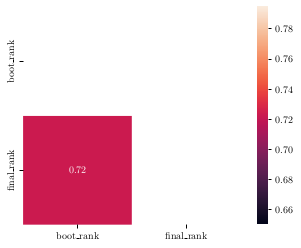

In [18]:
'''Pass inside a single dataframe all the values from the 5 runs, as different columns, then produce their correlation plot...'''

er = rs[['boot_rank','final_rank']]

# Calculate correlation between each pair of variable
corr_matrix=er.corr()
 
# Can be great to plot only a half matrix
# Generate a mask for the upper triangle
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

# Draw the heatmap with the mask
sns.heatmap(corr_matrix, mask=mask, square=True,annot=True, annot_kws={"size": 10})
#plt.savefig('correlation_heatmap_1.pgf')

In [6]:
dt = pd.read_csv('T_3_final/t_1/out-1.txt', names=['userid','itemid', 'rating'], sep=',')

# """Compute_Score_Pop_Expo_for_bootstrap"""


seq = cycle([1, 2, 3,4,5,6,7,8,9,10])
dt['seq'] = [next(seq) for count in range(dt.shape[0])]
dt['expo_score'] = dt['seq'].apply(lambda k: expo_score(k))
dt['pop_score'] = 1/len(dt)
dt = dt[['itemid','expo_score','pop_score']]
dt = dt.groupby('itemid').sum(['expo_score','pop_score']).reset_index()
dt = dt.sort_values(by=['expo_score'], ascending = False).reset_index(drop=True)
dt.to_csv('T_3_final/t_1/total_pop_score.txt', header=None, index=False, sep='\t', mode='w')
dt['index'] = range(1,len(dt)+1)
print(dt)


#fd_2 = fd_1.sort_values(by=['sum'], ascending=False).reset_index(drop=True)

#df = df.drop('seq')
# popular_data = compute_popularity_2(dt, 'itemid').reset_index(drop=True)
# popular_data['index'] = range(1,len(popular_data)+1)
# Total = dt['pop_score'].sum()
# print (Total)
#print(popular_data)
#dt['popularity'] = popular_data['popularity'].reset_index(drop=True)
#print(dt)
# sr = pd.DataFrame()
# sr = dt.merge(popular_data,on='itemid')
# sr = sr.drop_duplicates(keep='first').reset_index(drop=True)
# print(sr)

# sr['count'] = sr['itemid'].map(sr['itemid'].value_counts())
# sr = sr[['itemid','expo_score','popularity','count']]
# sr = sr.groupby('itemid').sum()
# sr = sr.sort_values(by=['expo_score'], ascending=False).reset_index()

# sr = sr[['itemid','expo_score','popularity']]

# #print(sr)


# sr = pd.read_csv('T_3_final/t_300/train-1.txt', names=['userid','itemid', 'rating'], sep='\t')
# data = compute_popularity(sr, 'itemid').reset_index(drop=True)
# data['index'] = range(1,len(data)+1)
#print(data)


      itemid  expo_score  pop_score  index
0        639   19.636364   0.000597      1
1       3304   18.727273   0.000564      2
2       1707   18.454545   0.000580      3
3       1450   18.363636   0.000531      4
4       1426   18.181818   0.000580      5
...      ...         ...        ...    ...
3074     831    3.545455   0.000182   3075
3075    2009    3.363636   0.000133   3076
3076    1626    3.363636   0.000116   3077
3077    2379    3.363636   0.000133   3078
3078    1484    3.000000   0.000083   3079

[3079 rows x 4 columns]


In [9]:
#'''Assign pop_score to DIC files per Iteration!'''


def total_count_score(N):
    for t in range(2, N):
        df_1 = pd.read_csv('T_3_final/t_' + str(t) + '/FOEIR-DIC_rec.txt', names=['userid', 'itemid', 'score', 'label','count'], sep=',')
        df_1 = df_1[['itemid','score']]
        df_1['pop_score'] = 1/len(df_1)
        df_1 = df_1.groupby('itemid').sum(['score','pop_score']).reset_index()
        print(df_1)
        #df_1.to_csv('T_3_final/t_1/total_pop_score.txt', header=None, index=False, sep='\t', mode='a')
        
#         st = pd.DataFrame()
#         st =pd.merge(df_1,data,on='itemid')
#         st = st.drop_duplicates(keep='first').reset_index(drop=True)
        #st = st.groupby('itemid').sum()
        #st = st.sort_values(by=['score'], ascending=False).reset_index()
        #print(st)
        #st['count'] = st['itemid'].map(st['itemid'].value_counts())
        #st = st.groupby('itemid').sum()
        #st = st.sort_values(by=['popularity'], ascending=False).reset_index()
        #print(st)
        #df_4 = df_4(['movieid', 'score']).groupby(['movieid']).sum('score').reset_index(drop=True)
        #df_4['count'] = df_4.groupby(['movieid']).size().reset_index(name='count')
        #df_4 = df_4.groupby(['movieid', 'label']).sum(['count', 'score']).reset_index()
        #df_3 = df_4[['movieid', 'count', 'score']]
        #df.to_csv('T_2/t_1/count_score'+str(t)+'.txt', header=None, index=['movieid'], sep='\t', mode='w')
        


total_count_score(301) #Run it once (otherwise delete file, appending mode (a)....

#"""Produces the final cumualative pop/expo_score values!"""

fd = pd.read_csv('T_3_final/t_1/total_pop_score.txt', names=['itemid','expo_score','pop_score'], sep='\t')
#dt = dt[['itemid']]
fd = fd.groupby('itemid').sum(['expo_score','pop_score']).reset_index()
print(fd)
st = pd.DataFrame()
st =pd.merge(dt,fd,on='itemid')
st['index'] = range(1,len(st)+1)
print(st)
fd_1 = fd.groupby('itemid').pop_score.agg(['sum']).reset_index()
fd_2 = fd_1.sort_values(by=['sum'], ascending=False).reset_index(drop=True)
print(fd_2)
#fd_2.to_csv('T_3/t_1/pop_score_all.txt', header=None, index=False, sep='\t', mode='w')

    itemid      score  pop_score
0       24   8.636364      0.095
1       36  90.909091      0.100
2      611  39.090909      0.100
3      633  42.727273      0.100
4      661  27.272727      0.100
5      728  54.545455      0.100
6      803  63.636364      0.100
7     1350  72.727273      0.100
8     1935  18.181818      0.100
9     2773  81.818182      0.100
10    2981   0.454545      0.005
   itemid      score  pop_score
0      24  17.454545        0.1
1     611  47.909091        0.1
2     633  52.090909        0.1
3     661  36.363636        0.1
4     728  63.636364        0.1
5     803  72.727273        0.1
6    1350  81.818182        0.1
7    1935  27.272727        0.1
8    2773  90.909091        0.1
9    2981   9.818182        0.1
    itemid      score  pop_score
0       24  27.181818      0.100
1      611  57.818182      0.100
2      633  60.363636      0.100
3      661  45.454545      0.100
4      728  72.727273      0.100
5      803  81.818182      0.100
6     1350  90.909091

    itemid      score  pop_score
0        6  22.818182      0.081
1       78   0.181818      0.002
2      150   1.727273      0.010
3      151  35.727273      0.092
4      427  43.000000      0.093
5      581  50.272727      0.099
6      754  64.909091      0.100
7     1068  16.090909      0.059
8     1207   9.090909      0.048
9     1587   0.909091      0.006
10    1593   6.000000      0.030
11    2702  27.363636      0.079
12    2778  82.272727      0.100
13    3019  51.818182      0.098
14    3657  87.272727      0.100
15    3800   0.545455      0.003
    itemid      score  pop_score
0        6  40.181818   0.092857
1       78  13.636364   0.064286
2      150   4.000000   0.021429
3      151  36.090909   0.089796
4      427  55.272727   0.100000
5      581  66.363636   0.100000
6      754  80.818182   0.098980
7     1068  29.272727   0.077551
8     1207  20.636364   0.079592
9     1479   0.181818   0.001020
10    1587   3.454545   0.015306
11    1593  16.454545   0.058163
12    2702

    itemid      score  pop_score
0      119  25.181818      0.067
1      144   4.272727      0.014
2      277   7.181818      0.024
3      349   0.181818      0.001
4      419  52.363636      0.095
5      427  48.909091      0.086
6     1083   2.181818      0.007
7     1305  81.818182      0.100
8     1336   4.818182      0.021
9     1508  31.181818      0.081
10    1929  47.000000      0.089
11    2058  19.909091      0.052
12    2167   2.545455      0.013
13    2500  20.454545      0.063
14    2666  42.727273      0.086
15    2918   0.090909      0.001
16    3012  12.818182      0.036
17    3258   8.000000      0.029
18    3320   1.727273      0.007
19    3347   2.454545      0.009
20    3786   0.090909      0.001
21    3804   3.818182      0.018
22    3877  80.272727      0.100
    itemid      score  pop_score
0      119  60.454545      0.097
1      144  23.272727      0.067
2      277  37.363636      0.073
3      349   1.454545      0.008
4      621   0.909091      0.004
5     1083

    itemid      score  pop_score
0       59  30.090909      0.067
1      237  11.454545      0.037
2      567  28.272727      0.062
3      592   3.636364      0.016
4      614  21.818182      0.052
5     1425  63.727273      0.093
6     1433  10.363636      0.030
7     1575  51.818182      0.086
8     1771   0.454545      0.002
9     2253   0.909091      0.003
10    2485  56.909091      0.091
11    2514  17.727273      0.050
12    2646   0.181818      0.001
13    2709   0.090909      0.001
14    2893   1.545455      0.005
15    2964  13.727273      0.040
16    3007   7.181818      0.020
17    3186  26.454545      0.050
18    3218   0.181818      0.001
19    3398   1.909091      0.005
20    3440   0.909091      0.003
21    3492   7.363636      0.019
22    3649  41.272727      0.084
23    3724   0.454545      0.002
24    3774  61.000000      0.092
25    3854  40.545455      0.088
    itemid      score  pop_score
0      195   0.181818   0.001010
1      318  28.454545   0.081818
2      588

    itemid      score  pop_score
0      170  21.909091   0.054545
1      234   5.363636   0.015152
2      432   6.181818   0.018182
3      453   9.636364   0.025253
4      514   1.909091   0.006061
5      583   5.272727   0.016162
6      708  15.000000   0.048485
7     1207  21.727273   0.060606
8     1217   6.272727   0.019192
9     1351   1.090909   0.004040
10    1433   7.727273   0.018182
11    1487   1.000000   0.003030
12    1525  85.181818   0.100000
13    1547   2.454545   0.007071
14    1687   5.545455   0.018182
15    1811   2.636364   0.012121
16    1839  18.818182   0.037374
17    1986   1.090909   0.004040
18    2050   2.454545   0.009091
19    2212  19.090909   0.054545
20    2271  30.909091   0.061616
21    2368   1.181818   0.004040
22    2626  20.363636   0.046465
23    2655  53.181818   0.089899
24    2751   6.181818   0.020202
25    2830   0.181818   0.002020
26    2975   4.454545   0.012121
27    3271  85.727273   0.100000
28    3313   0.454545   0.002020
29    3391

    itemid      score  pop_score
0      111   0.272727      0.002
1      121   3.818182      0.017
2      156  13.818182      0.041
3      289   0.545455      0.003
4      355   0.090909      0.001
5      370   0.454545      0.002
6      378   6.636364      0.021
7      417   8.090909      0.023
8      425   0.545455      0.003
9      483  64.090909      0.100
10     493   5.090909      0.020
11     600   0.090909      0.001
12     880   0.181818      0.001
13    1069   1.363636      0.005
14    1100   9.090909      0.027
15    1255  24.818182      0.063
16    1270   0.818182      0.006
17    1476  83.363636      0.100
18    1479   8.454545      0.031
19    1513  89.363636      0.100
20    1544   1.181818      0.005
21    1623   0.636364      0.002
22    1721   7.636364      0.022
23    1938   2.545455      0.008
24    2068   2.636364      0.011
25    2345  28.909091      0.076
26    2522   3.818182      0.014
27    2725   0.818182      0.004
28    2758  72.272727      0.100
29    2878

    itemid      score  pop_score
0       13   0.545455   0.002020
1       57   9.181818   0.024242
2       74  10.454545   0.027273
3      176   0.181818   0.001010
4      319   2.090909   0.004040
5      347  31.454545   0.054545
6      390   1.181818   0.006061
7      600   9.090909   0.019192
8      782   4.454545   0.011111
9     1068   2.272727   0.005051
10    1127  26.272727   0.053535
11    1416   2.181818   0.007071
12    1487   7.000000   0.018182
13    1549   3.363636   0.007071
14    1586  15.181818   0.028283
15    1589   6.454545   0.014141
16    1784  12.272727   0.023232
17    1806   0.545455   0.003030
18    1835   0.272727   0.001010
19    2065   0.272727   0.001010
20    2084  19.454545   0.033333
21    2152   0.272727   0.001010
22    2180   0.454545   0.002020
23    2189  12.818182   0.027273
24    2405   6.363636   0.020202
25    2478   0.454545   0.001010
26    2500  42.818182   0.074747
27    2513   0.454545   0.001010
28    2520   7.545455   0.018182
29    2625

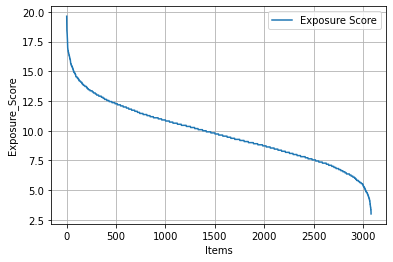

In [10]:
'''Visualizations of the above!!'''

plt.plot(st['index'],st['expo_score_x'], label = 'Exposure Score')
#plt.plot(range(10), linestyle='--', marker='o', color='b',
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,100])
#plt.title("Bootstrap Exposure Score")
plt.xlabel("Items")
plt.ylabel("Exposure_Score")
#plt.grid()
#figure = plt.subplots(2,2)
plt.legend()
plt.grid()
plt.show()

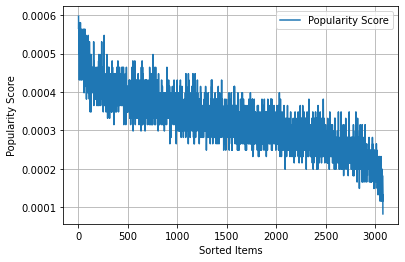

In [11]:
'''Visualizations of the above!!'''
plt.plot(st['index'], st['pop_score_x'], label = 'Popularity Score')
#plt.plot(range(10), linestyle='--', marker='o', color='b',
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,100])
#plt.title("Bootstrap Popularity Score")
plt.xlabel("Sorted Items")
plt.ylabel("Popularity Score")
#plt.grid()
#figure = plt.subplots(2,2)
plt.legend()
plt.grid()
plt.savefig('foeir_png/boot_pop_sorted.jpg',format='jpg',bbox_inches='tight', dpi=150)
plt.show()


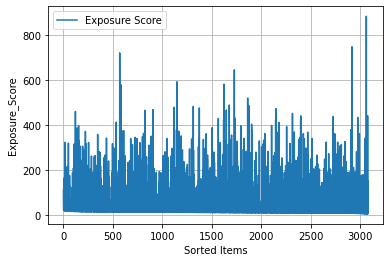

In [12]:
'''Visualizations of the above!!'''
plt.plot(st['index'], st['expo_score_y'], label = 'Exposure Score')
#plt.plot(range(10), linestyle='--', marker='o', color='b',
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,100])
#plt.title("Cumulative Exposure Score")
plt.xlabel("Sorted Items")
plt.ylabel("Exposure_Score")
#plt.grid()
#figure = plt.subplots(2,2)
plt.legend()
plt.grid()
plt.savefig('foeir_png/final_expo_sorted.jpg',format='jpg',bbox_inches='tight', dpi=150)
plt.show()


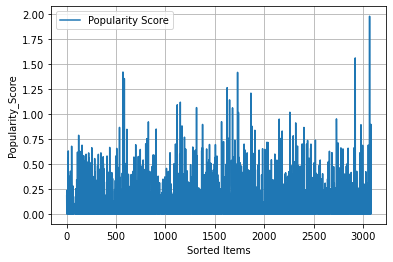

In [13]:
'''Visualizations of the above!!'''
plt.plot(st['index'], st['pop_score_y'], label = 'Popularity Score')
#plt.plot(range(10), linestyle='--', marker='o', color='b',
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,100])
#plt.title("Cumulative Popularity Score")
plt.xlabel("Sorted Items")
plt.ylabel("Popularity_Score")
#plt.grid()
#figure = plt.subplots(2,2)
plt.legend()
plt.grid()
plt.savefig('foeir_png/final_pop_sorted.jpg',format='jpg',bbox_inches='tight', dpi=150)
plt.show()


In [59]:
for t in range(2,301):

    test = pd.read_csv('T_3_final/t_' + str(t) + '/FOEIR-DIC_rec.txt', names=['userid', 'itemid', 'score', 'label','count'], sep=',')
    test = test.groupby(['itemid', 'label']).sum(['score']).reset_index()
    test = test.sort_values(by=['score'], ascending=False).reset_index(drop =True)
    test = test[['itemid','label','score']]
    print(test)
    #test.to_csv('T_3_final/t_' + str(t) + '/count_score.txt', header=None, index=None, sep='\t', mode='w')

    

    itemid  label      score
0       36  False  90.909091
1     2773  False  81.818182
2     1350   True  72.727273
3      803  False  63.636364
4      728   True  54.545455
5      633  False  42.727273
6      611   True  39.090909
7      661  False  27.272727
8     1935   True  18.181818
9       24  False   8.636364
10    2981   True   0.454545
   itemid  label      score
0    2773  False  90.909091
1    1350   True  81.818182
2     803  False  72.727273
3     728   True  63.636364
4     633   True  52.090909
5     611   True  47.909091
6     661  False  36.363636
7    1935   True  27.272727
8      24  False  17.454545
9    2981   True   9.818182
    itemid  label      score
0     1350   True  90.909091
1      803  False  81.818182
2      728   True  72.727273
3      633  False  60.363636
4      611   True  57.818182
5      661  False  45.454545
6     1935   True  36.363636
7       24  False  27.181818
8     2981   True  18.181818
9     2260  False   5.090909
10    1458  False   4.090

    itemid  label      score
0     1047  False  89.909091
1      111  False  76.909091
2     3247  False  72.909091
3     2285   True  69.363636
4      495  False  52.636364
5      179   True  47.363636
6     1875   True  36.090909
7     1779   True  27.272727
8     3119  False  12.909091
9      761  False   9.727273
10     270  False   4.181818
11    2702   True   0.363636
12    3438  False   0.363636
   itemid  label      score
0    2285   True  90.909091
1     495  False  81.636364
2     179   True  72.909091
3    1875   True  63.363636
4    1779   True  54.454545
5    3119  False  39.636364
6     761  False  35.818182
7     270  False  31.454545
8    3438  False  15.272727
9    2702   True  14.545455
    itemid  label      score
0      495  False  87.909091
1      179   True  83.090909
2     1875  False  71.090909
3     1779   True  63.454545
4     3119  False  50.181818
5      761  False  45.000000
6      270  False  38.181818
7     2702  False  24.545455
8     3438  False  22.545

    itemid  label      score
0     3388   True  72.818182
1     3446  False  66.545455
2     1613   True  56.272727
3     3339   True  55.454545
4     3171  False  42.727273
5     2702   True  33.909091
6     2405   True  33.818182
7     2557   True  33.181818
8     3951  False  28.000000
9     1879   True  20.545455
10    2816   True  18.636364
11    2430  False  16.181818
12    3430   True  11.090909
13    2428  False   0.454545
14    1440  False   0.181818
15    3088  False   0.181818
    itemid  label      score
0     2816   True  84.000000
1     2557   True  82.363636
2     3430   True  74.727273
3     1440   True  52.090909
4     2989  False  51.181818
5     2428  False  40.363636
6     3088  False  36.181818
7     2669   True  23.727273
8     2479  False  20.090909
9      599  False   9.363636
10    1594   True   9.000000
11    1936  False   6.909091
12    2301  False   4.000000
13    2970  False   1.000000
    itemid  label      score
0     1440  False  82.818182
1     2989  Fa

    itemid  label      score
0     2105  False  81.454545
1     1934  False  70.727273
2     2478  False  64.545455
3     3011  False  53.272727
4     1590   True  49.090909
5      942  False  45.090909
6     2307  False  30.363636
7     2552   True  18.363636
8     1147  False  14.181818
9     1911   True  12.454545
10    1558  False  11.727273
11    3846   True  11.636364
12    1549  False   8.727273
13    2167   True   7.545455
14    2689  False   4.181818
15    1946  False   3.363636
16    2310  False   2.090909
17     184  False   2.090909
18    3467   True   2.000000
19    1235  False   2.000000
20    2152   True   1.454545
21    1598  False   1.272727
22    3306  False   0.818182
23     327  False   0.727273
24    3391   True   0.545455
25    3912   True   0.272727
    itemid  label      score
0     1911   True  57.636364
1     2552   True  53.818182
2     1147  False  49.000000
3     3846   True  45.181818
4     1549  False  42.545455
5     2167   True  40.545455
6     2689  Fa

    itemid  label      score
0     2906  False  65.636364
1      367  False  65.545455
2      353  False  60.000000
3     3797  False  49.272727
4     2041  False  36.000000
5     2994  False  25.454545
6     3724   True  23.363636
7     3942  False  22.545455
8     3518  False  18.272727
9      924  False  18.000000
10    3876  False  13.909091
11    3017   True  13.272727
12    3102  False  13.000000
13     988  False  12.727273
14      59  False  12.272727
15    2970  False   9.818182
16    1918  False   7.636364
17    1550   True   5.727273
18     568  False   5.000000
19     176   True   3.818182
20    1178   True   3.727273
21    1857   True   3.545455
22    2944   True   2.636364
23    1816   True   2.545455
24    1493   True   2.000000
25    3029   True   1.545455
26     944   True   1.454545
27    2873   True   0.727273
28     419  False   0.272727
29    2844   True   0.181818
30    1879   True   0.090909
    itemid  label      score
0     3102  False  55.454545
1     3518  Fa

    itemid  label      score
0     3846  False  66.909091
1     3714  False  61.909091
2     3941  False  48.636364
3     2792  False  47.090909
4      965  False  31.454545
5     3952  False  29.909091
6     3090  False  27.000000
7     3005  False  24.181818
8     3095  False  23.454545
9     2646  False  22.090909
10    1278  False  21.545455
11    2642   True  15.090909
12    3074  False  10.454545
13    2939   True  10.272727
14     324  False   9.909091
15    2430   True   8.181818
16    2549   True   7.272727
17    3603   True   5.272727
18    3854  False   4.454545
19    1200  False   4.181818
20    1784   True   3.000000
21    1547  False   2.818182
22    1657   True   1.909091
23    1279  False   1.727273
24    1594   True   1.181818
25    1623   True   1.090909
26    3871   True   1.000000
27    2212   True   0.545455
28    1515   True   0.545455
29    2043   True   0.454545
30     860   True   0.454545
31    2702   True   0.363636
32    3055   True   0.272727
33    3346   T

    itemid  label      score
0     1635  False  48.727273
1     2418  False  46.636364
2     2167  False  42.909091
3     2170  False  40.636364
4     1547  False  37.272727
5     1279  False  36.181818
6     3222  False  30.181818
7      847  False  27.545455
8     1592   True  23.363636
9     1014  False  19.818182
10     896  False  19.636364
11    2155  False  18.545455
12    1550  False  17.909091
13    2751  False  15.636364
14    1455   True  11.181818
15     839  False  10.727273
16     540  False   8.909091
17      59  False   7.818182
18    1007   True   4.727273
19    1857   True   4.272727
20    3747   True   3.727273
21    2999   True   3.454545
22    2135   True   2.545455
23      64  False   2.454545
24     502   True   1.909091
25     176   True   1.545455
26    1240   True   1.272727
27    2636   True   0.909091
28    2963   True   0.909091
29    2844   True   0.818182
30    1816   True   0.818182
31    2431   True   0.636364
32     804   True   0.454545
33    2374   T

    itemid  label      score
0     2986  False  57.909091
1     1973  False  49.363636
2     3090  False  35.090909
3     1513  False  28.454545
4     2212  False  28.181818
5     1603  False  26.181818
6      788  False  23.818182
7      483  False  19.272727
8     3440   True  18.000000
9     2499  False  17.818182
10    1626  False  15.454545
11    3140  False  15.272727
12    2605   True  14.727273
13    1207  False  14.090909
14    2345  False  14.000000
15    2758   True  13.454545
16    1476  False  13.181818
17    1255  False  12.181818
18    3794  False  11.454545
19    1816   True   8.090909
20     156   True   7.545455
21    1068   True   5.818182
22    1479   True   5.636364
23    3807   True   5.090909
24     417   True   4.636364
25    1100   True   4.272727
26    3843   True   4.000000
27    3483   True   3.818182
28    3372   True   3.636364
29    2522   True   2.545455
30     378   True   2.454545
31     121   True   2.272727
32    1721   True   1.727273
33    3076  Fa

    itemid  label      score
0     3224  False  90.272727
1     2499  False  82.454545
2      445  False  27.363636
3     2915  False  27.272727
4     2543  False  23.636364
5     1987  False  22.909091
6     2301  False  21.272727
7      216  False  19.818182
8     1958  False  19.454545
9     3339  False  19.363636
10     321  False  17.272727
11    2628  False  16.181818
12    3786  False  15.090909
13     575  False  12.272727
14    2861   True  10.545455
15     532  False   7.909091
16    1855   True   7.454545
17    2824  False   5.727273
18     252   True   5.636364
19     494   True   5.454545
20    1523   True   5.181818
21    1493   True   5.000000
22    2101   True   4.545455
23    2135   True   4.181818
24    2286   True   4.000000
25    1003   True   3.636364
26    3094   True   2.090909
27     368   True   1.909091
28    3467   True   1.727273
29     370   True   1.727273
30    1771   True   1.636364
31     603  False   1.545455
32     972   True   1.181818
33     885   T

    itemid  label      score
0     1927  False  90.000000
1     3586  False  44.090909
2     1594  False  27.181818
3     1641  False  25.545455
4     2864  False  22.454545
5      960  False  22.181818
6     2286  False  21.363636
7      368  False  20.545455
8      343  False  19.636364
9     1836  False  17.272727
10    2757  False  16.272727
11    2271  False  15.272727
12    1806  False  14.818182
13     150  False  13.909091
14     498   True  11.909091
15     275   True  10.818182
16    2013   True   9.363636
17    2189  False   8.636364
18    1222  False   8.545455
19    3703  False   8.090909
20    1455   True   6.545455
21    2081   True   4.818182
22    1256   True   4.636364
23    3091   True   4.636364
24    3686   True   4.636364
25    2963   True   4.000000
26     111   True   3.909091
27     376   True   3.363636
28    3854   True   3.000000
29    3800   True   2.909091
30     170   True   2.818182
31    3547   True   2.181818
32    1603   True   1.909091
33    1270   T

In [74]:
for t in range(2,301):  
    print(t)
    df_n = pd.read_csv('T_3_final/t_' + str(t) + '/count_score.txt', names=['itemid', 'label', 'expo_score'], sep='\t')
    df_n['unpop'] = df_n.label[df_n.label == True].count()
    df_n['pop'] = df_n.label[df_n.label == False].count()
    print(df_n)
    df_n = df_n[['unpop','pop']].drop_duplicates()
    
    #df_m = pd.DataFrame()
    #df_n['unpop'] = df_n['unpop'].unique().reset_index()
    #df_n['pop'] = df_n['pop'].unique().reset_index()
    
    #df_n.to_csv('T_3_final/t_1/label_count.txt', header=None, index=False, sep='\t', mode='a')

2
    itemid  label  expo_score  unpop  pop
0       36  False   90.909091      5    6
1     2773  False   81.818182      5    6
2     1350   True   72.727273      5    6
3      803  False   63.636364      5    6
4      728   True   54.545455      5    6
5      633  False   42.727273      5    6
6      611   True   39.090909      5    6
7      661  False   27.272727      5    6
8     1935   True   18.181818      5    6
9       24  False    8.636364      5    6
10    2981   True    0.454545      5    6
3
   itemid  label  expo_score  unpop  pop
0    2773  False   90.909091      6    4
1    1350   True   81.818182      6    4
2     803  False   72.727273      6    4
3     728   True   63.636364      6    4
4     633   True   52.090909      6    4
5     611   True   47.909091      6    4
6     661  False   36.363636      6    4
7    1935   True   27.272727      6    4
8      24  False   17.454545      6    4
9    2981   True    9.818182      6    4
4
    itemid  label  expo_score  unpop  p

    itemid  label  expo_score  unpop  pop
0     1785   True   88.181818      6    5
1     3828  False   75.545455      6    5
2     1919  False   71.454545      6    5
3     3338   True   62.636364      6    5
4      757   True   49.363636      6    5
5     2152   True   47.272727      6    5
6     3814   True   42.363636      6    5
7      665  False   26.363636      6    5
8      927  False   22.545455      6    5
9     2938  False    9.181818      6    5
10    3095   True    0.090909      6    5
46
    itemid  label  expo_score  unpop  pop
0     3338   True   86.818182      6    7
1      757   True   72.909091      6    7
2     2152   True   68.909091      6    7
3     3814   True   65.545455      6    7
4      665  False   58.909091      6    7
5      927  False   51.727273      6    7
6     2938  False   36.000000      6    7
7     3095   True   24.909091      6    7
8     3657  False   15.909091      6    7
9     2778  False   12.454545      6    7
10     581  False    0.363636  

    itemid  label  expo_score  unpop  pop
0     3756  False   84.454545      5   13
1     1054  False   63.181818      5   13
2     2727  False   61.909091      5   13
3     2485  False   56.454545      5   13
4     2899  False   51.818182      5   13
5       78   True   43.909091      5   13
6     1834   True   39.454545      5   13
7      173  False   27.090909      5   13
8     2305   True   26.818182      5   13
9        7  False   24.272727      5   13
10    2307  False   14.272727      5   13
11     177  False    2.272727      5   13
12    3504  False    1.818182      5   13
13     150   True    1.636364      5   13
14     153  False    0.272727      5   13
15    2970  False    0.181818      5   13
16     860  False    0.090909      5   13
17    1589   True    0.090909      5   13
90
    itemid  label  expo_score  unpop  pop
0     1834   True   81.909091      8   12
1      173  False   80.545455      8   12
2        7  False   72.363636      8   12
3     3675  False   42.818182  

    itemid  label  expo_score  unpop  pop
0      312  False   73.545455     12   17
1      289  False   66.545455     12   17
2     2888  False   61.181818     12   17
3     2560   True   60.727273     12   17
4     1042   True   50.272727     12   17
5     3886   True   34.363636     12   17
6      567  False   23.000000     12   17
7     2624  False   22.909091     12   17
8      198  False   21.545455     12   17
9     3864  False   20.454545     12   17
10    3715  False   20.181818     12   17
11     348  False   18.363636     12   17
12    1985  False    6.272727     12   17
13    2710   True    5.181818     12   17
14    2027  False    2.909091     12   17
15    3634  False    2.727273     12   17
16     806  False    2.181818     12   17
17    3007  False    1.818182     12   17
18    2072   True    1.454545     12   17
19    3492   True    1.454545     12   17
20    1431   True    1.090909     12   17
21    2844   True    0.545455     12   17
22    1747  False    0.272727     

    itemid  label  expo_score  unpop  pop
0     3398  False   90.818182     13   17
1      318  False   62.000000     13   17
2     3218  False   53.818182     13   17
3     1941  False   42.909091     13   17
4     2646  False   42.818182     13   17
5     1771  False   33.545455     13   17
6     2893  False   33.454545     13   17
7     2709  False   27.636364     13   17
8     1493   True   20.090909     13   17
9     3814  False   17.818182     13   17
10     588   True   17.363636     13   17
11    2792  False    9.181818     13   17
12    2072  False    7.272727     13   17
13    3040  False    7.181818     13   17
14     195   True    6.090909     13   17
15     910   True    4.727273     13   17
16    3335  False    4.181818     13   17
17    1753  False    3.454545     13   17
18    2086   True    2.727273     13   17
19     319   True    2.636364     13   17
20    2057  False    2.636364     13   17
21    1879   True    1.818182     13   17
22    2056  False    1.636364     

    itemid  label  expo_score  unpop  pop
0     2549  False   69.909091     13   17
1     1278  False   58.909091     13   17
2     3095  False   51.636364     13   17
3     2939  False   37.818182     13   17
4      324  False   37.727273     13   17
5     3074  False   36.363636     13   17
6     2043  False   29.909091     13   17
7     1200  False   24.090909     13   17
8     3854  False   23.363636     13   17
9     2430  False   20.454545     13   17
10    1547  False   17.363636     13   17
11    1279  False   15.272727     13   17
12    1784   True   11.181818     13   17
13    1657  False    8.454545     13   17
14     860   True    7.090909     13   17
15    2212  False    6.636364     13   17
16    3346  False    6.545455     13   17
17    1623   True    5.363636     13   17
18    1594   True    4.454545     13   17
19    3871   True    4.363636     13   17
20    2037  False    4.363636     13   17
21    1515   True    1.818182     13   17
22    2527   True    1.727273     

190
    itemid  label  expo_score  unpop  pop
0     3859  False   90.909091     20   17
1     3516  False   44.000000     20   17
2     2239  False   40.727273     20   17
3     1200  False   37.090909     20   17
4     1946  False   34.000000     20   17
5     2994  False   28.727273     20   17
6      837  False   22.090909     20   17
7     1829  False   22.090909     20   17
8      170  False   21.727273     20   17
9     3352  False   20.454545     20   17
10     119  False   17.818182     20   17
11    1007   True   16.090909     20   17
12    2878  False   15.909091     20   17
13    3342   True   12.545455     20   17
14    1126   True   10.090909     20   17
15    1855   True    9.454545     20   17
16    3468  False    9.363636     20   17
17    3524   True    8.727273     20   17
18    1387  False    5.545455     20   17
19    2629   True    5.090909     20   17
20    2050   True    4.909091     20   17
21    1515   True    3.636364     20   17
22     888   True    3.363636 

    itemid  label  expo_score  unpop  pop
0     1998  False   62.545455     25   17
1     3685  False   51.000000     25   17
2     3690  False   40.909091     25   17
3     2396  False   40.545455     25   17
4      670  False   34.181818     25   17
5     1590  False   32.909091     25   17
6      987  False   20.636364     25   17
7     1178  False   20.090909     25   17
8     3310  False   18.818182     25   17
9      277  False   16.272727     25   17
10    1958  False   15.363636     25   17
11    3105  False   11.545455     25   17
12    1986   True   11.454545     25   17
13    1824   True   11.090909     25   17
14    3928   True   11.000000     25   17
15    2096   True   10.545455     25   17
16    2701  False    9.272727     25   17
17    2959  False    8.909091     25   17
18    1679  False    8.636364     25   17
19     880   True    7.727273     25   17
20    3811   True    7.636364     25   17
21    3166   True    6.727273     25   17
22    3798  False    5.818182     

    itemid  label  expo_score  unpop  pop
0     1414  False   64.818182     33   17
1     2751  False   63.181818     33   17
2      177  False   59.545455     33   17
3     2423  False   39.545455     33   17
4      783  False   33.818182     33   17
5     1594  False   29.000000     33   17
6     2523  False   28.545455     33   17
7     3547  False   26.909091     33   17
8     1054  False   20.272727     33   17
9     1450  False   20.090909     33   17
10     445  False   11.272727     33   17
11    1014  False   11.181818     33   17
12    1126   True   10.181818     33   17
13     542   True    8.090909     33   17
14    3824  False    7.818182     33   17
15    3196   True    7.363636     33   17
16     643  False    6.545455     33   17
17    1027   True    6.363636     33   17
18    1475  False    5.363636     33   17
19     670  False    5.181818     33   17
20    2380   True    4.636364     33   17
21    1217   True    4.090909     33   17
22    3811   True    3.909091     

    itemid  label  expo_score  unpop  pop
0     2625  False   62.545455     28   17
1     2947  False   55.818182     28   17
2     2500  False   42.818182     28   17
3     2736  False   31.545455     28   17
4      347  False   31.454545     28   17
5     1127  False   26.272727     28   17
6     3074  False   20.454545     28   17
7     2084  False   19.454545     28   17
8     3105  False   17.818182     28   17
9     1586   True   15.181818     28   17
10    3649  False   14.818182     28   17
11    3821  False   14.545455     28   17
12    2189  False   12.818182     28   17
13    2926  False   12.636364     28   17
14    1784   True   12.272727     28   17
15      74  False   10.454545     28   17
16      57   True    9.181818     28   17
17     600   True    9.090909     28   17
18    2824  False    8.818182     28   17
19    3573  False    8.727273     28   17
20    3102  False    8.545455     28   17
21    2520   True    7.545455     28   17
22    1487   True    7.000000     

    itemid  label  expo_score  unpop  pop
0     3703  False   82.272727     34   18
1     2757  False   46.727273     34   18
2     2271  False   39.454545     34   18
3      498  False   33.909091     34   18
4     2189  False   30.090909     34   18
5      960  False   21.545455     34   18
6     3308  False   21.000000     34   18
7     1256  False   20.818182     34   18
8     3854  False   20.727273     34   18
9     2904  False   18.909091     34   18
10    3800  False   14.818182     34   18
11     376  False   14.545455     34   18
12    3547  False   13.909091     34   18
13    3679  False   13.545455     34   18
14    1547  False    8.818182     34   18
15    1544   True    7.909091     34   18
16    2081  False    7.181818     34   18
17    2879   True    5.909091     34   18
18    1083   True    5.909091     34   18
19    3938   True    5.272727     34   18
20    2275   True    4.909091     34   18
21     170   True    4.909091     34   18
22    1270   True    4.727273     

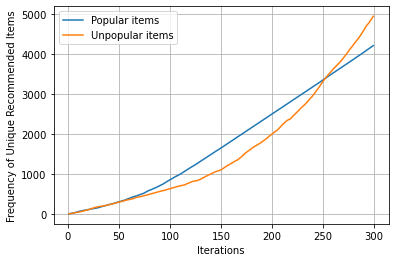

In [14]:
fm = pd.read_csv('T_3_final/t_1/label_count.txt', names=[ 'unpop', 'pop'], sep='\t')
fm['unpop_cum_score'] = fm['unpop'].cumsum().astype(float)
fm['pop_cum_score'] = fm['pop'].cumsum().astype(float)
fm['index'] = range(1, len(fm) + 1)
#print(fm)
plt.plot(fm['index'], fm['pop_cum_score'], label = 'Popular items')
plt.plot(fm['index'], fm['unpop_cum_score'], label = 'Unpopular items')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Cumulative Number of Unique Recommended Pop/Unpop Items")
plt.xlabel("Iterations")
plt.ylabel("Frequency of Unique Recommended Items")
plt.legend()
plt.grid()
plt.savefig('foeir_png/Unique_Rec_Items.jpg',format='jpg',bbox_inches='tight', dpi=150)
plt.show()


In [34]:
"Compute FInal Cumulative Exposure Scores and their Visualizations" # No Need for prior code running!

def total_count_score(N):
    for t in range(1, N):
        if t == 1:
            dt = pd.read_csv('T_3_final/t_1/out-1.txt', names=['userid', 'itemid', 'rating'], sep=',')
            seq = cycle([1, 2, 3,4,5,6,7,8,9,10])
            dt['seq'] = [next(seq) for count in range(dt.shape[0])]
            dt['expo_score'] = dt['seq'].apply(lambda k: expo_score(k))
            dt['count'] = 1
            dt = dt.groupby('itemid').sum(['expo_score','count']).reset_index()
            dt = dt.sort_values(by=['expo_score'], ascending = False).reset_index(drop=True)
            dt = dt[['itemid','expo_score','count']]
            #print(dt)
            #dt.to_csv('T_4_final/t_1/count_score1.txt', header=None, index=False, sep='\t', mode='w')
        else:
            df_1 = pd.read_csv('T_3_final/t_' + str(t) + '/FOEIR-DIC_rec.txt', names=['userid', 'itemid', 'score','label','count'], sep=',')
            df_1 = df_1[['itemid','score']]
            df_1['count'] = 1
            df_1 = df_1.groupby('itemid').sum(['score','count']).reset_index()
            df_1 = df_1.sort_values(by=['score'], ascending = False).reset_index(drop=True)
            #print(df_1)
            #df_1.to_csv('T_4_final/t_' + str(t) + '/count_score.txt', header=None, index=False, sep='\t', mode='w')
            #df_1.to_csv('T_4_final/t_1/count_score.txt', header=None, index=False, sep='\t', mode='a')

total_count_score(301)



In [35]:
fd = pd.read_csv('T_3_final/t_1/count_score1.txt', names=['itemid', 'score', 'count'], sep='\t')
fd = fd.groupby('itemid').sum(['score','count']).reset_index()
fd = fd.sort_values(by=['score'], ascending=False).reset_index(drop=True)
#print(fd)
#fd.to_csv('T_3_final/t_1/count_score_all_1.txt', header=None, index=False, sep='\t', mode='w')

In [36]:
"""Create_Per_Itemid_score,label,iteration"""


def score_per_item_iteration(T):
    #pd_1 = pd.read_csv('T_2/t_1/count_score.txt', names=['itemid', 'count', 'score', 'label'], sep='\t')
    for i in range(1, T):
        if i == 1:
            data = pd.read_csv('T_3_final/t_' + str(i) + '/count_score1.txt', names=['itemid', 'label', 'score'], sep='\t')
            #data = data.drop_duplicates().reset_index(drop=True)
            data['iteration'] = i
            #print(data)
            #data.to_csv('T_4_final/t_1/new_data_per_iter_all_1.txt', header=None, index=None, sep='\t', mode='w')
        else:
            data = pd.read_csv('T_3_final/t_' + str(i) + '/count_score.txt', names=['itemid', 'label', 'score'],sep='\t')
            #data = data.drop_duplicates().reset_index(drop=True)
            data['iteration'] = i
            #print(data)
            #data.to_csv('T_4_final/t_1/new_data_per_iter_all_1.txt', header=None, index=None, sep='\t', mode='a')

score_per_item_iteration(301)

In [6]:
pd_1 = pd.read_csv('T_3_final/t_1/new_data_per_iter_all_1.txt', names=['itemid', 'label', 'score', 'iteration'],sep='\t')
items = list(pd_1['itemid'].unique())

for it in items:

    #dt = pd.read_csv('T_3/t_1/new_data_per_iter_all_1.txt', names=['itemid', 'count', 'score', 'label', 'iteration'], sep ='\t')
    data_query = pd_1[(pd_1['itemid'] == it)].reset_index(drop=True).drop_duplicates()
    data_query.dropna(axis=1, thresh=1)
    #print(data_query)
    #data_query.to_csv('T_3_final/t_1/score_per_itm_iter' + str(it) + '.txt', header=None, index=None, sep='\t', mode='w')
    

In [7]:
pd_2 = pd.read_csv('T_3_final/t_1/count_score_all.txt', names=['itemid', 'score','count'], sep='\t')
items_ranked = list(pd_2['itemid'].unique())
#print(items_ranked)
items_plot_2 = []

In [8]:
for i in items_ranked[0:3]:
    pd_3 = pd.read_csv('T_3_final/t_1/score_per_itm_iter' + str(i) + '.txt', names=['itemid', 'label', 'cum_score', 'iteration'], sep='\t')
    pd_3['cum_score'] = pd_3['cum_score'].cumsum().astype(float)
    items_plot_2.append(pd_3)
    
for j in items_ranked[-3:]:
    pd_2 = pd.read_csv('T_3_final/t_1/score_per_itm_iter' + str(j) + '.txt', names=['itemid', 'label', 'cum_score', 'iteration'], sep='\t')
    pd_2['cum_score'] = pd_2['cum_score'].cumsum().astype(float)
    items_plot_2.append(pd_2)
    
items_plot_2 = items_plot_2[:3]

In [9]:
items_recommended_3 = []
for i in items_ranked:    
    pd_3 = pd.read_csv('T_3_final/t_1/score_per_itm_iter' + str(i) + '.txt', names=['itemid', 'label', 'cum_score', 'iteration'], sep='\t')
    pd_3['cum_score'] = pd_3['cum_score'].cumsum().astype(float)
    if len(pd_3) > 1:
        items_recommended_3.append(i)
        
print(len(items_recommended_3))

877


In [10]:
for j in items_recommended_3[-3:]:
    pd_2 = pd.read_csv('T_3_final/t_1/score_per_itm_iter' + str(j) + '.txt', names=['itemid', 'label', 'cum_score', 'iteration'], sep='\t')
    pd_2['cum_score'] = pd_2['cum_score'].cumsum().astype(float)
    items_plot_2.append(pd_2)
print(items_plot_2)

[    itemid  label   cum_score  iteration
0     2522   True    4.181818          1
1     2522  False    4.454545          6
2     2522  False    4.818182          7
3     2522  False   22.909091          8
4     2522  False   50.272727          9
5     2522  False   86.545455         10
6     2522  False  141.272727         11
7     2522  False  212.636364         12
8     2522  False  294.090909         13
9     2522   True  296.454545         22
10    2522   True  308.181818         23
11    2522   True  325.909091         24
12    2522   True  347.636364         25
13    2522   True  384.272727         26
14    2522   True  450.272727         27
15    2522   True  516.272727         28
16    2522   True  518.727273         60
17    2522   True  553.545455         61
18    2522   True  626.636364         62
19    2522   True  626.818182        144
20    2522   True  629.909091        145
21    2522   True  649.636364        146
22    2522   True  682.818182        147
23    2522   Tr

0
1
2
3
4
5


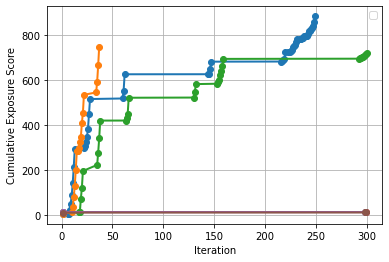

In [11]:
#print(items_plot_2)

for i,j in enumerate(items_plot_2):
    #print(i)
    plt.plot(items_plot_2[i]['iteration'], items_plot_2[i]['cum_score'],linestyle='-', linewidth=2, marker='o')
#plt.title("Exposure Score Over Time for the top/bottom 3 exposed items")
plt.xlabel("Iteration")
plt.ylabel("Cumulative Exposure Score")
plt.legend('')
plt.grid()
plt.savefig('foeir_png/Exposure_over_iter.jpg',format='jpg',bbox_inches='tight', dpi=150)
plt.show()


In [31]:
'''Work on Userid level...Run it once only...for 300 iterations!'''
for i in range(1,301):
    if i==1:
        #1,3921,1,1,0.9090909090909092,False,24
        df = pd.read_csv('T_3_final/t_1/out-1-new.txt',names=['userid','itemid','index','cycle','score','label','count'],sep=',')
        #df['user_count'] = 1
        df['iteration'] = i
        df = df[['userid','itemid','label','iteration']]
        #df = df.groupby('userid').sum(['user_count']).reset_index()
        #df = df.sort_values(by=['user_count'], ascending = False).reset_index(drop=True)
        #print(df)
        #df.to_csv('T_3_final/t_1/usr_freq.txt', header=None, index=None, sep='\t', mode='w')
    else:
        df_1 = pd.read_csv('T_3_final/t_' + str(i) +'/FOEIR-DIC_rec.txt',names=['userid','itemid','score','label','count'], sep=',')
        #df_1['user_count'] = 1
        df_1['iteration'] = i
        df_1 = df_1[['userid','itemid','label','iteration']]
        #df_1 = df_1.groupby('userid').sum(['user_count']).reset_index()
        #print(df_1)
        #df_1.to_csv('T_3_final/t_1/usr_freq.txt', header=None, index=None, sep='\t', mode='a')

In [12]:
pdf = pd.read_csv('T_3_final/t_1/usr_freq.txt',names=['userid','itemid','label','iteration'],sep='\t')
pdf['User Frequency of Appearance'] = 1
pdf = pdf[["userid",'User Frequency of Appearance']]

pdf = pdf.groupby('userid').sum(['User Frequency of Appearance']).reset_index()
pdf = pdf.sort_values(by=['User Frequency of Appearance'], ascending = False).reset_index(drop=True)
pdf['index'] = range(1,len(pdf)+1)
print(pdf)

      userid  User Frequency of Appearance  index
0       2421                           200      1
1       5772                           200      2
2       1190                           200      3
3       3979                           190      4
4       1307                           190      5
...      ...                           ...    ...
6025    4722                            10   6026
6026    1793                            10   6027
6027    3880                            10   6028
6028    1790                            10   6029
6029     635                            10   6030

[6030 rows x 3 columns]


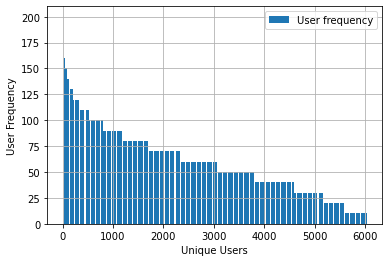

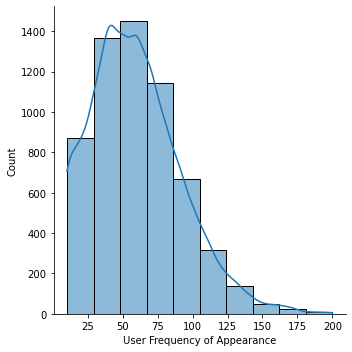

In [13]:
plt.bar(pdf['index'],pdf['User Frequency of Appearance'],
         label = 'User frequency')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("")
plt.xlabel("Unique Users")
plt.ylabel("User Frequency")
plt.legend()
plt.grid()
plt.savefig('foeir_png/user_frequency_300.jpg',format='jpg',bbox_inches='tight', dpi=150)
plt.show()



sns.displot(pdf['User Frequency of Appearance'],bins=10,kde=True);
plt.savefig('foeir_png/user_frequency_dist_300.jpg',format='jpg',bbox_inches='tight', dpi=150)

In [70]:
'''Work on Userid level...Run it once only...for 100 iterations!'''
for t in range(1,101):
    if t==1:
        #1,3921,1,1,0.9090909090909092,False,24
        dfs = pd.read_csv('T_3_final/t_1/out-1-new.txt',names=['userid','itemid','index','cycle','score','label','count'],sep=',')
        #df['user_count'] = 1
        dfs['iteration'] = t
        dfs = dfs[['userid','itemid','label','iteration']]
        #df = df.groupby('userid').sum(['user_count']).reset_index()
        #df = df.sort_values(by=['user_count'], ascending = False).reset_index(drop=True)
        #print(dfs)
        dfs.to_csv('T_3_final/usr_freq_1_100.txt', header=None, index=None, sep='\t', mode='w')
    else:
        dfs_1 = pd.read_csv('T_3_final/t_' + str(t) +'/FOEIR-DIC_rec.txt',names=['userid','itemid','score','label','count'], sep=',')
        #df_1['user_count'] = 1
        dfs_1['iteration'] = t
        dfs_1 = dfs_1[['userid','itemid','label','iteration']]
        #df_1 = df_1.groupby('userid').sum(['user_count']).reset_index()
        #print(dfs_1)
        dfs_1.to_csv('T_3_final/t_1/usr_freq_100.txt', header=None, index=None, sep='\t', mode='a')

In [14]:
pdf_1 = pd.read_csv('T_3_final/t_1/usr_freq_100.txt',names=['userid','itemid','label','iteration'],sep='\t')
pdf_1['User Frequency of Appearance'] = 1
pdf_1 = pdf_1[["userid",'User Frequency of Appearance']]

pdf_1 = pdf_1.groupby('userid').sum(['User Frequency of Appearance']).reset_index()
pdf_1 = pdf_1.sort_values(by=['User Frequency of Appearance'], ascending = False).reset_index(drop=True)
pdf_1['index'] = range(1,len(pdf_1)+1)
print(pdf_1)

      userid  User Frequency of Appearance  index
0       5179                            80      1
1       2224                            80      2
2       5203                            80      3
3       5441                            70      4
4       2421                            70      5
...      ...                           ...    ...
4839    3178                            10   4840
4840    3179                            10   4841
4841    1374                            10   4842
4842    4367                            10   4843
4843    4766                            10   4844

[4844 rows x 3 columns]


/tmp/ipykernel_7160/3678511589.py:12: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/user_frequency_100_3.jpg',box_inches='tight', dpi=150)


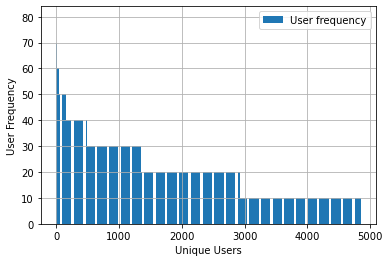

/tmp/ipykernel_7160/3678511589.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/user_frequency_100_dist.jpg',box_inches='tight', dpi=150)


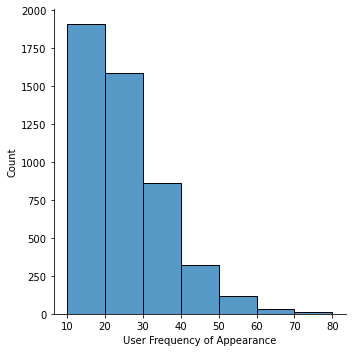

In [15]:
plt.bar(pdf_1['index'],pdf_1['User Frequency of Appearance'],
         label = 'User frequency')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("User Frequency over 100 Iterations")
plt.xlabel("Unique Users")
plt.ylabel("User Frequency")
plt.legend()
plt.grid()
plt.savefig('foeir_png/user_frequency_100_3.jpg',box_inches='tight', dpi=150)
plt.show()



sns.displot(pdf_1['User Frequency of Appearance'],bins=7)
plt.savefig('foeir_png/user_frequency_100_dist.jpg',box_inches='tight', dpi=150)

In [96]:
ps = pd.read_csv('T_3_final/t_1/usr_freq.txt',names=['userid','itemid','label','iteration'],sep='\t')
users = list(ps['userid'].unique())

for us in users:
    data = ps[(ps['userid'] == us)].reset_index(drop=True)
    data.dropna(axis=1, thresh=1)
    print(data)
    #data.to_csv('T_3_final/t_1/recitem_per_userid' + str(us) + '.txt', header=None, index=None, sep='\t', mode='w')
    

    userid  itemid  label  iteration
0        1    3921  False          1
1        1     914   True          1
2        1    1297  False          1
3        1    1597   True          1
4        1    3079   True          1
5        1    1946   True          1
6        1     829  False          1
7        1    2253  False          1
8        1     570   True          1
9        1     381  False          1
10       1     179   True         37
11       1     495  False         37
12       1    1875  False         37
13       1    1779   True         37
14       1    3119  False         37
15       1     270  False         37
16       1     761  False         37
17       1    3438  False         37
18       1    2702  False         37
19       1    1214   True         37
20       1    2340  False         65
21       1    2130  False         65
22       1    3173  False         65
23       1    2818   True         65
24       1    1539   True         65
25       1    3774  False         65
2

     userid  itemid  label  iteration
0        63    2762  False          1
1        63    1806   True          1
2        63     869  False          1
3        63    3203  False          1
4        63    2757   True          1
..      ...     ...    ...        ...
105      63    1547  False        294
106      63    1946  False        294
107      63     592  False        294
108      63    1288   True        294
109      63     972   True        294

[110 rows x 4 columns]
   userid  itemid  label  iteration
0      64    2105   True          1
1      64    1833   True          1
2      64    3593   True          1
3      64     503   True          1
4      64     192   True          1
5      64    1235  False          1
6      64    2260  False          1
7      64      34   True          1
8      64      26   True          1
9      64    2146  False          1
    userid  itemid  label  iteration
0       65    3118   True          1
1       65     268  False          1
2       65   

    userid  itemid  label  iteration
0      123    2068  False          1
1      123    1942   True          1
2      123    2464   True          1
3      123     356   True          1
4      123    1476   True          1
..     ...     ...    ...        ...
95     123    2332  False        277
96     123    3828   True        277
97     123    1147   True        277
98     123    2192   True        277
99     123    1040   True        277

[100 rows x 4 columns]
    userid  itemid  label  iteration
0      124    2788   True          1
1      124    3620   True          1
2      124    2687   True          1
3      124    3837   True          1
4      124    2977  False          1
5      124    1358   True          1
6      124    3636   True          1
7      124    3167   True          1
8      124    1942   True          1
9      124    1302   True          1
10     124    1957   True         88
11     124    3252  False         88
12     124    3040  False         88
13     124    

    userid  itemid  label  iteration
0      186      28  False          1
1      186    1023  False          1
2      186     477   True          1
3      186     358  False          1
4      186    3645   True          1
5      186    2899   True          1
6      186    3573  False          1
7      186    2473   True          1
8      186    3004   True          1
9      186    2164  False          1
10     186      64  False        198
11     186     839  False        198
12     186     502  False        198
13     186      25  False        198
14     186    1857  False        198
15     186    2963   True        198
16     186     972  False        198
17     186    2283  False        198
18     186    2431  False        198
19     186    2844  False        198
    userid  itemid  label  iteration
0      187     414   True          1
1      187     257   True          1
2      187    3668   True          1
3      187     829  False          1
4      187    2839  False          1
.

    userid  itemid  label  iteration
0      248    3690   True          1
1      248    3258  False          1
2      248    3025  False          1
3      248    2405  False          1
4      248    2328   True          1
5      248    2000  False          1
6      248    2479   True          1
7      248    1101   True          1
8      248    3565   True          1
9      248     219   True          1
10     248    2720  False         61
11     248    2453  False         61
12     248    2261  False         61
13     248    2566  False         61
14     248    1880  False         61
15     248    3931  False         61
16     248    2522   True         61
17     248    2756   True         61
18     248     175   True         61
19     248    1484  False         61
20     248    1438  False        158
21     248    3095  False        158
22     248    2984   True        158
23     248    3590  False        158
24     248    1550   True        158
25     248    2385  False        158
2

    userid  itemid  label  iteration
0      305     234   True          1
1      305    3285  False          1
2      305    1465   True          1
3      305    2380  False          1
4      305    2888   True          1
5      305    2753   True          1
6      305     957  False          1
7      305    3442   True          1
8      305    3230   True          1
9      305    3587  False          1
10     305    3410  False        237
11     305    3614  False        237
12     305     517  False        237
13     305     783   True        237
14     305    3747   True        237
15     305    1414  False        237
16     305    2499  False        237
17     305    1816  False        237
18     305    2751  False        237
19     305    3147  False        237
20     305     336  False        248
21     305    1928  False        248
22     305     384  False        248
23     305    1767  False        248
24     305    3794  False        248
25     305     432  False        248
2

    userid  itemid  label  iteration
0      365    1857  False          1
1      365     413   True          1
2      365    2289   True          1
3      365    2915  False          1
4      365    1648  False          1
5      365    2671  False          1
6      365    2072  False          1
7      365    3592  False          1
8      365     929   True          1
9      365    2467   True          1
10     365    1255  False        231
11     365    2345  False        231
12     365    2878  False        231
13     365    3843   True        231
14     365     417  False        231
15     365     425   True        231
16     365    1721   True        231
17     365    2725   True        231
18     365     370   True        231
19     365    1479  False        231
20     365    3196  False        247
21     365     972   True        247
22     365    2856  False        247
23     365    1479  False        247
24     365     234   True        247
25     365     670  False        247
2

     userid  itemid  label  iteration
0       426    3672  False          1
1       426    3945  False          1
2       426    3423  False          1
3       426    2872  False          1
4       426    2989   True          1
..      ...     ...    ...        ...
115     426    2491   True        291
116     426    1222  False        291
117     426    3715  False        291
118     426     592   True        291
119     426    2752  False        291

[120 rows x 4 columns]
    userid  itemid  label  iteration
0      427    3500   True          1
1      427    2617   True          1
2      427     915   True          1
3      427      81   True          1
4      427    2298   True          1
5      427    2685   True          1
6      427    3207   True          1
7      427    1051  False          1
8      427     458   True          1
9      427    1472  False          1
10     427    3814   True         46
11     427    3338   True         46
12     427     757   True         46
13

    userid  itemid  label  iteration
0      488    2967   True          1
1      488    1012   True          1
2      488    3438   True          1
3      488    3755   True          1
4      488     869  False          1
..     ...     ...    ...        ...
65     488    1311  False        298
66     488     252  False        298
67     488    3870  False        298
68     488    3686  False        298
69     488    1779   True        298

[70 rows x 4 columns]
   userid  itemid  label  iteration
0     489    1414  False          1
1     489    1602  False          1
2     489    3168   True          1
3     489    1996   True          1
4     489    3919   True          1
5     489    2853   True          1
6     489    3777   True          1
7     489    3790  False          1
8     489    1686   True          1
9     489     107   True          1
    userid  itemid  label  iteration
0      490    3572   True          1
1      490    3689   True          1
2      490    1653   True 

    userid  itemid  label  iteration
0      550    2643   True          1
1      550    1236  False          1
2      550    3310   True          1
3      550    1173   True          1
4      550     751   True          1
5      550      68   True          1
6      550    1957   True          1
7      550    1874  False          1
8      550     160  False          1
9      550     518  False          1
10     550     665  False         47
11     550     927  False         47
12     550    2938  False         47
13     550    3095   True         47
14     550    3657   True         47
15     550    2778  False         47
16     550     754   True         47
17     550     427  False         47
18     550    2702   True         47
19     550    3019   True         47
20     550    3335  False        144
21     550    1509  False        144
22     550    2424  False        144
23     550    1879  False        144
24     550    1592  False        144
25     550    2345  False        144
2

    userid  itemid  label  iteration
0      607    3520   True          1
1      607    2976   True          1
2      607    2248   True          1
3      607    2867  False          1
4      607     866  False          1
5      607    3435   True          1
6      607    3448   True          1
7      607     299   True          1
8      607    2820   True          1
9      607    2078  False          1
10     607    3727  False         87
11     607    3252  False         87
12     607    1957   True         87
13     607     348  False         87
14     607    2710   True         87
15     607    1879   True         87
16     607    3040  False         87
17     607    2899  False         87
18     607    2727  False         87
19     607    1054  False         87
20     607    1839   True        184
21     607    2271  False        184
22     607    1207  False        184
23     607    2655  False        184
24     607    1433  False        184
25     607    3391   True        184
2

    userid  itemid  label  iteration
0      669    2616  False          1
1      669    3001   True          1
2      669    3930  False          1
3      669    2070  False          1
4      669    3142  False          1
..     ...     ...    ...        ...
95     669    2189  False        265
96     669    2824  False        265
97     669      57   True        265
98     669    3649  False        265
99     669     347  False        265

[100 rows x 4 columns]
    userid  itemid  label  iteration
0      670    2415   True          1
1      670    3741  False          1
2      670    2816  False          1
3      670    2365   True          1
4      670    2381   True          1
5      670    2899   True          1
6      670    2051   True          1
7      670    3394  False          1
8      670    3078  False          1
9      670     116   True          1
10     670     491   True         33
11     670    1806  False         33
12     670     943  False         33
13     670    

    userid  itemid  label  iteration
0      731    2075   True          1
1      731    3418  False          1
2      731    3767   True          1
3      731    3501  False          1
4      731     417   True          1
5      731    2759  False          1
6      731     247  False          1
7      731    3354   True          1
8      731    2577  False          1
9      731     943   True          1
10     731    3438  False         40
11     731    1214   True         40
12     731    3024  False         40
13     731    2351  False         40
14     731    2467   True         40
15     731    3225   True         40
16     731    3430  False         40
17     731     155  False         40
18     731    2916   True         40
19     731     190  False         40
20     731    2899  False        137
21     731     499  False        137
22     731    3005  False        137
23     731     889  False        137
24     731     494  False        137
25     731    3285   True        137
2

    userid  itemid  label  iteration
0      791     590   True          1
1      791     268  False          1
2      791     362  False          1
3      791     575  False          1
4      791    3428   True          1
5      791    3268  False          1
6      791     452   True          1
7      791    3498  False          1
8      791      95   True          1
9      791     956  False          1
10     791     502  False        200
11     791    1816  False        200
12     791    1857  False        200
13     791     176  False        200
14     791    2844  False        200
15     791    2963  False        200
16     791    2086  False        200
17     791     972  False        200
18     791    2431  False        200
19     791    2374   True        200
    userid  itemid  label  iteration
0      792    3586  False          1
1      792     688   True          1
2      792    3003  False          1
3      792    1535   True          1
4      792    3174  False          1
5

    userid  itemid  label  iteration
0      851    3171  False          1
1      851    1433   True          1
2      851    2659   True          1
3      851    1604   True          1
4      851     330   True          1
5      851    1135   True          1
6      851     218   True          1
7      851    1020   True          1
8      851    3344  False          1
9      851    2148   True          1
10     851    3438  False         40
11     851    1214   True         40
12     851    3024  False         40
13     851    2467   True         40
14     851    2351  False         40
15     851    3225   True         40
16     851    3430  False         40
17     851     155  False         40
18     851    3093  False         40
19     851    2916   True         40
20     851     882  False        137
21     851    2899  False        137
22     851    3467   True        137
23     851      13  False        137
24     851    2717  False        137
25     851     860   True        137
2

    userid  itemid  label  iteration
0      910    1247  False          1
1      910    1551   True          1
2      910    3945  False          1
3      910     477   True          1
4      910    2904  False          1
5      910    3612   True          1
6      910    1015  False          1
7      910    2394   True          1
8      910    3827   True          1
9      910    1987  False          1
10     910     927  False         47
11     910     665  False         47
12     910    2938  False         47
13     910    3095   True         47
14     910    2778  False         47
15     910    3657   True         47
16     910     754   True         47
17     910    1068  False         47
18     910    3019   True         47
19     910       6  False         47
20     910    3430   True         69
21     910    2989  False         69
22     910    2557   True         69
23     910    2816   True         69
24     910    1440   True         69
25     910    2669   True         69
2

    userid  itemid  label  iteration
0      971    3013   True          1
1      971    1054   True          1
2      971    2774   True          1
3      971    3837   True          1
4      971    2089   True          1
5      971    3672  False          1
6      971       1   True          1
7      971    2737  False          1
8      971    3104   True          1
9      971     523  False          1
10     971    3643  False         80
11     971    2253  False         80
12     971     170  False         80
13     971     767   True         80
14     971    2653   True         80
15     971     114  False         80
16     971    3951  False         80
17     971     933   True         80
18     971    2710  False         80
19     971    1898   True         80
20     971     140  False        177
21     971    2963  False        177
22     971     531  False        177
23     971     603  False        177
24     971    2771  False        177
25     971     177   True        177
2

    userid  itemid  label  iteration
0     1010    3270   True          1
1     1010    3494   True          1
2     1010    3793   True          1
3     1010     232   True          1
4     1010     765  False          1
5     1010    2970   True          1
6     1010    2744  False          1
7     1010    2713   True          1
8     1010    2866  False          1
9     1010     193   True          1
10    1010     393  False         23
11    1010    3225   True         23
12    1010    1895   True         23
13    1010    1960   True         23
14    1010     175  False         23
15    1010    1256  False         23
16    1010     329   True         23
17    1010    1473   True         23
18    1010     767  False         23
19    1010     150   True         23
20    1010    3814   True        120
21    1010    1064  False        120
22    1010    2345  False        120
23    1010    3171   True        120
24    1010    3633  False        120
25    1010    1647  False        120
2

    userid  itemid  label  iteration
0     1047     160  False          1
1     1047     315   True          1
2     1047    3230   True          1
3     1047    2941   True          1
4     1047    3657   True          1
..     ...     ...    ...        ...
85    1047     370   True        258
86    1047    3467   True        258
87    1047     252  False        258
88    1047    3944   True        258
89    1047    3731   True        258

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     1048    3024  False          1
1     1048    3702  False          1
2     1048     499  False          1
3     1048     236  False          1
4     1048    3734   True          1
5     1048    1867  False          1
6     1048     205   True          1
7     1048    2174   True          1
8     1048    2540   True          1
9     1048     757   True          1
10    1048     198  False        210
11    1048    3539  False        210
12    1048    2028  False        210
13    1048    3

     userid  itemid  label  iteration
0      1084    3018   True          1
1      1084    2726  False          1
2      1084    3828   True          1
3      1084    1465   True          1
4      1084    2640   True          1
..      ...     ...    ...        ...
105    1084    3430  False        263
106    1084    3074   True        263
107    1084    1487   True        263
108    1084    1127  False        263
109    1084     600   True        263

[110 rows x 4 columns]
    userid  itemid  label  iteration
0     1085     848   True          1
1     1085     916  False          1
2     1085    1238  False          1
3     1085    1794   True          1
4     1085    3574   True          1
5     1085    3467  False          1
6     1085    1450  False          1
7     1085    3798  False          1
8     1085    2906  False          1
9     1085     643   True          1
10    1085    2409  False         27
11    1085     150   True         27
12    1085    1473   True         27
13

    userid  itemid  label  iteration
0     1121    1107  False          1
1     1121    3783   True          1
2     1121     798  False          1
3     1121    1575   True          1
4     1121     509   True          1
5     1121    2107  False          1
6     1121    2674   True          1
7     1121    2896   True          1
8     1121    2672   True          1
9     1121    1862   True          1
10    1121    1911  False         74
11    1121    2491  False         74
12    1121    2448   True         74
13    1121     193  False         74
14    1121    3247   True         74
15    1121    3467  False         74
16    1121    2971   True         74
17    1121     554   True         74
18    1121    1006  False         74
19    1121     223   True         74
20    1121      69  False         86
21    1121     111   True         86
22    1121     960  False         86
23    1121     923  False         86
24    1121    3252  False         86
25    1121    3886   True         86
2

    userid  itemid  label  iteration
0     1158     830  False          1
1     1158     786   True          1
2     1158     911  False          1
3     1158     702   True          1
4     1158    1447  False          1
5     1158    1678  False          1
6     1158    2339  False          1
7     1158    3673   True          1
8     1158    1920  False          1
9     1158    3758  False          1
10    1158    2066   True         84
11    1158    3828   True         84
12    1158    2310  False         84
13    1158     232   True         84
14    1158    3285  False         84
15    1158    2527  False         84
16    1158    3645  False         84
17    1158      39  False         84
18    1158     923  False         84
19    1158     910  False         84
20    1158    2428  False        181
21    1158    3271  False        181
22    1158    2558  False        181
23    1158    1525  False        181
24    1158    2626  False        181
25    1158    1455   True        181
2

    userid  itemid  label  iteration
0     1195    3352  False          1
1     1195    1928  False          1
2     1195      84   True          1
3     1195    2051   True          1
4     1195    2792  False          1
..     ...     ...    ...        ...
85    1195    1153  False        272
86    1195     806  False        272
87    1195     782   True        272
88    1195    2900  False        272
89    1195     176   True        272

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     1196    3427  False          1
1     1196    3492  False          1
2     1196    3046  False          1
3     1196    1086   True          1
4     1196     737   True          1
5     1196    2112  False          1
6     1196    2419   True          1
7     1196    3187   True          1
8     1196    2456   True          1
9     1196    1829  False          1
10    1196    2773  False          3
11    1196    1350   True          3
12    1196     803  False          3
13    1196     

    userid  itemid  label  iteration
0     1235    1213   True          1
1     1235       9  False          1
2     1235    3734   True          1
3     1235    2353  False          1
4     1235     265   True          1
5     1235     994   True          1
6     1235    3207   True          1
7     1235    2545   True          1
8     1235    1179  False          1
9     1235    3379   True          1
10    1235     563   True         66
11    1235    1779   True         66
12    1235    3094  False         66
13    1235    1898  False         66
14    1235    2971   True         66
15    1235     915   True         66
16    1235    1645  False         66
17    1235    1288   True         66
18    1235    1635  False         66
19    1235    1613   True         66
20    1235    1925  False        163
21    1235    3846  False        163
22    1235    3005  False        163
23    1235    3941  False        163
24    1235    1278  False        163
25    1235    3095  False        163
2

    userid  itemid  label  iteration
0     1272    3692  False          1
1     1272     569   True          1
2     1272    1998  False          1
3     1272    3326  False          1
4     1272    3868  False          1
5     1272      25   True          1
6     1272    1508  False          1
7     1272    3652   True          1
8     1272    2973   True          1
9     1272    2414   True          1
10    1272     803  False          5
11    1272     728   True          5
12    1272     633   True          5
13    1272     611   True          5
14    1272     661   True          5
15    1272    1935   True          5
16    1272      24  False          5
17    1272    2981   True          5
18    1272    2260  False          5
19    1272    1458  False          5
20    1272    1911   True        102
21    1272    2167   True        102
22    1272    1147  False        102
23    1272    1549  False        102
24    1272    1598  False        102
25    1272    2689  False        102
2

    userid  itemid  label  iteration
0     1318    2352  False          1
1     1318    3665   True          1
2     1318    3528   True          1
3     1318    2736  False          1
4     1318    2834  False          1
5     1318    1548   True          1
6     1318    1447  False          1
7     1318    1459   True          1
8     1318    1549   True          1
9     1318     639  False          1
10    1318    3625  False        202
11    1318    2043  False        202
12    1318    3745   True        202
13    1318    1672  False        202
14    1318    2855  False        202
15    1318    2689  False        202
16    1318    1855   True        202
17    1318     318  False        202
18    1318    2543  False        202
19    1318    2959  False        202
20    1318    2084  False        220
21    1318    3186  False        220
22    1318    2522  False        220
23    1318    1356  False        220
24    1318    2086  False        220
25    1318    2072  False        220
2

     userid  itemid  label  iteration
0      1375    2346   True          1
1      1375     971  False          1
2      1375     334  False          1
3      1375    1980   True          1
4      1375    2997   True          1
..      ...     ...    ...        ...
155    1375    3679  False        288
156    1375    1547  False        288
157    1375    2189  False        288
158    1375     498  False        288
159    1375    1985   True        288

[160 rows x 4 columns]
   userid  itemid  label  iteration
0    1376    1563   True          1
1    1376    2428   True          1
2    1376    1456  False          1
3    1376    1184  False          1
4    1376    3818   True          1
5    1376    3184   True          1
6    1376     317  False          1
7    1376    1212  False          1
8    1376     896  False          1
9    1376     757   True          1
    userid  itemid  label  iteration
0     1377    3547  False          1
1     1377    3732   True          1
2     1377   

    userid  itemid  label  iteration
0     1433    1047   True          1
1     1433     362  False          1
2     1433    3578   True          1
3     1433     162   True          1
4     1433    2388   True          1
5     1433     769   True          1
6     1433    3200   True          1
7     1433    3599  False          1
8     1433    1609  False          1
9     1433    3912  False          1
10    1433     329  False         24
11    1433    3225   True         24
12    1433    1895   True         24
13    1433    1960   True         24
14    1433     175  False         24
15    1433    1473   True         24
16    1433    2409   True         24
17    1433    1256  False         24
18    1433    2522   True         24
19    1433     956   True         24
20    1433    3676  False        121
21    1433    2211   True        121
22    1433    2084  False        121
23    1433    1064  False        121
24    1433    1862  False        121
25    1433    3334  False        121
2

    userid  itemid  label  iteration
0     1490    2168   True          1
1     1490    2381   True          1
2     1490    3695   True          1
3     1490    3367   True          1
4     1490    1569  False          1
..     ...     ...    ...        ...
95    1490    1784   True        298
96    1490    2411   True        298
97    1490    1069  False        298
98    1490     271   True        298
99    1490    3938   True        298

[100 rows x 4 columns]
    userid  itemid  label  iteration
0     1491    2657   True          1
1     1491     122  False          1
2     1491    3747  False          1
3     1491    3734   True          1
4     1491    3895   True          1
5     1491    2779  False          1
6     1491    3712   True          1
7     1491    2602   True          1
8     1491    3768   True          1
9     1491    1014   True          1
10    1491    1003  False         82
11    1491     114  False         82
12    1491    2108  False         82
13    1491    

   userid  itemid  label  iteration
0    1551    1835  False          1
1    1551     540  False          1
2    1551    3489  False          1
3    1551     446  False          1
4    1551    2236   True          1
5    1551    2568  False          1
6    1551    2253  False          1
7    1551     337   True          1
8    1551    2904  False          1
9    1551    1161   True          1
    userid  itemid  label  iteration
0     1552    2241  False          1
1     1552    3118   True          1
2     1552     695   True          1
3     1552    2436   True          1
4     1552    3864  False          1
5     1552    1163   True          1
6     1552    2562   True          1
7     1552     496  False          1
8     1552     121   True          1
9     1552     337   True          1
10    1552    2301  False         71
11    1552    1594   True         71
12    1552     599  False         71
13    1552    1936  False         71
14    1552    2970  False         71
15    1552  

    userid  itemid  label  iteration
0     1611    3498  False          1
1     1611    2279   True          1
2     1611    2413  False          1
3     1611    2290   True          1
4     1611     867   True          1
5     1611     670   True          1
6     1611    3928   True          1
7     1611       6  False          1
8     1611    3363   True          1
9     1611    3262  False          1
10    1611    1895   True         25
11    1611     175  False         25
12    1611    1960   True         25
13    1611    1256  False         25
14    1611     767  False         25
15    1611    3598  False         25
16    1611    1473   True         25
17    1611    2522   True         25
18    1611     150   True         25
19    1611     956   True         25
20    1611    1862  False        122
21    1611    1064  False        122
22    1611    3105  False        122
23    1611    2211   True        122
24    1611    2084  False        122
25    1611    3334  False        122
2

   userid  itemid  label  iteration
0    1673    3153   True          1
1    1673    1382   True          1
2    1673     553   True          1
3    1673    3392  False          1
4    1673     709   True          1
5    1673     240   True          1
6    1673    3830   True          1
7    1673    1952  False          1
8    1673    1881  False          1
9    1673    1082   True          1
    userid  itemid  label  iteration
0     1674    2802   True          1
1     1674     386   True          1
2     1674    2049  False          1
3     1674    3501  False          1
4     1674    3016   True          1
5     1674    3196   True          1
6     1674     707   True          1
7     1674    2347  False          1
8     1674    1923  False          1
9     1674    2280  False          1
10    1674      64  False        198
11    1674     839  False        198
12    1674     502  False        198
13    1674    1857  False        198
14    1674    2431  False        198
15    1674  

    userid  itemid  label  iteration
0     1731    1673  False          1
1     1731     617   True          1
2     1731    1103  False          1
3     1731     443   True          1
4     1731    1597   True          1
5     1731    3259   True          1
6     1731     185   True          1
7     1731    3206   True          1
8     1731    1958  False          1
9     1731     165   True          1
10    1731    2120  False        236
11    1731    1647  False        236
12    1731     540  False        236
13    1731     542  False        236
14    1731    2265  False        236
15    1731    3747   True        236
16    1731    1000   True        236
17    1731    2751   True        236
18    1731    2499   True        236
19    1731    2301   True        236
    userid  itemid  label  iteration
0     1732    2385  False          1
1     1732    2451  False          1
2     1732     884   True          1
3     1732    1214   True          1
4     1732    3491   True          1
.

   userid  itemid  label  iteration
0    1790    3258  False          1
1    1790    1752   True          1
2    1790    1196   True          1
3    1790    2521   True          1
4    1790    3775  False          1
5    1790    2310   True          1
6    1790    1111   True          1
7    1790    2837  False          1
8    1790     149   True          1
9    1790    2617   True          1
    userid  itemid  label  iteration
0     1791     833   True          1
1     1791    3274   True          1
2     1791    3657   True          1
3     1791     829  False          1
4     1791    1050  False          1
5     1791      63  False          1
6     1791    2152  False          1
7     1791     847   True          1
8     1791    1920  False          1
9     1791    3758  False          1
10    1791    1348   True         16
11    1791     662   True         16
12    1791     908  False         16
13    1791    1626  False         16
14    1791     473  False         16
15    1791  

    userid  itemid  label  iteration
0     1850    3663   True          1
1     1850    2020  False          1
2     1850    2003  False          1
3     1850     734   True          1
4     1850    3204   True          1
5     1850     334  False          1
6     1850     597   True          1
7     1850    1998  False          1
8     1850    3510   True          1
9     1850    2419   True          1
10    1850    1589  False         91
11    1850    3504  False         91
12    1850     150   True         91
13    1850    3675  False         91
14    1850    2864  False         91
15    1850     153  False         91
16    1850    3008   True         91
17    1850    3931   True         91
18    1850     860  False         91
19    1850    2701   True         91
20    1850    3258  False        188
21    1850     252  False        188
22    1850     390  False        188
23    1850    3456  False        188
24    1850    1974  False        188
25    1850    1260  False        188
2

    userid  itemid  label  iteration
0     1910    1093   True          1
1     1910    1096   True          1
2     1910     609  False          1
3     1910    1373  False          1
4     1910    3166   True          1
5     1910    2037  False          1
6     1910    3119  False          1
7     1910    2539  False          1
8     1910    2370   True          1
9     1910    2930   True          1
10    1910    2756  False         62
11    1910    3931  False         62
12    1910    1484  False         62
13    1910    2522   True         62
14    1910    2130  False         62
15    1910    2403  False         62
16    1910    1422   True         62
17    1910     150   True         62
18    1910    1805  False         62
19    1910     175   True         62
20    1910    3804  False         98
21    1910     349  False         98
22    1910     144  False         98
23    1910    3786  False         98
24    1910    2918  False         98
25    1910    2976  False         98
2

    userid  itemid  label  iteration
0     1974     201  False          1
1     1974     329   True          1
2     1974    1257   True          1
3     1974    2999   True          1
4     1974     767  False          1
5     1974    2087  False          1
6     1974    3338   True          1
7     1974    2492   True          1
8     1974    3044   True          1
9     1974     627   True          1
10    1974    3781   True         21
11    1974    1779  False         21
12    1974    3816   True         21
13    1974    3343  False         21
14    1974     393  False         21
15    1974     179   True         21
16    1974    2305  False         21
17    1974    3225   True         21
18    1974    1895   True         21
19    1974     329  False         21
20    1974    3634  False        118
21    1974    1431   True        118
22    1974     806  False        118
23    1974    1483  False        118
24    1974    2844  False        118
25    1974    3007  False        118
2

    userid  itemid  label  iteration
0     2034     229   True          1
1     2034    2970   True          1
2     2034    3484   True          1
3     2034    2026  False          1
4     2034    2873   True          1
..     ...     ...    ...        ...
95    2034    3833  False        272
96    2034    3938  False        272
97    2034    2332  False        272
98    2034    1153  False        272
99    2034    1569  False        272

[100 rows x 4 columns]
    userid  itemid  label  iteration
0     2035    3735  False          1
1     2035    3951   True          1
2     2035    2491  False          1
3     2035    3031  False          1
4     2035     906  False          1
5     2035    3218  False          1
6     2035     105   True          1
7     2035     111  False          1
8     2035    3672  False          1
9     2035    1148   True          1
10    2035     491   True         33
11    2035    1806  False         33
12    2035     554  False         33
13    2035    

    userid  itemid  label  iteration
0     2093    2743   True          1
1     2093    3098   True          1
2     2093    1307  False          1
3     2093    1895   True          1
4     2093     960   True          1
5     2093    1394   True          1
6     2093     236  False          1
7     2093    1610   True          1
8     2093    3008   True          1
9     2093     836   True          1
10    2093     661   True          8
11    2093    1935   True          8
12    2093      24  False          8
13    2093    2981   True          8
14    2093    2260  False          8
15    2093    1458  False          8
16    2093    1943  False          8
17    2093     100   True          8
18    2093    2522  False          8
19    2093    3358  False          8
20    2093    2605  False        105
21    2093    1656  False        105
22    2093     339  False        105
23    2093     835  False        105
24    2093    2856  False        105
25    2093    1824   True        105
2

    userid  itemid  label  iteration
0     2153    2803   True          1
1     2153     208   True          1
2     2153    2961  False          1
3     2153    3162   True          1
4     2153    1703   True          1
5     2153      38   True          1
6     2153    2937   True          1
7     2153     327   True          1
8     2153    1363   True          1
9     2153    2069  False          1
10    2153    3438  False         40
11    2153    1214   True         40
12    2153    3024  False         40
13    2153    3225   True         40
14    2153    2351  False         40
15    2153    2467   True         40
16    2153    3430  False         40
17    2153     155  False         40
18    2153    2771  False         40
19    2153     190  False         40
20    2153    2653   True         80
21    2153     170  False         80
22    2153    3643  False         80
23    2153    2710  False         80
24    2153    1898   True         80
25    2153     767   True         80
2

    userid  itemid  label  iteration
0     2215    3729   True          1
1     2215    1433   True          1
2     2215    3917   True          1
3     2215     550  False          1
4     2215    2597  False          1
5     2215    2637  False          1
6     2215    2197  False          1
7     2215    1793   True          1
8     2215    1796   True          1
9     2215    1652   True          1
10    2215    2771  False         43
11    2215     155  False         43
12    2215    2916   True         43
13    2215     190   True         43
14    2215     554   True         43
15    2215    3391  False         43
16    2215    2189   True         43
17    2215      28  False         43
18    2215    3093  False         43
19    2215    1785  False         43
20    2215     559  False         53
21    2215    2994   True         53
22    2215     429  False         53
23    2215    1288  False         53
24    2215    2021  False         53
25    2215    3797  False         53
2

     userid  itemid  label  iteration
0      2279    1987  False          1
1      2279    2809  False          1
2      2279     137  False          1
3      2279    2455   True          1
4      2279     669   True          1
..      ...     ...    ...        ...
105    2279    3717   True        293
106    2279    1000   True        293
107    2279    2468  False        293
108    2279    1831  False        293
109    2279     111   True        293

[110 rows x 4 columns]
    userid  itemid  label  iteration
0     2280     424  False          1
1     2280    3024  False          1
2     2280    3792  False          1
3     2280    3629   True          1
4     2280    2723   True          1
5     2280    1184  False          1
6     2280    1364  False          1
7     2280    2362  False          1
8     2280     880   True          1
9     2280     870  False          1
10    2280    2351  False         42
11    2280    2467   True         42
12    2280    3225   True         42
13

    userid  itemid  label  iteration
0     2343    3439  False          1
1     2343    1679   True          1
2     2343    1096   True          1
3     2343     509   True          1
4     2343    1779  False          1
..     ...     ...    ...        ...
65    2343    3079  False        300
66    2343    1178   True        300
67    2343     417   True        300
68    2343    2999   True        300
69    2343     271   True        300

[70 rows x 4 columns]
   userid  itemid  label  iteration
0    2344     397   True          1
1    2344    1784  False          1
2    2344    2856  False          1
3    2344    3761   True          1
4    2344    3553   True          1
5    2344    2413  False          1
6    2344     463   True          1
7    2344      38   True          1
8    2344    1426  False          1
9    2344    2012  False          1
    userid  itemid  label  iteration
0     2345    3705   True          1
1     2345    2555  False          1
2     2345    3263   True 

    userid  itemid  label  iteration
0     2407    2901   True          1
1     2407     587   True          1
2     2407    3451  False          1
3     2407    2362  False          1
4     2407     199   True          1
..     ...     ...    ...        ...
65    2407    1985  False        291
66    2407    2275  False        291
67    2407    1222  False        291
68    2407    2689   True        291
69    2407    3283  False        291

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     2408    2140  False          1
1     2408    3933  False          1
2     2408    1507   True          1
3     2408    1007  False          1
4     2408    1826   True          1
..     ...     ...    ...        ...
65    2408    1147   True        274
66    2408    3833  False        274
67    2408    2824  False        274
68    2408    2523  False        274
69    2408    1433  False        274

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     2409    1862   True    

   userid  itemid  label  iteration
0    2471    2088   True          1
1    2471    1234   True          1
2    2471     419   True          1
3    2471      41  False          1
4    2471    2399   True          1
5    2471    1342   True          1
6    2471    2940  False          1
7    2471     349   True          1
8    2471    1305   True          1
9    2471    3149   True          1
    userid  itemid  label  iteration
0     2472     953   True          1
1     2472    3330  False          1
2     2472    1897   True          1
3     2472    2409  False          1
4     2472    1846   True          1
..     ...     ...    ...        ...
65    2472    2253  False        300
66    2472    2879   True        300
67    2472    2689   True        300
68    2472    1178   True        300
69    2472       7   True        300

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     2473    1479   True          1
1     2473     879   True          1
2     2473      22   True 

    userid  itemid  label  iteration
0     2521     247  False          1
1     2521    3054   True          1
2     2521    1038  False          1
3     2521    2686  False          1
4     2521     271  False          1
..     ...     ...    ...        ...
65    2521    2149  False        281
66    2521    3867  False        281
67    2521    1641   True        281
68    2521      59  False        281
69    2521    1260  False        281

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     2522    3117   True          1
1     2522    2971  False          1
2     2522    1268  False          1
3     2522     214  False          1
4     2522    1091  False          1
5     2522    3083  False          1
6     2522    1346  False          1
7     2522    3893  False          1
8     2522     397   True          1
9     2522    3403   True          1
10    2522    3662  False        208
11    2522    3308  False        208
12    2522    3745  False        208
13    2522     

    userid  itemid  label  iteration
0     2556    1460   True          1
1     2556    2369   True          1
2     2556     649  False          1
3     2556    3519  False          1
4     2556     728  False          1
..     ...     ...    ...        ...
65    2556    3649  False        267
66    2556    2824  False        267
67    2556    1068   True        267
68    2556     176   True        267
69    2556      74  False        267

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     2557    1371   True          1
1     2557    3905  False          1
2     2557    2663   True          1
3     2557    3695   True          1
4     2557    1533   True          1
5     2557     375   True          1
6     2557    1220   True          1
7     2557    3876   True          1
8     2557    3047   True          1
9     2557    3933  False          1
10    2557    1590  False        215
11    2557    2396  False        215
12    2557    1998  False        215
13    2557    3

    userid  itemid  label  iteration
0     2592    1232  False          1
1     2592    2809  False          1
2     2592    2509   True          1
3     2592    2531   True          1
4     2592    2662  False          1
5     2592    2555  False          1
6     2592     174  False          1
7     2592    3422   True          1
8     2592    1327   True          1
9     2592    3103  False          1
10    2592     956   True         29
11    2592     600   True         29
12    2592    3598  False         29
13    2592     786   True         29
14    2592     936   True         29
15    2592    2877   True         29
16    2592    1806  False         29
17    2592     943  False         29
18    2592    1770  False         29
19    2592     554  False         29
20    2592    1752  False        126
21    2592    2568  False        126
22    2592      40  False        126
23    2592    3456  False        126
24    2592    3557  False        126
25    2592    1598  False        126
2

     userid  itemid  label  iteration
0      2628     580   True          1
1      2628    3845  False          1
2      2628    2882  False          1
3      2628    1084   True          1
4      2628    2780  False          1
..      ...     ...    ...        ...
125    2628    2636   True        295
126    2628    2135   True        295
127    2628     335   True        295
128    2628     592  False        295
129    2628     111  False        295

[130 rows x 4 columns]
    userid  itemid  label  iteration
0     2629    2843   True          1
1     2629    3352  False          1
2     2629     960   True          1
3     2629    3503   True          1
4     2629    3838   True          1
5     2629    1580  False          1
6     2629    2726  False          1
7     2629    1569  False          1
8     2629      88   True          1
9     2629    1677   True          1
10    2629    1635   True         67
11    2629    1288   True         67
12    2629    1645  False         67
13

    userid  itemid  label  iteration
0     2664    1648  False          1
1     2664    3087   True          1
2     2664     899   True          1
3     2664    2096   True          1
4     2664    3776  False          1
5     2664    3293   True          1
6     2664     728  False          1
7     2664    1676   True          1
8     2664    2016   True          1
9     2664    3534  False          1
10    2664    1826  False        222
11    2664    3158  False        222
12    2664    2639  False        222
13    2664    1375   True        222
14    2664     317  False        222
15    2664     592  False        222
16    2664    1973  False        222
17    2664    3440   True        222
18    2664    3090  False        222
19    2664    3551  False        222
    userid  itemid  label  iteration
0     2665    1966   True          1
1     2665    3579   True          1
2     2665    3199  False          1
3     2665     234   True          1
4     2665     870  False          1
5

    userid  itemid  label  iteration
0     2700    2631  False          1
1     2700    1927   True          1
2     2700     999   True          1
3     2700    1433   True          1
4     2700    1516  False          1
5     2700     659   True          1
6     2700    3646  False          1
7     2700    3836  False          1
8     2700     704   True          1
9     2700    2365   True          1
10    2700     803  False          5
11    2700     728   True          5
12    2700     633   True          5
13    2700     611   True          5
14    2700     661   True          5
15    2700    1935   True          5
16    2700      24  False          5
17    2700    2981   True          5
18    2700    2260  False          5
19    2700    1943  False          5
20    2700    1946  False        102
21    2700    3846   True        102
22    2700    1147  False        102
23    2700    2689  False        102
24    2700    1490   True        102
25    2700    2310  False        102
2

    userid  itemid  label  iteration
0     2742     243  False          1
1     2742    3078  False          1
2     2742     919  False          1
3     2742    3532  False          1
4     2742    2758   True          1
5     2742    2435   True          1
6     2742    2651   True          1
7     2742    3713   True          1
8     2742    2052   True          1
9     2742     609  False          1
10    2742    2938  False         48
11    2742    3095   True         48
12    2742    3657  False         48
13    2742     754   True         48
14    2742    2778  False         48
15    2742    3019   True         48
16    2742     427  False         48
17    2742     581  False         48
18    2742       6  False         48
19    2742    1068  False         48
20    2742    2261  False         79
21    2742    2069  False         79
22    2742     265   True         79
23    2742     173  False         79
24    2742    3951  False         79
25    2742    3643  False         79
2

    userid  itemid  label  iteration
0     2779    3824  False          1
1     2779     803   True          1
2     2779    2077   True          1
3     2779    1606   True          1
4     2779    2711  False          1
..     ...     ...    ...        ...
85    2779    3547  False        288
86    2779    1044   True        288
87    2779     498  False        288
88    2779    3800  False        288
89    2779    3854  False        288

[90 rows x 4 columns]
     userid  itemid  label  iteration
0      2780    2350   True          1
1      2780     278   True          1
2      2780     950   True          1
3      2780    1640   True          1
4      2780    2701  False          1
..      ...     ...    ...        ...
105    2780    1356  False        220
106    2780    2086  False        220
107    2780    1985  False        220
108    2780    1433  False        220
109    2780    1835  False        220

[110 rows x 4 columns]
    userid  itemid  label  iteration
0     2781    15

    userid  itemid  label  iteration
0     2819    3437   True          1
1     2819    2373   True          1
2     2819    2050   True          1
3     2819    2153  False          1
4     2819     106   True          1
5     2819     633   True          1
6     2819     520   True          1
7     2819    1527   True          1
8     2819    3725  False          1
9     2819    2657   True          1
10    2819    1935   True          9
11    2819      24  False          9
12    2819    2981   True          9
13    2819    2260  False          9
14    2819    1458  False          9
15    2819    1943  False          9
16    2819     100   True          9
17    2819    2522  False          9
18    2819    3358  False          9
19    2819    1994  False          9
20    2819    2058   True        106
21    2819    2305   True        106
22    2819     889  False        106
23    2819    3520  False        106
24    2819    1371  False        106
25    2819    3914   True        106
2

    userid  itemid  label  iteration
0     2879    3185   True          1
1     2879    3592  False          1
2     2879     113  False          1
3     2879    3737   True          1
4     2879     556  False          1
5     2879     123   True          1
6     2879    3041   True          1
7     2879    2025  False          1
8     2879      53  False          1
9     2879    1673  False          1
10    2879    2345  False        231
11    2879    1100  False        231
12    2879    1255  False        231
13    2879     378  False        231
14    2879    3076  False        231
15    2879    2043   True        231
16    2879    2725   True        231
17    2879     493  False        231
18    2879     425   True        231
19    2879     417  False        231
    userid  itemid  label  iteration
0     2880    3370   True          1
1     2880    1356  False          1
2     2880      80   True          1
3     2880    1601   True          1
4     2880      64  False          1
5

    userid  itemid  label  iteration
0     2936     922   True          1
1     2936    2057   True          1
2     2936     243  False          1
3     2936    2363  False          1
4     2936    1916   True          1
..     ...     ...    ...        ...
95    2936    1547  False        294
96    2936    1702  False        294
97    2936     273  False        294
98    2936    3283  False        294
99    2936       6  False        294

[100 rows x 4 columns]
   userid  itemid  label  iteration
0    2937    1507   True          1
1    2937    3753  False          1
2    2937    3263   True          1
3    2937     163  False          1
4    2937    3124   True          1
5    2937    3826   True          1
6    2937    3319   True          1
7    2937    3329  False          1
8    2937     478   True          1
9    2937    1675   True          1
    userid  itemid  label  iteration
0     2938     544   True          1
1     2938    2476   True          1
2     2938     875   True

    userid  itemid  label  iteration
0     2997    1305   True          1
1     2997    1385   True          1
2     2997    1254   True          1
3     2997     372   True          1
4     2997    3481   True          1
..     ...     ...    ...        ...
65    2997    1311  False        298
66    2997     910   True        298
67    2997    3870  False        298
68    2997       6  False        298
69    2997    3079  False        298

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     2998    3766  False          1
1     2998    1854  False          1
2     2998     957  False          1
3     2998    2011   True          1
4     2998    2061   True          1
5     2998     518  False          1
6     2998    3852   True          1
7     2998    1550  False          1
8     2998    1034   True          1
9     2998    1821   True          1
10    2998    1960   True         26
11    2998    1256  False         26
12    2998    1473   True         26
13    2998    2

    userid  itemid  label  iteration
0     3059    1719   True          1
1     3059     469  False          1
2     3059    1302   True          1
3     3059     367  False          1
4     3059    2089   True          1
5     3059    1002  False          1
6     3059     950   True          1
7     3059    1704  False          1
8     3059    3654   True          1
9     3059    1120   True          1
10    3059    3271  False         93
11    3059     533  False         93
12    3059    1495  False         93
13    3059     972  False         93
14    3059    3225   True         93
15    3059    1280  False         93
16    3059     968  False         93
17    3059     924  False         93
18    3059     296   True         93
19    3059    2981   True         93
20    3059    3859  False        190
21    3059    1200  False        190
22    3059    2629   True        190
23    3059    1946  False        190
24    3059    3516  False        190
25    3059     119  False        190
2

    userid  itemid  label  iteration
0     3121      26   True          1
1     3121     419   True          1
2     3121    3792  False          1
3     3121     227   True          1
4     3121    2219  False          1
..     ...     ...    ...        ...
75    3121    1256  False        288
76    3121    3308  False        288
77    3121     650   True        288
78    3121    3854  False        288
79    3121    2275   True        288

[80 rows x 4 columns]
    userid  itemid  label  iteration
0     3122    1237  False          1
1     3122      80   True          1
2     3122    3121   True          1
3     3122    1399  False          1
4     3122     496  False          1
..     ...     ...    ...        ...
85    3122    2027  False        175
86    3122     161  False        175
87    3122     314  False        175
88    3122     837   True        175
89    3122    1958   True        175

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     3123    1258   True    

    userid  itemid  label  iteration
0     3183    1735  False          1
1     3183    1193   True          1
2     3183    2304  False          1
3     3183     146   True          1
4     3183      35  False          1
5     3183     382   True          1
6     3183    2937   True          1
7     3183    2796   True          1
8     3183    3346   True          1
9     3183    2741  False          1
10    3183    3727  False         87
11    3183    1957   True         87
12    3183    3252  False         87
13    3183     348  False         87
14    3183    2727  False         87
15    3183    2710   True         87
16    3183    1590   True         87
17    3183      78   True         87
18    3183    2899  False         87
19    3183    1879   True         87
20    3183    3391   True        184
21    3183    2626  False        184
22    3183    2655  False        184
23    3183    1839   True        184
24    3183    1433  False        184
25    3183     170  False        184
2

   userid  itemid  label  iteration
0    3243     543  False          1
1    3243    2645   True          1
2    3243    1407  False          1
3    3243    1189  False          1
4    3243    1013   True          1
5    3243    1770  False          1
6    3243    1278   True          1
7    3243    3359   True          1
8    3243    1346  False          1
9    3243    2574   True          1
    userid  itemid  label  iteration
0     3244     134   True          1
1     3244    2201  False          1
2     3244     472   True          1
3     3244    2542   True          1
4     3244    2448  False          1
5     3244    1514   True          1
6     3244     210  False          1
7     3244    3606   True          1
8     3244    3584   True          1
9     3244    2782   True          1
10    3244    1550  False        197
11    3244     502  False        197
12    3244     839  False        197
13    3244    1857  False        197
14    3244    3747  False        197
15    3244  

    userid  itemid  label  iteration
0     3301    2475  False          1
1     3301    1770  False          1
2     3301    3300  False          1
3     3301    1394   True          1
4     3301     732  False          1
..     ...     ...    ...        ...
85    3301     806  False        282
86    3301    1040  False        282
87    3301    2149  False        282
88    3301    1130  False        282
89    3301    3814  False        282

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     3302    2541   True          1
1     3302    2315   True          1
2     3302    1613   True          1
3     3302    3127  False          1
4     3302    2285   True          1
5     3302    3368   True          1
6     3302    3702  False          1
7     3302    1255  False          1
8     3302    2706   True          1
9     3302    2380  False          1
10    3302      64  False        198
11    3302     839  False        198
12    3302     502  False        198
13    3302    2

    userid  itemid  label  iteration
0     3357    1907  False          1
1     3357     114   True          1
2     3357    2262   True          1
3     3357    2099  False          1
4     3357     135   True          1
..     ...     ...    ...        ...
65    3357    3614  False        237
66    3357    3196   True        237
67    3357     539   True        237
68    3357    3811   True        237
69    3357    1414  False        237

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     3358    3392  False          1
1     3358      84   True          1
2     3358     659   True          1
3     3358     779   True          1
4     3358      47   True          1
5     3358    3333   True          1
6     3358    2473   True          1
7     3358    1876   True          1
8     3358    1817   True          1
9     3358    2518   True          1
10    3358    1473   True         28
11    3358    3598  False         28
12    3358    2522   True         28
13    3358     

    userid  itemid  label  iteration
0     3417     732  False          1
1     3417    1466   True          1
2     3417    1801   True          1
3     3417     542   True          1
4     3417    2956   True          1
5     3417    2721  False          1
6     3417     273   True          1
7     3417    3447   True          1
8     3417     193   True          1
9     3417    3440  False          1
10    3417     100   True         13
11    3417    2522  False         13
12    3417    3358  False         13
13    3417    1994  False         13
14    3417     179  False         13
15    3417    1348   True         13
16    3417     662   True         13
17    3417     908  False         13
18    3417    1057   True         13
19    3417    1626  False         13
20    3417     465  False        110
21    3417    3208  False        110
22    3417      78   True        110
23    3417     310  False        110
24    3417    1938  False        110
25    3417    2926  False        110
2

    userid  itemid  label  iteration
0     3480    3846   True          1
1     3480     616  False          1
2     3480    1343  False          1
3     3480    1238  False          1
4     3480    2805   True          1
5     3480    2566  False          1
6     3480    1791  False          1
7     3480    1963   True          1
8     3480    3083  False          1
9     3480    3045  False          1
10    3480      25  False        221
11    3480    2430  False        221
12    3480    2072  False        221
13    3480    2041  False        221
14    3480     427  False        221
15    3480    3008  False        221
16    3480    3551  False        221
17    3480    2101   True        221
18    3480     592   True        221
19    3480    1973   True        221
    userid  itemid  label  iteration
0     3481    3862   True          1
1     3481    1456  False          1
2     3481    2560  False          1
3     3481     108   True          1
4     3481    1812  False          1
5

    userid  itemid  label  iteration
0     3544      13   True          1
1     3544    2798   True          1
2     3544    1130  False          1
3     3544    1170   True          1
4     3544    2979   True          1
..     ...     ...    ...        ...
85    3544    3586  False        283
86    3544    1836   True        283
87    3544    2081   True        283
88    3544     343  False        283
89    3544    1806  False        283

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     3545    1940   True          1
1     3545    1602  False          1
2     3545    3559  False          1
3     3545    1327   True          1
4     3545    1997  False          1
5     3545     911  False          1
6     3545    1087  False          1
7     3545    1495   True          1
8     3545     251   True          1
9     3545     343   True          1
10    3545    1895   True         25
11    3545     175  False         25
12    3545    1256  False         25
13    3545    1

    userid  itemid  label  iteration
0     3606    1278   True          1
1     3606    2263   True          1
2     3606     102   True          1
3     3606    2841   True          1
4     3606    3289  False          1
..     ...     ...    ...        ...
65    3606    3800  False        288
66    3606    1256  False        288
67    3606     498  False        288
68    3606    3679  False        288
69    3606    2904  False        288

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     3607    3157   True          1
1     3607    2638  False          1
2     3607      22   True          1
3     3607     656   True          1
4     3607    3612   True          1
..     ...     ...    ...        ...
75    3607    3102  False        265
76    3607      74  False        265
77    3607    1586   True        265
78    3607    2500  False        265
79    3607    2084   True        265

[80 rows x 4 columns]
    userid  itemid  label  iteration
0     3608    3030   True    

    userid  itemid  label  iteration
0     3666    3134  False          1
1     3666    3669   True          1
2     3666    2726  False          1
3     3666    1459   True          1
4     3666    1529   True          1
5     3666      87  False          1
6     3666     965   True          1
7     3666    3307   True          1
8     3666    2638  False          1
9     3666     309  False          1
10    3666    1935   True          9
11    3666      24  False          9
12    3666    2981   True          9
13    3666    1458  False          9
14    3666    2260  False          9
15    3666    1943  False          9
16    3666     100   True          9
17    3666    2522  False          9
18    3666    3358  False          9
19    3666    1994  False          9
20    3666     554   True         75
21    3666    1006  False         75
22    3666    2430   True         75
23    3666    2081   True         75
24    3666    2575  False         75
25    3666     223   True         75
2

    userid  itemid  label  iteration
0     3726    3599  False          1
1     3726    1278   True          1
2     3726    3642   True          1
3     3726    1726  False          1
4     3726    3946   True          1
..     ...     ...    ...        ...
85    3726    1569  False        273
86    3726     888   True        273
87    3726     782   True        273
88    3726     176   True        273
89    3726    2332  False        273

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     3727    2919   True          1
1     3727    3095   True          1
2     3727     261   True          1
3     3727    3011  False          1
4     3727    2207   True          1
5     3727    2990   True          1
6     3727     759  False          1
7     3727    3784  False          1
8     3727    3562   True          1
9     3727    1049  False          1
10    3727     754   True         50
11    3727    3019   True         50
12    3727     151   True         50
13    3727     

    userid  itemid  label  iteration
0     3789     786   True          1
1     3789     863   True          1
2     3789      55   True          1
3     3789     222   True          1
4     3789     940   True          1
..     ...     ...    ...        ...
85    3789    1351  False        272
86    3789    2041  False        272
87    3789    2824  False        272
88    3789    2385  False        272
89    3789    3731   True        272

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     3790    2557   True          1
1     3790    1219   True          1
2     3790    2483   True          1
3     3790    3162   True          1
4     3790    3039  False          1
5     3790     489  False          1
6     3790     809  False          1
7     3790      59   True          1
8     3790    3439  False          1
9     3790    1213   True          1
10    3790    3675  False         91
11    3790     153  False         91
12    3790     860  False         91
13    3790    3

     userid  itemid  label  iteration
0      3853     232   True          1
1      3853    3090  False          1
2      3853    3489  False          1
3      3853    2278  False          1
4      3853    3045  False          1
..      ...     ...    ...        ...
115    3853    1288   True        294
116    3853    1985  False        294
117    3853    1547  False        294
118    3853    1147   True        294
119    3853    3283  False        294

[120 rows x 4 columns]
     userid  itemid  label  iteration
0      3854     339   True          1
1      3854    3635  False          1
2      3854    3831   True          1
3      3854    1446   True          1
4      3854    2480   True          1
..      ...     ...    ...        ...
125    3854     592   True        291
126    3854    2081   True        291
127    3854    2275  False        291
128    3854    2511   True        291
129    3854    1702   True        291

[130 rows x 4 columns]
   userid  itemid  label  iteration
0   

   userid  itemid  label  iteration
0    3914    1193   True          1
1    3914    1432  False          1
2    3914     319  False          1
3    3914    1050  False          1
4    3914     549   True          1
5    3914    1434   True          1
6    3914    2279   True          1
7    3914    2573   True          1
8    3914    1992  False          1
9    3914     252   True          1
     userid  itemid  label  iteration
0      3915    1550  False          1
1      3915    3526   True          1
2      3915    3725  False          1
3      3915    2026  False          1
4      3915    3534  False          1
..      ...     ...    ...        ...
105    3915    2189  False        285
106    3915     650   True        285
107    3915    1806  False        285
108    3915    3240   True        285
109    3915     498  False        285

[110 rows x 4 columns]
    userid  itemid  label  iteration
0     3916    1487  False          1
1     3916    2535   True          1
2     3916   

    userid  itemid  label  iteration
0     3968    1934   True          1
1     3968    1854  False          1
2     3968    3800   True          1
3     3968    3175   True          1
4     3968    3744   True          1
5     3968     877  False          1
6     3968    2413  False          1
7     3968    2686  False          1
8     3968    1580  False          1
9     3968    3760   True          1
10    3968    1994  False         15
11    3968     179  False         15
12    3968    1348   True         15
13    3968     662   True         15
14    3968     908  False         15
15    3968    1057   True         15
16    3968    1626  False         15
17    3968    2167   True         15
18    3968     473  False         15
19    3968    3781   True         15
20    3968    3657   True         49
21    3968    2778  False         49
22    3968     427  False         49
23    3968     754   True         49
24    3968    2702   True         49
25    3968    3019   True         49
2

    userid  itemid  label  iteration
0     4024    2078  False          1
1     4024     924   True          1
2     4024    2468  False          1
3     4024    1514   True          1
4     4024    3156   True          1
..     ...     ...    ...        ...
85    4024    2041  False        273
86    4024    1153  False        273
87    4024    2332  False        273
88    4024    2953  False        273
89    4024    1351  False        273

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     4025    2175   True          1
1     4025    3018   True          1
2     4025    1328   True          1
3     4025    1051  False          1
4     4025    3343   True          1
5     4025    3776  False          1
6     4025    1960  False          1
7     4025    3843   True          1
8     4025     195   True          1
9     4025    3235  False          1
10    4025     665  False         47
11    4025     927  False         47
12    4025    2938  False         47
13    4025    3

     userid  itemid  label  iteration
0      4070    2706   True          1
1      4070     484  False          1
2      4070    2398  False          1
3      4070     384   True          1
4      4070     136   True          1
..      ...     ...    ...        ...
125    4070    2332  False        271
126    4070     806  False        271
127    4070    2953  False        271
128    4070     319  False        271
129    4070    2900   True        271

[130 rows x 4 columns]
    userid  itemid  label  iteration
0     4071      17  False          1
1     4071    3479   True          1
2     4071     378  False          1
3     4071    1203   True          1
4     4071    2368   True          1
5     4071    3088   True          1
6     4071    3171  False          1
7     4071    3923   True          1
8     4071    3867  False          1
9     4071    2335  False          1
10    4071    1645  False         67
11    4071     915   True         67
12    4071    1288   True         67
13

    userid  itemid  label  iteration
0     4108     504   True          1
1     4108    3007  False          1
2     4108    2683   True          1
3     4108    3708  False          1
4     4108     412   True          1
5     4108    3377  False          1
6     4108     788   True          1
7     4108    1680  False          1
8     4108     945  False          1
9     4108    3538  False          1
10    4108    2260  False         11
11    4108    1458  False         11
12    4108    1943  False         11
13    4108     100   True         11
14    4108    2522  False         11
15    4108    3358  False         11
16    4108    1994  False         11
17    4108     179   True         11
18    4108    1348   True         11
19    4108     662   True         11
20    4108    3288  False        108
21    4108    3414   True        108
22    4108    2824   True        108
23    4108     910  False        108
24    4108    3269  False        108
25    4108    3238   True        108
2

    userid  itemid  label  iteration
0     4149      88   True          1
1     4149    1518   True          1
2     4149     652   True          1
3     4149    2373   True          1
4     4149    3820  False          1
5     4149     954  False          1
6     4149    2648   True          1
7     4149    1367  False          1
8     4149    1932   True          1
9     4149    1325   True          1
10    4149    2363  False        205
11    4149    3520  False        205
12    4149     341  False        205
13    4149    3745  False        205
14    4149     830  False        205
15    4149    3414  False        205
16    4149    2013  False        205
17    4149     779  False        205
18    4149    2106  False        205
19    4149    2396  False        205
20    4149    3483  False        229
21    4149    3140  False        229
22    4149    1255  False        229
23    4149    2345  False        229
24    4149    3807  False        229
25    4149     417  False        229
2

    userid  itemid  label  iteration
0     4192     707   True          1
1     4192    3514   True          1
2     4192    2464   True          1
3     4192    2314  False          1
4     4192    1447  False          1
5     4192    3133   True          1
6     4192     952   True          1
7     4192    3062   True          1
8     4192    1225   True          1
9     4192    1569  False          1
10    4192    2479  False         71
11    4192    1594   True         71
12    4192    1936  False         71
13    4192    2301  False         71
14    4192     599  False         71
15    4192    2970  False         71
16    4192     116   True         71
17    4192    2352  False         71
18    4192     296   True         71
19    4192    2078   True         71
20    4192    3347  False        168
21    4192    2579  False        168
22    4192    3871  False        168
23    4192      59  False        168
24    4192    2677  False        168
25    4192    3055  False        168
2

    userid  itemid  label  iteration
0     4234    2723   True          1
1     4234    3388   True          1
2     4234    2278  False          1
3     4234    3834   True          1
4     4234     946   True          1
5     4234    3951   True          1
6     4234    3827   True          1
7     4234    3408  False          1
8     4234    2864   True          1
9     4234     937  False          1
10    4234    3310  False        216
11    4234    3166  False        216
12    4234    1679  False        216
13    4234    3798  False        216
14    4234    2959  False        216
15    4234     355   True        216
16    4234    3912   True        216
17    4234    3105  False        216
18    4234    2594  False        216
19    4234    2701  False        216
    userid  itemid  label  iteration
0     4235    1875  False          1
1     4235    3532  False          1
2     4235     866  False          1
3     4235    3007  False          1
4     4235      53  False          1
.

    userid  itemid  label  iteration
0     4270     639  False          1
1     4270    3402   True          1
2     4270     199   True          1
3     4270    3216   True          1
4     4270    2785   True          1
5     4270    1936   True          1
6     4270     926  False          1
7     4270    3453  False          1
8     4270    3502   True          1
9     4270    3045  False          1
10    4270     223   True         76
11    4270    2628  False         76
12    4270    2575  False         76
13    4270    1987   True         76
14    4270    3802   True         76
15    4270    2663   True         76
16    4270    1590  False         76
17    4270    3814   True         76
18    4270    2426  False         76
19    4270    1539   True         76
20    4270     362  False        173
21    4270    2529  False        173
22    4270    3107  False        173
23    4270     314  False        173
24    4270    3117  False        173
25    4270    3912  False        173
2

    userid  itemid  label  iteration
0     4309     427   True          1
1     4309    1173   True          1
2     4309    2857  False          1
3     4309    3686  False          1
4     4309    2559   True          1
5     4309    3266   True          1
6     4309    3188   True          1
7     4309    1311   True          1
8     4309    2380  False          1
9     4309    2021   True          1
10    4309     175   True         63
11    4309    1805  False         63
12    4309    1484  False         63
13    4309     150   True         63
14    4309    1957  False         63
15    4309    2403  False         63
16    4309    1422   True         63
17    4309    2340  False         63
18    4309    3774  False         63
19    4309    2130  False         63
20    4309    3931   True         92
21    4309    3826  False         92
22    4309    2701  False         92
23    4309    2715   True         92
24    4309    3008   True         92
25    4309     533  False         92
2

    userid  itemid  label  iteration
0     4346    3592  False          1
1     4346    2241  False          1
2     4346    2455   True          1
3     4346     877  False          1
4     4346     277   True          1
5     4346    1596   True          1
6     4346    3089   True          1
7     4346    3165   True          1
8     4346    1835  False          1
9     4346    3018   True          1
10    4346    2666  False         96
11    4346     119  False         96
12    4346    3804  False         96
13    4346    3320  False         96
14    4346    2500   True         96
15    4346     277  False         96
16    4346    1508  False         96
17    4346    3012  False         96
18    4346    3258  False         96
19    4346    1336  False         96
20    4346    3352  False        193
21    4346     800  False        193
22    4346     170  False        193
23    4346     907  False        193
24    4346    3524  False        193
25    4346    3306  False        193
2

    userid  itemid  label  iteration
0     4383    2549   True          1
1     4383    3835   True          1
2     4383    3807   True          1
3     4383     238   True          1
4     4383    2773   True          1
5     4383    2566  False          1
6     4383    2955   True          1
7     4383    1199   True          1
8     4383      17  False          1
9     4383    2692   True          1
10    4383    2285   True         36
11    4383     495  False         36
12    4383     179   True         36
13    4383    1875   True         36
14    4383    1779   True         36
15    4383     270  False         36
16    4383     761  False         36
17    4383    3119  False         36
18    4383    3438  False         36
19    4383    2702   True         36
20    4383     367  False        133
21    4383    2906  False        133
22    4383     353  False        133
23    4383    3724   True        133
24    4383    2994  False        133
25    4383    2041  False        133
2

    userid  itemid  label  iteration
0     4418    1906   True          1
1     4418    2889   True          1
2     4418    3377  False          1
3     4418    2718   True          1
4     4418    3270   True          1
..     ...     ...    ...        ...
95    4418    1870  False        283
96    4418    1641  False        283
97    4418    2013   True        283
98    4418    1806  False        283
99    4418    2757  False        283

[100 rows x 4 columns]
    userid  itemid  label  iteration
0     4419    2925   True          1
1     4419    1735  False          1
2     4419    1268  False          1
3     4419    3867  False          1
4     4419    3824  False          1
5     4419    2808   True          1
6     4419    3634  False          1
7     4419     381  False          1
8     4419    2820   True          1
9     4419    3431  False          1
10    4419     114  False         82
11    4419    2430   True         82
12    4419    1003  False         82
13    4419    

    userid  itemid  label  iteration
0     4477    2722   True          1
1     4477    3539   True          1
2     4477    3851  False          1
3     4477    3068   True          1
4     4477     196   True          1
5     4477     879   True          1
6     4477    1092   True          1
7     4477    2337   True          1
8     4477    1398   True          1
9     4477    3651   True          1
10    4477    1006  False         75
11    4477    2081   True         75
12    4477     554   True         75
13    4477     223   True         75
14    4477    1987   True         75
15    4477    2430   True         75
16    4477    1590  False         75
17    4477    2628  False         75
18    4477    2663   True         75
19    4477    3802  False         75
20    4477    2104  False         78
21    4477    1539   True         78
22    4477     603   True         78
23    4477     531  False         78
24    4477    3914  False         78
25    4477    3686  False         78
2

    userid  itemid  label  iteration
0     4539    1784  False          1
1     4539    1304   True          1
2     4539     953   True          1
3     4539     343   True          1
4     4539    2188   True          1
5     4539    2882  False          1
6     4539     917  False          1
7     4539    2724   True          1
8     4539    3637   True          1
9     4539    1995   True          1
10    4539    2594  False         55
11    4539     146   True         55
12    4539    1957  False         55
13    4539    2557   True         55
14    4539     705  False         55
15    4539    3518  False         55
16    4539    3462   True         55
17    4539    3545  False         55
18    4539    2824   True         55
19    4539    2306  False         55
20    4539     237  False        152
21    4539    1387  False        152
22    4539     292  False        152
23    4539    3596  False        152
24    4539    2530  False        152
25    4539    3313  False        152
2

    userid  itemid  label  iteration
0     4602    3397   True          1
1     4602    1185   True          1
2     4602    1411   True          1
3     4602    1616  False          1
4     4602    2979   True          1
..     ...     ...    ...        ...
75    4602     432   True        242
76    4602     542  False        242
77    4602    1475  False        242
78    4602       6  False        242
79    4602    3196  False        242

[80 rows x 4 columns]
     userid  itemid  label  iteration
0      4603    1465   True          1
1      4603     249  False          1
2      4603    3614  False          1
3      4603    3636   True          1
4      4603    3679   True          1
..      ...     ...    ...        ...
135    4603    3686  False        299
136    4603    2340  False        299
137    4603    2050   True        299
138    4603    1288   True        299
139    4603     603  False        299

[140 rows x 4 columns]
    userid  itemid  label  iteration
0     4604    20

    userid  itemid  label  iteration
0     4666    2810   True          1
1     4666    3416   True          1
2     4666    2968  False          1
3     4666    2115   True          1
4     4666    1967   True          1
5     4666    1703   True          1
6     4666    1943   True          1
7     4666     581   True          1
8     4666     769   True          1
9     4666    1107  False          1
10    4666     786   True         30
11    4666     936   True         30
12    4666    3598  False         30
13    4666    2877   True         30
14    4666    1806  False         30
15    4666    2490   True         30
16    4666     491   True         30
17    4666     943  False         30
18    4666    1770  False         30
19    4666     554  False         30
20    4666    1005  False        127
21    4666    2426  False        127
22    4666     847  False        127
23    4666    2514  False        127
24    4666    1598  False        127
25    4666    2367  False        127
2

     userid  itemid  label  iteration
0      4728    3813   True          1
1      4728    3786   True          1
2      4728    2816  False          1
3      4728    2968  False          1
4      4728    1837   True          1
..      ...     ...    ...        ...
115    4728    1656  False        261
116    4728    3017   True        261
117    4728    2947   True        261
118    4728    2625  False        261
119    4728    3283  False        261

[120 rows x 4 columns]
    userid  itemid  label  iteration
0     4729    3580   True          1
1     4729    2478   True          1
2     4729    3343   True          1
3     4729    3526   True          1
4     4729    1357   True          1
5     4729    1287  False          1
6     4729    2494   True          1
7     4729    3794   True          1
8     4729    3103  False          1
9     4729    1759   True          1
10    4729    3119  False         39
11    4729     761  False         39
12    4729     270  False         39
13

    userid  itemid  label  iteration
0     4789    3937  False          1
1     4789    2906  False          1
2     4789    3683   True          1
3     4789    2587   True          1
4     4789    2090   True          1
..     ...     ...    ...        ...
85    4789    1784   True        298
86    4789    2970  False        298
87    4789    2411   True        298
88    4789     335  False        298
89    4789    3007   True        298

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     4790     220   True          1
1     4790    1312   True          1
2     4790    2457   True          1
3     4790    1361  False          1
4     4790    2784   True          1
5     4790    1586   True          1
6     4790     945  False          1
7     4790    1856   True          1
8     4790    3324  False          1
9     4790     432   True          1
10    4790    3662  False        208
11    4790    3745  False        208
12    4790    2135   True        208
13    4790    3

    userid  itemid  label  iteration
0     4847    2307   True          1
1     4847    2612  False          1
2     4847    1797   True          1
3     4847    3110   True          1
4     4847    2089   True          1
5     4847    2694   True          1
6     4847    2110  False          1
7     4847    3288   True          1
8     4847     852   True          1
9     4847    3826   True          1
10    4847     116   True         72
11    4847    2647  False         72
12    4847    2078   True         72
13    4847    1101  False         72
14    4847    3029  False         72
15    4847    2585  False         72
16    4847     470  False         72
17    4847    2167   True         72
18    4847    3844  False         72
19    4847    2448   True         72
20    4847     968  False         93
21    4847    2981   True         93
22    4847     924  False         93
23    4847    1280  False         93
24    4847    1495  False         93
25    4847    3225   True         93
2

    userid  itemid  label  iteration
0     4911    1421   True          1
1     4911    3437   True          1
2     4911    3207   True          1
3     4911     760   True          1
4     4911    1231   True          1
..     ...     ...    ...        ...
65    4911     806  False        272
66    4911    2824  False        272
67    4911    3731   True        272
68    4911    3833  False        272
69    4911    2523   True        272

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     4912    2499  False          1
1     4912    2184  False          1
2     4912    2388   True          1
3     4912    1642   True          1
4     4912    3107  False          1
5     4912    3848   True          1
6     4912     848   True          1
7     4912    2650   True          1
8     4912    2146  False          1
9     4912     391   True          1
10    4912    3388   True         68
11    4912    3446  False         68
12    4912    3171  False         68
13    4912    3

     userid  itemid  label  iteration
0      4973     185   True          1
1      4973    3624   True          1
2      4973     478   True          1
3      4973    2185   True          1
4      4973    2870   True          1
..      ...     ...    ...        ...
105    4973    2970   True        296
106    4973    1946  False        296
107    4973    1000   True        296
108    4973    3686   True        296
109    4973    2511  False        296

[110 rows x 4 columns]
    userid  itemid  label  iteration
0     4974     762  False          1
1     4974    3692  False          1
2     4974     732  False          1
3     4974    1047   True          1
4     4974    1432  False          1
5     4974    1397  False          1
6     4974    1741   True          1
7     4974     319  False          1
8     4974    2272   True          1
9     4974     570   True          1
10    4974    1946  False        247
11    4974     417  False        247
12    4974    3866   True        247
13

    userid  itemid  label  iteration
0     5036    1417   True          1
1     5036    3215  False          1
2     5036    1591   True          1
3     5036    3652   True          1
4     5036    2833   True          1
5     5036    1572   True          1
6     5036      40   True          1
7     5036    3079   True          1
8     5036     828   True          1
9     5036    3016   True          1
10    5036     289  False        233
11    5036    1100  False        233
12    5036     378  False        233
13    5036     493  False        233
14    5036    2725  False        233
15    5036    3807  False        233
16    5036    3715  False        233
17    5036    3076  False        233
18    5036    1515   True        233
19    5036    1647  False        233
    userid  itemid  label  iteration
0     5037    1561   True          1
1     5037    2409  False          1
2     5037     194   True          1
3     5037    3000   True          1
4     5037     863   True          1
5

    userid  itemid  label  iteration
0     5099    1999  False          1
1     5099     866  False          1
2     5099    1425   True          1
3     5099    1894  False          1
4     5099     450  False          1
..     ...     ...    ...        ...
85    5099     343  False        285
86    5099     368  False        285
87    5099    1806  False        285
88    5099    1222  False        285
89    5099    3091   True        285

[90 rows x 4 columns]
     userid  itemid  label  iteration
0      5100    2794  False          1
1      5100    3821   True          1
2      5100    1859   True          1
3      5100      37   True          1
4      5100     850  False          1
..      ...     ...    ...        ...
105    5100    3724   True        223
106    5100    1416   True        223
107    5100    3551  False        223
108    5100    2986  False        223
109    5100     121   True        223

[110 rows x 4 columns]
    userid  itemid  label  iteration
0     5101    37

     userid  itemid  label  iteration
0      5162     479   True          1
1      5162    1509   True          1
2      5162     465  False          1
3      5162     350   True          1
4      5162    3166   True          1
..      ...     ...    ...        ...
125    5162     111  False        276
126    5162    3222   True        276
127    5162    1702  False        276
128    5162    2096   True        276
129    5162    2874  False        276

[130 rows x 4 columns]
    userid  itemid  label  iteration
0     5163    2977  False          1
1     5163    1285   True          1
2     5163    2394   True          1
3     5163    3219   True          1
4     5163    1867  False          1
..     ...     ...    ...        ...
95    5163    1806  False        285
96    5163     275  False        285
97    5163     498  False        285
98    5163     960  False        285
99    5163    1836  False        285

[100 rows x 4 columns]
    userid  itemid  label  iteration
0     5164    3

    userid  itemid  label  iteration
0     5226     478   True          1
1     5226     852   True          1
2     5226     555  False          1
3     5226     893  False          1
4     5226    1227   True          1
..     ...     ...    ...        ...
65    5226       6  False        279
66    5226    1260  False        279
67    5226    2320  False        279
68    5226    3222  False        279
69    5226    1130  False        279

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     5227    3662   True          1
1     5227    2794  False          1
2     5227    1754  False          1
3     5227    1649  False          1
4     5227     637  False          1
..     ...     ...    ...        ...
65    5227     368  False        259
66    5227     885   True        259
67    5227     603  False        259
68    5227    2824  False        259
69    5227     370   True        259

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     5228    3672  False    

    userid  itemid  label  iteration
0     5284    2232   True          1
1     5284    2293   True          1
2     5284    2429   True          1
3     5284    2890  False          1
4     5284    3420  False          1
..     ...     ...    ...        ...
95    5284    2275  False        291
96    5284    1547  False        291
97    5284    1222  False        291
98    5284    1270  False        291
99    5284      39   True        291

[100 rows x 4 columns]
    userid  itemid  label  iteration
0     5285    2027  False          1
1     5285    2893  False          1
2     5285    2757   True          1
3     5285    3036  False          1
4     5285    1049  False          1
5     5285    3386   True          1
6     5285    2106  False          1
7     5285    3415   True          1
8     5285    1726  False          1
9     5285    1230  False          1
10    5285    2938  False         48
11    5285    3657  False         48
12    5285    3095   True         48
13    5285    

    userid  itemid  label  iteration
0     5343    2134  False          1
1     5343    1499   True          1
2     5343      61   True          1
3     5343    3717  False          1
4     5343    2915  False          1
5     5343     934   True          1
6     5343     914   True          1
7     5343    2864   True          1
8     5343     306  False          1
9     5343    2805   True          1
10    5343     728   True          6
11    5343     633   True          6
12    5343     611   True          6
13    5343     661  False          6
14    5343    1935   True          6
15    5343      24  False          6
16    5343    2260  False          6
17    5343    1458  False          6
18    5343    1943  False          6
19    5343    2981   True          6
20    5343    1490   True        103
21    5343    2310  False        103
22    5343     184  False        103
23    5343     327  False        103
24    5343    1275  False        103
25    5343    2873  False        103
2

    userid  itemid  label  iteration
0     5407    2170   True          1
1     5407      20  False          1
2     5407    2865   True          1
3     5407    3421   True          1
4     5407    3028  False          1
..     ...     ...    ...        ...
95    5407      74  False        269
96    5407    3649  False        269
97    5407    1806  False        269
98    5407    1549  False        269
99    5407    2520  False        269

[100 rows x 4 columns]
    userid  itemid  label  iteration
0     5408    1379   True          1
1     5408    2324  False          1
2     5408    3906   True          1
3     5408    3256  False          1
4     5408    2711  False          1
5     5408    2437   True          1
6     5408    2799  False          1
7     5408    2506  False          1
8     5408    3053  False          1
9     5408    2579   True          1
10    5408    3049   True        208
11    5408    2364  False        208
12    5408     540  False        208
13    5408    

    userid  itemid  label  iteration
0     5468     123   True          1
1     5468     101  False          1
2     5468    1409   True          1
3     5468    2502   True          1
4     5468    3933  False          1
..     ...     ...    ...        ...
75    5468    2669   True        300
76    5468    3828  False        300
77    5468    1069  False        300
78    5468     603  False        300
79    5468    1000  False        300

[80 rows x 4 columns]
    userid  itemid  label  iteration
0     5469     824   True          1
1     5469    3304  False          1
2     5469    3175   True          1
3     5469    1080  False          1
4     5469    2019  False          1
..     ...     ...    ...        ...
75    5469    3686  False        276
76    5469    2824  False        276
77    5469    3800   True        276
78    5469    2560  False        276
79    5469    1702  False        276

[80 rows x 4 columns]
    userid  itemid  label  iteration
0     5470    3663   True    

    userid  itemid  label  iteration
0     5527     308   True          1
1     5527    2778  False          1
2     5527    3914   True          1
3     5527    2114  False          1
4     5527    2580   True          1
5     5527    1836  False          1
6     5527    3438   True          1
7     5527    3822   True          1
8     5527     441   True          1
9     5527    1629   True          1
10    5527     662   True         17
11    5527     908  False         17
12    5527    1626  False         17
13    5527    1057   True         17
14    5527    2167   True         17
15    5527    3816   True         17
16    5527     473  False         17
17    5527    3781   True         17
18    5527     179   True         17
19    5527    3225   True         17
20    5527    3685  False        114
21    5527    1558  False        114
22    5527    3652  False        114
23    5527    3802  False        114
24    5527    3414  False        114
25    5527    3738  False        114
2

    userid  itemid  label  iteration
0     5588    2007   True          1
1     5588    3925  False          1
2     5588     905   True          1
3     5588     479   True          1
4     5588    3111   True          1
5     5588     760   True          1
6     5588    1590   True          1
7     5588     761   True          1
8     5588    2166  False          1
9     5588    1307  False          1
10    5588    1422   True         64
11    5588    2130  False         64
12    5588    2340  False         64
13    5588    3774  False         64
14    5588    1539   True         64
15    5588    3846  False         64
16    5588    2818   True         64
17    5588    3173  False         64
18    5588     563  False         64
19    5588    1779   True         64
20    5588    2078   True         72
21    5588     116   True         72
22    5588    3029  False         72
23    5588    2647  False         72
24    5588    1101  False         72
25    5588    2585  False         72
2

    userid  itemid  label  iteration
0     5644    2424   True          1
1     5644    1032   True          1
2     5644    3864  False          1
3     5644     463   True          1
4     5644    1487  False          1
5     5644    3919   True          1
6     5644    3029  False          1
7     5644     905   True          1
8     5644    1466   True          1
9     5644    2390   True          1
10    5644     910  False         84
11    5644    2310  False         84
12    5644     232   True         84
13    5644    2066   True         84
14    5644    2527  False         84
15    5644      39  False         84
16    5644    3285  False         84
17    5644    3828   True         84
18    5644     111   True         84
19    5644      69  False         84
20    5644    1987  False        181
21    5644    3740  False        181
22    5644    1605  False        181
23    5644    1938  False        181
24    5644    2655  False        181
25    5644     432   True        181
2

    userid  itemid  label  iteration
0     5681    3113   True          1
1     5681     633   True          1
2     5681      44  False          1
3     5681    2306   True          1
4     5681     499  False          1
5     5681    3007  False          1
6     5681     319  False          1
7     5681    1293   True          1
8     5681    2488   True          1
9     5681     563  False          1
10    5681     754   True         50
11    5681    3019   True         50
12    5681     581  False         50
13    5681    1207   True         50
14    5681     151   True         50
15    5681    1593  False         50
16    5681    1068  False         50
17    5681    2702   True         50
18    5681     427  False         50
19    5681       6  False         50
20    5681    1645  False         67
21    5681     915   True         67
22    5681    1288   True         67
23    5681    3388   True         67
24    5681    1635   True         67
25    5681    3446  False         67
2

    userid  itemid  label  iteration
0     5718    1722   True          1
1     5718    2160  False          1
2     5718    1707  False          1
3     5718    2573   True          1
4     5718    2281   True          1
5     5718     580   True          1
6     5718    2781   True          1
7     5718     433  False          1
8     5718     929   True          1
9     5718    2699  False          1
10    5718     483  False        228
11    5718    2345  False        228
12    5718    3140  False        228
13    5718    2068  False        228
14    5718    3076  False        228
15    5718     156  False        228
16    5718     378  False        228
17    5718     417  False        228
18    5718    1069   True        228
19    5718    3483  False        228
20    5718    1824  False        254
21    5718    2594  False        254
22    5718    1584  False        254
23    5718    2403  False        254
24    5718    1855   True        254
25    5718    3224   True        254
2

    userid  itemid  label  iteration
0     5755    3730   True          1
1     5755       1   True          1
2     5755    3735  False          1
3     5755    3638  False          1
4     5755    3704  False          1
5     5755    1389  False          1
6     5755    3731   True          1
7     5755    1265   True          1
8     5755    2252  False          1
9     5755    3552  False          1
10    5755    1124   True         34
11    5755     943  False         34
12    5755     554  False         34
13    5755    1770  False         34
14    5755    1047  False         34
15    5755     111  False         34
16    5755    2285   True         34
17    5755    3247  False         34
18    5755     495  False         34
19    5755     179   True         34
20    5755     137  False        131
21    5755     718  False        131
22    5755     861  False        131
23    5755    1919  False        131
24    5755    1779  False        131
25    5755    2585  False        131
2

    userid  itemid  label  iteration
0     5792    3911  False          1
1     5792    1680  False          1
2     5792    2111   True          1
3     5792     988   True          1
4     5792    2766   True          1
5     5792     588   True          1
6     5792    2461   True          1
7     5792    3619   True          1
8     5792     731  False          1
9     5792    1928  False          1
10    5792    2893  False        240
11    5792    2523  False        240
12    5792    2636  False        240
13    5792     177  False        240
14    5792    3547  False        240
15    5792     445  False        240
16    5792    2423  False        240
17    5792    2751  False        240
18    5792    1450  False        240
19    5792     783  False        240
    userid  itemid  label  iteration
0     5793    1245   True          1
1     5793     664  False          1
2     5793     404   True          1
3     5793    2189  False          1
4     5793    1811  False          1
5

    userid  itemid  label  iteration
0     5829    2223   True          1
1     5829    1252   True          1
2     5829    3778   True          1
3     5829    1039   True          1
4     5829    3463   True          1
5     5829    3208  False          1
6     5829    1281  False          1
7     5829    1572   True          1
8     5829    2294  False          1
9     5829    1095   True          1
10    5829    1124   True         34
11    5829    1770  False         34
12    5829     943  False         34
13    5829     554  False         34
14    5829     111  False         34
15    5829    1047  False         34
16    5829    3247  False         34
17    5829    2285   True         34
18    5829     179   True         34
19    5829     495  False         34
20    5829     137  False        131
21    5829    1880  False        131
22    5829    1919  False        131
23    5829    2906  False        131
24    5829     353  False        131
25    5829    1550   True        131
2

    userid  itemid  label  iteration
0     5866    1728  False          1
1     5866     869  False          1
2     5866    3331  False          1
3     5866    3525  False          1
4     5866    1269   True          1
5     5866    3320  False          1
6     5866     544   True          1
7     5866    1426  False          1
8     5866    2598   True          1
9     5866    2418  False          1
10    5866    2260  False         11
11    5866    1458  False         11
12    5866    1943  False         11
13    5866     100   True         11
14    5866    2522  False         11
15    5866    3358  False         11
16    5866    1994  False         11
17    5866     179   True         11
18    5866    1348   True         11
19    5866     662   True         11
20    5866    3238   True        108
21    5866     910  False        108
22    5866    2824   True        108
23    5866     470  False        108
24    5866    3414   True        108
25    5866    3797   True        108
2

    userid  itemid  label  iteration
0     5900    2685   True          1
1     5900    1033   True          1
2     5900    1684  False          1
3     5900    1587   True          1
4     5900    2873   True          1
..     ...     ...    ...        ...
85    5900    1311  False        297
86    5900    2989  False        297
87    5900    1547  False        297
88    5900    3079  False        297
89    5900     252  False        297

[90 rows x 4 columns]
    userid  itemid  label  iteration
0     5901     351  False          1
1     5901    2645   True          1
2     5901    2693   True          1
3     5901     867   True          1
4     5901    1363   True          1
..     ...     ...    ...        ...
65    5901    3854   True        285
66    5901    1806  False        285
67    5901    1455   True        285
68    5901    3800   True        285
69    5901    2963   True        285

[70 rows x 4 columns]
    userid  itemid  label  iteration
0     5902    2897   True    

    userid  itemid  label  iteration
0     5937    3394  False          1
1     5937    1282   True          1
2     5937     886  False          1
3     5937    1399  False          1
4     5937    3719   True          1
..     ...     ...    ...        ...
75    5937    2856  False        246
76    5937    1479  False        246
77    5937    1014  False        246
78    5937     336   True        246
79    5937    2568  False        246

[80 rows x 4 columns]
    userid  itemid  label  iteration
0     5938    2977  False          1
1     5938    2746   True          1
2     5938    2108  False          1
3     5938    3928   True          1
4     5938    3891   True          1
5     5938    2642   True          1
6     5938    3654   True          1
7     5938    1876   True          1
8     5938    1907  False          1
9     5938    1007  False          1
10    5938     313  False        206
11    5938    3414  False        206
12    5938     830  False        206
13    5938    1

     userid  itemid  label  iteration
0      5975    2676   True          1
1      5975    3375  False          1
2      5975    1293   True          1
3      5975     146   True          1
4      5975     282  False          1
..      ...     ...    ...        ...
105    5975     343  False        285
106    5975    1641  False        285
107    5975    1455   True        285
108    5975    3703  False        285
109    5975    3547   True        285

[110 rows x 4 columns]
    userid  itemid  label  iteration
0     5976    1370  False          1
1     5976     703   True          1
2     5976    3551   True          1
3     5976    3501  False          1
4     5976    3661  False          1
5     5976    3725  False          1
6     5976    3121   True          1
7     5976    1364  False          1
8     5976    1784  False          1
9     5976    3166   True          1
10    5976    2261  False         79
11    5976    2069  False         79
12    5976     173  False         79
13

    userid  itemid  label  iteration
0     6035    3324  False          1
1     6035    2956   True          1
2     6035    2615   True          1
3     6035    1513  False          1
4     6035     314  False          1
5     6035    3412  False          1
6     6035    3633  False          1
7     6035    1154   True          1
8     6035    1236  False          1
9     6035    2996  False          1
10    6035     915   True         67
11    6035    1645  False         67
12    6035    1635   True         67
13    6035    1288   True         67
14    6035    3171  False         67
15    6035    3339   True         67
16    6035    3388   True         67
17    6035    3430   True         67
18    6035    3446  False         67
19    6035    2405  False         67
20    6035    3846  False        164
21    6035    1278  False        164
22    6035    3090  False        164
23    6035    2792  False        164
24    6035    3952  False        164
25    6035    2646  False        164
2

In [37]:
'''Add label to all out-1.txt files!!,then count the total pop/unpop items during Librec-auto phase?'''

for i in range(1,301):
    psd = pd.read_csv('T_3_final/t_' + str(i) + '/out-1.txt',names=['userid','itemid','rate'],sep=',')
    psd_1 = list(psd['userid'].unique())
    print(psd_1)
    popularity_data = compute_popularity(psd,'itemid')
    head, mid, tail = get_head_mid_tail(popularity_data ,0.4, 0.8)
    psd['label'] = psd.apply(lambda row: label_items(row, head), axis=1)
    psd = psd[['userid','itemid','label']]
    #psd.to_csv('T_3_final/t_' + str(i) + /'out-1_label.txt',header=None, index=None, sep='\t', mode='w')
    
    data_query = psd[(psd['label'] == 0)].reset_index(drop=True)
    #data_query['iteration'] = i
    data_query_1 = pd.DataFrame()
    data_query_1['itemid'] = data_query['itemid'].unique()
    data_query_1 = data_query_1.reset_index(drop=True)
    data_query_1['iteration'] =i
    #print(data_query_1)
    #data_query_1.to_csv('T_3_final/t_' + str(i) + '/pop_items_iter.txt',header=None, index=None, sep='\t', mode='w')
    #print(data_query)
    #data_query['ratio'] = len(data_query) / len(psd)
    #print(data_query.head(1))


'''Also here, I keep Popular items per Iteration'''

'Also here, I keep Popular items per Iteration'

In [38]:
'''Need to include Bootstrap in this! or maybe not other graph is without it aswell...'''
for i in range(2,301):
    
    cv = pd.read_csv('T_3_final/t_' + str(i) + '/FOEIR-DIC_rec.txt',names=['userid','itemid','score','label','count'],sep=',')
    query = cv[(cv['label'] == 0)].reset_index(drop=True)
    query['rec_pop'] = len(query)
    query['rec_unpop'] = len(cv) - len(query)
    query['ratio'] = len(query) / len(cv)
    query = query[['rec_pop','rec_unpop','ratio']].drop_duplicates().reset_index(drop=True)
    #query['count'] = 1
    #query = query.groupby('userid').sum(['user_count']).reset_index()
    #query = query[['ratio']].drop_duplicates().reset_index(drop=True)
    #print(query)
    #query.to_csv('T_3_final/t_1/label_ratio.txt',header=None, index=None, sep='\t', mode='a')

In [17]:
vc = pd.read_csv('T_3_final/t_1/label_ratio.txt',names=['rec_pop','rec_unpop','ratio'],sep='\t')
vc['index'] = range(1,len(vc)+1)
#print(vc,vc['ratio'].mean())
vc['rec_unpop_cum'] = vc['rec_unpop'].cumsum().astype(float)
vc['rec_pop_cum'] = vc['rec_pop'].cumsum().astype(float)

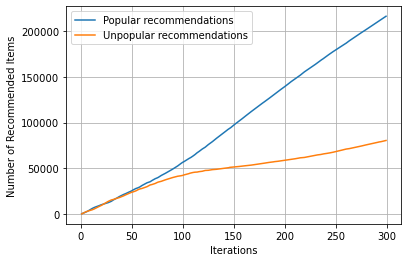

In [22]:
plt.plot(vc['index'], vc['rec_pop_cum'], label = 'Popular recommendations')
plt.plot(vc['index'], vc['rec_unpop_cum'], label = 'Unpopular recommendations')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Number of Pop/Unpop Recommendations")
plt.xlabel("Iterations")
plt.ylabel("Number of Recommended Items")
plt.legend()
plt.grid()
plt.savefig('foeir_png/Total_recommendations.jpg',bbox_inches='tight', dpi=150)
plt.show()


In [16]:
'''Users Picked Per Iteration // Run code Once as it appends to the file!!'''
for i in range(2,301):
    cv = pd.read_csv('T_3_final/t_' + str(i) + '/FOEIR-DIC_rec.txt',names=['userid','itemid','score','label','count'],sep=',')
    av = pd.read_csv('T_3_final/t_' + str(i) + '/train-1.txt',names=['userid','itemid','rating'],sep='\t')
    bv = pd.read_csv('T_3_final/t_' + str(i) + '/pop_items_iter.txt',names=['itemid','iteration'],sep='\t')
    bv.to_csv('T_3_final/t_1/total_pop_items.txt',header=None, index=None, sep='\t', mode='a')
    usr_lst = list(cv['userid'].unique())
    pop_itm = list(bv['itemid'].unique())
    #usr_lst = usr_lst.sort()
    #pop_itm = pop_itm.sort()
    #print(usr_lst)
    #print(pop_itm,len(pop_itm))
    av = av[['userid','itemid']]
    cv_1 = pd.DataFrame()
    cv_1['userid'] = (cv['userid'].unique())
    cv_1['iteration'] = i
    for j in usr_lst:
    #cv_1 = cv_1.reset_index(drop=True)
    #av = av.reset_index(drop=True)
    #bv = bv.reset_index(drop=True)
    #cv_2 = list(bv['itemid'].unique())
        query_1 = av[(av['userid'] == j) & (av['itemid'].isin(bv['itemid'].values))]
        query_1 = query_1.reset_index(drop=True)
        query_1['iteration'] = i
        #query_1['perc'] = len(query_1) / len(pop_itm)
        #query_1 = query_1.drop_duplicates(subset=['userid'])
        #display(query_1)
        #query_1.to_csv('T_3_final/t_1/sat_user_item.txt',header=None, index=None, sep='\t', mode='a')
    
    #print(cv_1)
    

     itemid  count  Total Item Percentage  index
17      111     38               0.007432      1
338    1806     34               0.006650      2
333    1779     30               0.005867      3
331    1770     24               0.004694      4
279    1479     22               0.004303      5
..      ...    ...                    ...    ...
687    3440      1               0.000196    793
428    2192      1               0.000196    794
83      364      1               0.000196    795
88      376      1               0.000196    796
339    1811      1               0.000196    797

[797 rows x 4 columns]


/tmp/ipykernel_7160/3038229353.py:20: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/popular_item_perc.jpg',box_inches='tight', dpi=150)


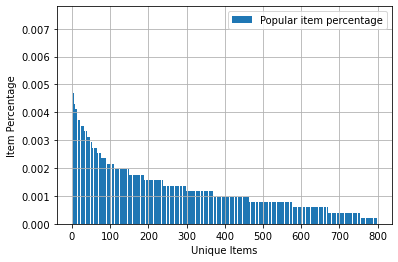

/tmp/ipykernel_7160/3038229353.py:26: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/popular_item_perc_dist.jpg',box_inches='tight', dpi=150)


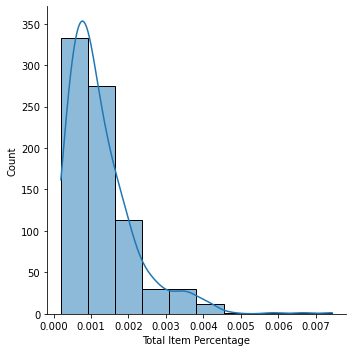

In [20]:
gh = pd.read_csv('T_3_final/t_1/total_pop_items.txt', names=['itemid','iteration'],sep='\t')
gh = gh[['itemid']]
gh = gh.groupby(["itemid"])["itemid"].count().reset_index(name="count").sort_values(by=['count'], ascending=False)
gh['Total Item Percentage'] = gh['count'] / gh['count'].sum()
gh['index'] = range(1,len(gh)+1)
print(gh)
#print(gh['count'].sum())
plt.bar(gh['index'],gh['Total Item Percentage'],
         label = 'Popular item percentage')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("")
plt.xlabel("Unique Items")
plt.ylabel("Item Percentage")
plt.legend()
plt.grid()
#plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.savefig('foeir_png/popular_item_perc.jpg',box_inches='tight', dpi=150)
plt.show()



sns.displot(gh['Total Item Percentage'],bins=10,kde=True);
plt.savefig('foeir_png/popular_item_perc_dist.jpg',box_inches='tight', dpi=150)

In [113]:
for i in range(2,301):
    pds = pd.read_csv('T_3_final/t_'+ str(i) + '/user_perc.txt', names=['userid','itemid','perc'],sep='\t')
    pds['iteration'] = i
    pds['user_count'] = pds.groupby(['itemid'])["itemid"].transform("count") / 100
    pds = pds.drop_duplicates(subset=['itemid','user_count','perc','iteration'], keep="last").reset_index(drop=True)
    print(pds)
    
    vd = pd.DataFrame()
    vd_1 = pd.DataFrame()
    vd = pds.astype(float).nlargest(1,['perc'])
    vd_1 = pds.astype(float).nlargest(1,['user_count'])
    #vd.to_csv('T_3_final/t_1/max_item_perc.txt',header=None, index=None, sep='\t', mode='a')
    #vd_1.to_csv('T_3_final/t_1/max_user_perc.txt',header=None, index=None, sep='\t', mode='a')
    
    
    #pds.to_csv('T_3_final/t_1/total_user_perc.txt',header=None, index=None, sep='\t', mode='a')
    #print(pds)
    #print(vd)
    #print(vd_1)

   userid  itemid      perc  iteration  user_count
0    5662    1458  0.058824          2        0.01
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
   userid  itemid      perc  iteration  user_count
0     958     393  0.058824          4        0.01
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
   userid  itemid      perc  iteration  user_count
0    4441      24  0.058824         10        0.01
1    4598    2305  0.058824         10        0.01
   userid  itemid      perc  iteration  user_count
0    1328    1943  0.058824         11        0.01
   userid  itemid      perc  iteration  user_count
0   

Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
   userid  itemid      perc  iteration  user_count
0    5185    3866  0.058824        119        0.01
1    3378     737  0.058824        119        0.01
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
   userid  itemid      perc  iteration  user_count
0    3321    2747  0.058824        122        0.01
   userid  itemid      perc  iteration  user_count
0    2417    2747  0.058824        123        0.01
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
   userid  itemid      perc  iteration  user_count
0    5544    1752  0.058824        125        0.01
1    6022    2468  0.058824        125        0.01
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
Empty DataFrame
Columns: [userid, itemid, perc, iteration, user_count]
Index: []
   u

   userid  itemid      perc  iteration  user_count
0     640     170  0.058824        190        0.01
   userid  itemid      perc  iteration  user_count
0    2259    2523  0.058824        191        0.01
1     989     119  0.058824        191        0.01
2    4585    1200  0.058824        191        0.01
3    2877    1387  0.058824        191        0.01
   userid  itemid      perc  iteration  user_count
0    1889    3524  0.058824        192        0.01
1    3401    2523  0.058824        192        0.01
   userid  itemid      perc  iteration  user_count
0    1195    3352  0.058824        193        0.01
1    2823    2523  0.058824        193        0.01
2     857     170  0.058824        193        0.02
   userid  itemid      perc  iteration  user_count
0    2469     847  0.058824        194        0.01
   userid  itemid      perc  iteration  user_count
0    2585    1550  0.058824        195        0.01
1     202    1635  0.058824        195        0.01
Empty DataFrame
Columns: [useri

   userid  itemid      perc  iteration  user_count
0     812    2403  0.055556        254        0.01
1    2335    1824  0.055556        254        0.01
2    5007    2527  0.055556        254        0.01
3    2660    1569  0.055556        254        0.01
   userid  itemid      perc  iteration  user_count
0    2873    1958  0.058824        255        0.01
1    3565     445  0.058824        255        0.01
2    2690    2824  0.117647        255        0.01
   userid  itemid      perc  iteration  user_count
0    3981    2301  0.058824        256        0.01
1    4333    2824  0.058824        256        0.01
2    1817    1987  0.058824        256        0.01
3     381     445  0.058824        256        0.01
   userid  itemid      perc  iteration  user_count
0    3413    1003  0.058824        257        0.01
1     961    2625  0.058824        257        0.01
2    3133     972  0.058824        257        0.01
3    3034    1806  0.058824        257        0.01
   userid  itemid      perc  it

/tmp/ipykernel_7160/1401512307.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()])
/tmp/ipykernel_7160/1401512307.py:19: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/Sat_more_than_one_users.jpg',box_inches='tight', dpi=150)


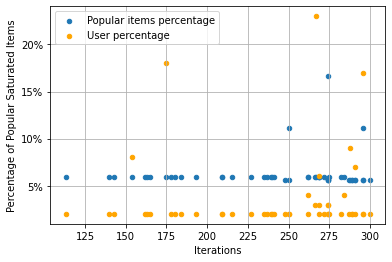

In [21]:
wt = pd.read_csv('T_3_final/t_1/total_user_perc.txt',names=['userid','itemid','perc','iteration','user_count'],sep='\t')

wt = wt.loc[wt['user_count']>= 0.02]
#print(wt)

plt.scatter(wt['iteration'], wt['perc'], label = 'Popular items percentage',s=20)
plt.scatter(wt['iteration'], wt['user_count'], label = 'User percentage',color='orange',s=20)
#plt.plot(ph['index'], ph['rec_unpop_cum'], label = 'unpopular_recommendations')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Popular Item Saturated for more than one Users per Iteration")
plt.xlabel("Iterations")
plt.ylabel("Percentage of Popular Saturated Items")
plt.legend()
plt.grid()
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.savefig('foeir_png/Sat_more_than_one_users.jpg',box_inches='tight', dpi=150)
plt.show()


     userid  itemid      perc  iteration  user_count
68     5651    2086  0.117647        143        0.01
250    4935    2403  0.111111        250        0.02
264    2690    2824  0.117647        255        0.01
303    2076    2953  0.117647        269        0.01
316    2823     111  0.166667        274        0.03
346    2899    3867  0.117647        282        0.01
378    3337    3746  0.111111        296        0.02
394    1863    2340  0.111111        299        0.01


/tmp/ipykernel_7160/2818855551.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()])
/tmp/ipykernel_7160/2818855551.py:19: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/Sat_more_than_one_items.jpg',format ='jpg',box_inches='tight', dpi=150)


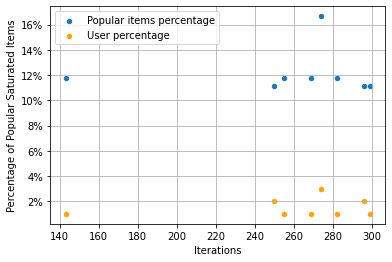

In [23]:
tw = pd.read_csv('T_3_final/t_1/total_user_perc.txt',names=['userid','itemid','perc','iteration','user_count'],sep='\t')

tw = tw.loc[tw['perc']>= 0.10]
print(tw)

plt.scatter(tw['iteration'], tw['perc'], label = 'Popular items percentage',s=20)
plt.scatter(tw['iteration'], tw['user_count'], label = 'User percentage',color='orange',s=20)
#plt.plot(ph['index'], ph['rec_unpop_cum'], label = 'unpopular_recommendations')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Users with more than 10% of Saturated Popular Items per Iteration")
plt.xlabel("Iterations")
plt.ylabel("Percentage of Popular Saturated Items")
plt.legend()
plt.grid()
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.savefig('foeir_png/Sat_more_than_one_items.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()


     userid  itemid      perc  iteration  user_count
0    5662.0  1458.0  0.058824        2.0        0.01
1     958.0   393.0  0.058824        4.0        0.01
2    4441.0    24.0  0.058824       10.0        0.01
3    1328.0  1943.0  0.058824       11.0        0.01
4    5984.0  2522.0  0.058824       12.0        0.01
..      ...     ...       ...        ...         ...
180  3337.0  3746.0  0.111111      296.0        0.02
181   580.0  1547.0  0.055556      297.0        0.01
182   584.0     6.0  0.055556      298.0        0.01
183  1863.0  2340.0  0.111111      299.0        0.01
184   302.0  3828.0  0.055556      300.0        0.01

[185 rows x 5 columns]
     userid  itemid      perc  iteration  user_count
0    5662.0  1458.0  0.058824        2.0        0.01
1     958.0   393.0  0.058824        4.0        0.01
2    4441.0    24.0  0.058824       10.0        0.01
3    1328.0  1943.0  0.058824       11.0        0.01
4    5984.0  2522.0  0.058824       12.0        0.01
..      ...     ...   

/tmp/ipykernel_7160/1050760571.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()])
/tmp/ipykernel_7160/1050760571.py:19: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/Sat_max_percentage.jpg',format ='jpg',box_inches='tight', dpi=150)


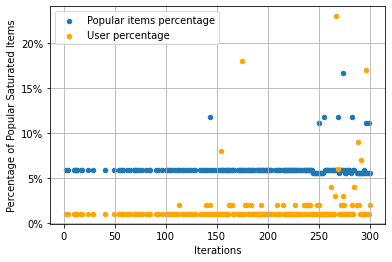

In [24]:
tf = pd.read_csv('T_3_final/t_1/max_item_perc.txt',names=['userid','itemid','perc','iteration','user_count'],sep='\t')
tf_1 = pd.read_csv('T_3_final/t_1/max_user_perc.txt',names=['userid','itemid','perc','iteration','user_count'],sep='\t')
print(tf)
print(tf_1)

plt.scatter(tf['iteration'], tf['perc'], label = 'Popular items percentage',s=20)
plt.scatter(tf_1['iteration'], tf_1['user_count'], label = 'User percentage',color='orange',s=20)
#plt.plot(ph['index'], ph['rec_unpop_cum'], label = 'unpopular_recommendations')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Max Percentage of Popular Saturated Items per Iteration")
plt.xlabel("Iterations")
plt.ylabel("Percentage of Popular Saturated Items")
plt.legend()
plt.grid()
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.savefig('foeir_png/Sat_max_percentage.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()


In [7]:
ph = pd.read_csv('T_3_final/t_1/total_user_perc.txt',names=['userid','itemid','perc','iteration','user_count'],sep='\t')
ph = ph.drop_duplicates(subset=['userid','itemid','iteration'], keep="last")
ph['user_count'] = ph.groupby('iteration')['iteration'].transform('count')
#df['freq'] = df.groupby('a')['a'].transform('count')
ph['user_perc'] = ph['user_count'].values / 100
print(ph)
ph.to_csv('T_3_final/t_1/saturated_1.txt',header=None, index=None, sep='\t', mode='w')
pc = pd.DataFrame()
pc = ph[['user_perc','iteration']]
pc = pc.drop_duplicates(subset=['user_perc','iteration'], keep="last").reset_index(drop=True)
print(pc)

     userid  itemid      perc  iteration  user_count  user_perc
0      5662    1458  0.058824          2           1       0.01
1       958     393  0.058824          4           1       0.01
2      4441      24  0.058824         10           2       0.02
3      4598    2305  0.058824         10           2       0.02
4      1328    1943  0.058824         11           1       0.01
..      ...     ...       ...        ...         ...        ...
396    1739    3938  0.055556        300           6       0.06
397     936     603  0.055556        300           6       0.06
398     577    2970  0.055556        300           6       0.06
399     404    3686  0.055556        300           6       0.06
400    1978       6  0.055556        300           6       0.06

[401 rows x 6 columns]
     user_perc  iteration
0         0.01          2
1         0.01          4
2         0.02         10
3         0.01         11
4         0.01         12
..         ...        ...
180       0.04        296


/tmp/ipykernel_6896/3251619170.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()])
/tmp/ipykernel_6896/3251619170.py:14: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/Sat_all_saturation_perc.jpg',format ='jpg',box_inches='tight', dpi=150)


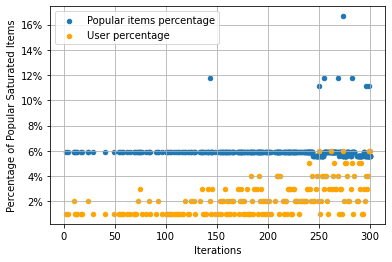

In [9]:
plt.scatter(ph['iteration'], ph['perc'], label = 'Popular items percentage',s=20)
plt.scatter(pc['iteration'], pc['user_perc'], label = 'User percentage',color='orange',s=20)
#plt.plot(ph['index'], ph['rec_unpop_cum'], label = 'unpopular_recommendations')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Percentage of Popular Saturated Items per Iteration")
plt.xlabel("Iterations")
plt.ylabel("Percentage of Popular Saturated Items")
plt.legend()
plt.grid()
plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
plt.savefig('foeir_png/Sat_all_saturation_perc.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()


In [10]:
pc = pd.read_csv('T_3_final/t_1/saturated_1.txt',names=['userid','itemid','itm_perc','iteration','user_count','usr_perc'],sep='\t')
pc = pc[pc.duplicated(['itemid','iteration'])]
pc.to_csv('T_3_final/t_1/same_item_sat.txt',header=None, index=None, sep='\t', mode='w')
print(pc)
#duplicateRows = df[df.duplicated(['col1', 'col2'])]

     userid  itemid  itm_perc  iteration  user_count  usr_perc
46     4337    2560  0.058824        113           2      0.02
66     5317    2253  0.058824        140           2      0.02
72     3261    2430  0.058824        143           3      0.03
82      614    3095  0.058824        154           8      0.08
83     5736    3095  0.058824        154           8      0.08
..      ...     ...       ...        ...         ...       ...
500     326     882  0.055556        296          20      0.20
501    5069     882  0.055556        296          20      0.20
503    4305     882  0.055556        296          20      0.20
504    4233     882  0.055556        296          20      0.20
524    1978       6  0.055556        300           7      0.07

[127 rows x 6 columns]


In [ ]:
1433	1047	0.0588235294117647	24	2	0.02

In [50]:
"""Total Number of Pop and Non Pop item per iteration from Librec-Auto Generation!!"""
# for i in range(1,301):
#     pdf = pd.read_csv('T_3_final/t_'+str(i)+'/out-1.txt',names=['userid','itemid','rating'],sep=',')
#     '''Add label to all out-1.txt files!!,then count the total pop/unpop items during Librec-auto phase?'''

for i in range(1,301):
    psd = pd.read_csv('T_3_final/t_' + str(i) + '/out-1.txt',names=['userid','itemid','rate'],sep=',')
    #psd_1 = list(psd['userid'].unique())
    #print(psd_1)
    popularity_data = compute_popularity(psd,'itemid')
    head, mid, tail = get_head_mid_tail(popularity_data ,0.4, 0.8)
    psd['label'] = psd.apply(lambda row: label_items(row, head), axis=1)
    psd = psd[['userid','itemid','label']]
    #print(psd)
    #psd.to_csv('T_3_final/t_' + str(i) + /'out-1_label.txt',header=None, index=None, sep='\t', mode='w')
    
    data_query = psd[(psd['label'] == 0)].reset_index(drop=True)
    data_query_2 = psd[(psd['label'] == 1)].reset_index(drop=True)
    #data_query['iteration'] = i
    data_query_1 = pd.DataFrame()
    data_query_1['itemid'] = data_query['itemid'].unique()
    data_query_1 = data_query_1.reset_index(drop=True)
    data_query_1['iteration'] =i
    #print(data_query_1)
    data_query_1.to_csv('T_3_final/t_' + str(i) + '/popular_items.txt',header=None, index=None, sep='\t', mode='w')
#     dq_0 = pd.DataFrame()
#     dq_1 = pd.DataFrame()
    
    #dq_0['n_pop'] = int(len(data_query_1.values))
    #dq_0['iteration'] = i
    #print(dq_0)
    
    data_query_3 = pd.DataFrame()
    data_query_3['itemid'] = data_query_2['itemid'].unique()
    data_query_3 = data_query_3.reset_index(drop=True)
    data_query_3['iteration'] = i
    #print(data_query_3)
    data_query_3.to_csv('T_3_final/t_' + str(i) + '/unpopular_items.txt',header=None, index=None, sep='\t', mode='w')
#     dq_1['n_pop'] = int(len(data_query_3.values))
#     dq_1['iteration'] = i
    #print(dq_1)
    
    #data_query_1.to_csv('T_3_final/t_' + str(i) + '/pop_items_iter.txt',header=None, index=None, sep='\t', mode='w')
    #print(data_query)
    #data_query['ratio'] = len(data_query) / len(psd)
    #print(data_query.head(1))


'''Also here, I keep Popular items per Iteration'''
    

'Also here, I keep Popular items per Iteration'

In [65]:
'''Run it once, creates Total number of Pop/Unpop items per iteration from Librec-Auto code!!!'''

for i in range(1,301):
    pop = pd.read_csv('T_3_final/t_' + str(i) + '/popular_items.txt',names=['itemid','iter'],sep='\t')
    unpop = pd.read_csv('T_3_final/t_' + str(i) + '/unpopular_items.txt',names=['itemid','iter'],sep='\t')
    #print(len(pop))
    
    df_pop = pd.DataFrame()
    df_unpop = pd.DataFrame()
    
    df_pop['n_pop'] = pop.apply(lambda x: len(x))
    df_pop['iter'] = i
    df_pop['n_unpop'] = unpop.apply(lambda x: len(x))
    #df_unpop['iter'] = i
    df_pop = df_pop.drop_duplicates().reset_index(drop=True)
    df_pop = df_pop[['n_pop','n_unpop']]
    #df_unpop = df_unpop.drop_duplicates().reset_index(drop=True)
    df_pop.to_csv('T_3_final/t_1/Total_count_pop_unpop.txt',header=None, index=None, sep='\t', mode='a')
    #print(df_pop)
    
    

979
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
18
18
18
18
18
18
18
18
18
18
18
17
17
17
17
17
17
17
17
17
17
17
17
17
17
17
18
17
17
17
18
17
18
18
17
17
17
18
17
17
17
18
17
18
18
18
18
18
18
18
17
18
18
18
18
18
18


     pop  unpop
0    979   2100
1     17     25
2     17     24
3     17     26
4     17     26
..   ...    ...
295   18    116
296   18    117
297   18    109
298   18    110
299   18    107

[300 rows x 2 columns]
     rec_pop  rec_unpop     ratio
0        595        405  0.595000
1        400        600  0.400000
2        500        500  0.500000
3        388        582  0.400000
4        502        498  0.502000
..       ...        ...       ...
294      781        219  0.781000
295      693        297  0.700000
296      724        276  0.724000
297      728        262  0.735354
298      724        276  0.724000

[299 rows x 3 columns]
     unpop  pop
0        5    6
1        6    4
2        5    6
3        6    5
4        5    6
..     ...  ...
294     32   18
295     41   18
296     35   18
297     38   18
298     42   18

[299 rows x 2 columns]
     unpop   pop
0     3649  2381
1        0   100
2        0   100
3      100     0
4        0    97
..     ...   ...
295      0   100


/tmp/ipykernel_7977/3969105470.py:52: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()])
/tmp/ipykernel_7977/3969105470.py:60: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/pop_unpop_ratios.jpg',format ='jpg',box_inches='tight', dpi=150)


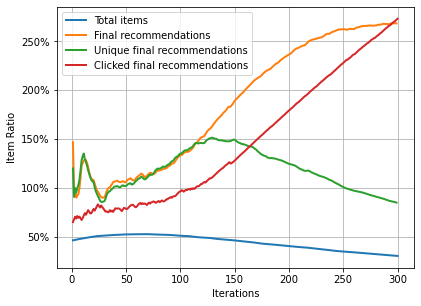

In [14]:
fm = pd.read_csv('T_3_final/t_1/Total_count_pop_unpop.txt', names=[ 'pop', 'unpop'], sep='\t')
print(fm)
fm['unpop_cum_score'] = fm['unpop'].cumsum().astype(float)
fm['pop_cum_score'] = fm['pop'].cumsum().astype(float)
fm['index'] = range(1, len(fm) + 1)
fm['ratio'] = fm['pop_cum_score'] / fm['unpop_cum_score']
# print(fm)
# plt.plot(fm['index'], fm['pop_cum_score'], label = 'Popular items')
# plt.plot(fm['index'], fm['unpop_cum_score'], label = 'Unpopular items')
# #plt.plot(x, y)
# #plt.plot(x, y)
# #plt.ylim([0.0001,0.02])
# #plt.xlim([1,1000])
# #plt.title("Number of Unique Pop/Unpop Items")
# plt.xlabel("Iterations")
# plt.ylabel("Number Items")
# plt.legend()
# plt.grid()
# plt.show()
# plt.savefig('FINAL_T_3_FOEIR_PGF/pop_unpop_items_general.jpg')

vc = pd.read_csv('T_3_final/t_1/label_ratio.txt',names=['rec_pop','rec_unpop','ratio'],sep='\t')
print(vc)
vc['index'] = range(1,len(vc)+1)
#print(vc,vc['ratio'].mean())
vc['rec_unpop_cum'] = vc['rec_unpop'].cumsum().astype(float)
vc['rec_pop_cum'] = vc['rec_pop'].cumsum().astype(float)
vc['ratio'] = vc['rec_pop_cum'] / vc['rec_unpop_cum']


mf = pd.read_csv('T_3_final/t_1/label_count.txt', names=[ 'unpop', 'pop'], sep='\t')
print(mf)
mf['unpop_cum_score'] = mf['unpop'].cumsum().astype(float)
mf['pop_cum_score'] = mf['pop'].cumsum().astype(float)
mf['index'] = range(1, len(mf) + 1)
mf['ratio'] = mf['pop_cum_score'] / mf['unpop_cum_score']

cv = pd.read_csv('T_3_final/t_1/clicked_label.txt',names=['unpop','pop',],sep='\t')
print(cv)
cv['index'] = range(1,len(cv)+1)
#print(vc,vc['ratio'].mean())
cv['cum_unpop'] = cv['unpop'].cumsum().astype(float)
cv['cum_pop'] = cv['pop'].cumsum().astype(float)
cv['ratio'] = cv['cum_pop'] / cv['cum_unpop']


plt.plot(fm['index'], fm['ratio'], label ='Total items',linewidth=2)
plt.plot(vc['index'], vc['ratio'], label ='Final recommendations',linewidth=2)
plt.plot(mf['index'], mf['ratio'], label ='Unique final recommendations',linewidth=2)
plt.plot(cv['index'], cv['ratio'], label ='Clicked final recommendations',linewidth=2)

plt.gca().set_yticklabels([f'{x:.0%}' for x in plt.gca().get_yticks()]) 
#plt.title("Ratio of Pop/Unpop Items per Iteration")
plt.xlabel("Iterations")
plt.ylabel("Item Ratio")
plt.legend()
plt.grid()
plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]
#plt.rcParams["figure.figsize"] = (20,3)
plt.savefig('foeir_png/pop_unpop_ratios.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()


In [166]:
"""Work on clicked Items level and monitor their exposure over time!"""


tr = pd.read_csv('T_3_final/t_1/out-1.txt',names=['userid','itemid','rate'],sep=',')
popularity_data = compute_popularity(tr,'itemid')
head, mid, tail = get_head_mid_tail(popularity_data ,0.4, 0.8)
tr['label'] = tr.apply(lambda row: label_items(row, head), axis=1)
tr['seq'] = [next(seq) for count in range(tr.shape[0])]
tr['expo_score'] = tr['seq'].apply(lambda k: expo_score(k))
tr['count'] = 1
tr = tr[['userid','itemid','label','expo_score','count']]


#tr = tr[['itemid','expo_score','label','count']]

tr = tr.drop_duplicates(keep='first',subset=['userid']).reset_index(drop=True)
tr = tr.groupby(['itemid','label']).sum(['expo_score','count']).reset_index()
tr = tr.sort_values(by=['expo_score'], ascending = False).reset_index(drop=True)
#tr['iteration'] = 1
tr = tr[['itemid','expo_score','label','count']]
#print(tr)

#tr.to_csv('T_3_final/t_1/clicked_items_1.txt',header=None, index=None, sep='\t', mode='w')
#tr.to_csv('T_3_final/t_1/total_clicked_items.txt',header=None, index=None, sep='\t', mode='w')


for i in range(2,301):
    tr_1 = pd.read_csv('T_3_final/t_' + str(i) + '/FOEIR-DIC_rec.txt',names=['userid','itemid','expo_score','label','count'],sep=",")
    tr_1 = tr_1.drop_duplicates(keep='first',subset=['userid']).reset_index(drop=True)
    tr_1 = tr_1[['itemid','expo_score','label']]
    tr_1['count'] = 1
    tr_1 = tr_1.groupby(['itemid','label']).sum(['expo_score','count']).reset_index()
    #tr_1 = tr_1.sort_values(by=['expo_score'], ascending = False).reset_index(drop=True)
    tr_1['iteration'] = i
    #tr_1 = tr_1[['itemid','expo_score','label','count']]
    #tr_1.to_csv('T_3_final/t_1/clicked_items_1.txt',header=None, index=None, sep='\t', mode='a')
    #tr_1.to_csv('T_3_final/t_1/total_clicked_items.txt',header=None, index=None, sep='\t', mode='a')
    print(tr_1)



   itemid  label  expo_score  count  iteration
0      36  False   90.909091    100          2
   itemid  label  expo_score  count  iteration
0    2773  False   90.909091    100          3
   itemid  label  expo_score  count  iteration
0    1350   True   90.909091    100          4
   itemid  label  expo_score  count  iteration
0     803  False   88.181818     97          5
   itemid  label  expo_score  count  iteration
0     728   True   90.909091    100          6
   itemid  label  expo_score  count  iteration
0     611   True   26.363636     29          7
1     633  False   63.636364     70          7
   itemid  label  expo_score  count  iteration
0     661   True        90.0     99          8
   itemid  label  expo_score  count  iteration
0    1935   True   90.909091    100          9
   itemid  label  expo_score  count  iteration
0      24  False   83.636364     92         10
1    2981   True    6.363636      7         10
   itemid  label  expo_score  count  iteration
0    1458  Fa

   itemid  label  expo_score  count  iteration
0    2557   True   33.636364     37         69
1    2816   True   44.545455     49         69
2    3430   True   11.818182     13         69
   itemid  label  expo_score  count  iteration
0    1440  False   45.454545     50         70
1    2428  False   13.636364     15         70
2    2669   True    1.818182      2         70
3    2989  False   20.909091     23         70
4    3088  False    9.090909     10         70
   itemid  label  expo_score  count  iteration
0     296   True    0.909091      1         71
1     599  False   16.363636     18         71
2    1594   True    8.181818      9         71
3    1936  False   14.545455     16         71
4    2301  False    7.272727      8         71
5    2352  False    0.909091      1         71
6    2479  False   40.909091     45         71
7    2970  False    0.909091      1         71
   itemid  label  expo_score  count  iteration
0     116   True   75.454545     83         72
1    2078   T

   itemid  label  expo_score  count  iteration
0     339  False   40.909091     45        105
1     835  False   14.545455     16        105
2    1656  False    5.454545      6        105
3    1824   True    6.363636      7        105
4    2212  False    3.636364      4        105
5    2585   True    0.909091      1        105
6    2605  False   12.727273     14        105
7    2856  False    5.454545      6        105
   itemid  label  expo_score  count  iteration
0     889  False    2.727273      3        106
1    1371  False   19.090909     21        106
2    2058   True   23.636364     26        106
3    2305   True   31.818182     35        106
4    3520  False    8.181818      9        106
5    3871  False    2.727273      3        106
6    3914   True    2.727273      3        106
   itemid  label  expo_score  count  iteration
0     271  False   12.727273     14        107
1     964  False   35.454545     39        107
2    1353  False   13.636364     15        107
3    1836  Fa

    itemid  label  expo_score  count  iteration
0      588   True    0.909091      1        140
1      592  False    3.636364      4        140
2     2253  False    4.545455      5        140
3     2514  False   30.000000     33        140
4     2646  False    0.909091      1        140
5     2964  False   16.363636     18        140
6     3007  False    8.181818      9        140
7     3398  False    0.909091      1        140
8     3440  False    2.727273      3        140
9     3492  False   17.272727     19        140
10    3724  False    4.545455      5        140
   itemid  label  expo_score  count  iteration
0    2646  False    0.909091      1        141
1    3398  False   90.000000     99        141
   itemid  label  expo_score  count  iteration
0     318  False    0.909091      1        142
1     588  False    1.818182      2        142
2    1493   True    3.636364      4        142
3    1771  False    3.636364      4        142
4    1941  False   37.272727     41        142
5

   itemid  label  expo_score  count  iteration
0     140  False   82.727273     91        177
1    2963  False    7.272727      8        177
    itemid  label  expo_score  count  iteration
0      177   True    0.909091      1        178
1      510  False    0.909091      1        178
2      531  False   51.818182     57        178
3      603  False    9.090909     10        178
4     1898  False    4.545455      5        178
5     1958  False    0.909091      1        178
6     2170  False    1.818182      2        178
7     2771  False    0.909091      1        178
8     3017   True    0.909091      1        178
9     3245  False    6.363636      7        178
10    3507  False    4.545455      5        178
11    3624  False    0.909091      1        178
12    3682  False    6.363636      7        178
   itemid  label  expo_score  count  iteration
0    2771  False   88.181818     97        179
1    3017  False    2.727273      3        179
    itemid  label  expo_score  count  iteratio

    itemid  label  expo_score  count  iteration
0      349  False   17.272727     19        211
1      510  False   31.818182     35        211
2      575  False    2.727273      3        211
3      581  False    0.909091      1        211
4      780  False    0.909091      1        211
5      804   True    0.909091      1        211
6     1212  False    4.545455      5        211
7     2028  False   23.636364     26        211
8     2134  False    0.909091      1        211
9     2605   True    1.818182      2        211
10    3091  False    2.727273      3        211
11    3843  False    0.909091      1        211
   itemid  label  expo_score  count  iteration
0     804  False        90.0     99        212
   itemid  label  expo_score  count  iteration
0     581  False   89.090909     98        213
   itemid  label  expo_score  count  iteration
0    2134  False        90.0     99        214
    itemid  label  expo_score  count  iteration
0      277  False    2.727273      3        21

   itemid  label  expo_score  count  iteration
0     336  False   90.909091    100        248
    itemid  label  expo_score  count  iteration
0      234  False    5.454545      6        249
1      327  False    8.181818      9        249
2      384  False   50.000000     55        249
3      432  False    3.636364      4        249
4      737  False    2.727273      3        249
5      959   True    0.909091      1        249
6     1153  False    1.818182      2        249
7     1416   True    0.909091      1        249
8     1928  False    0.909091      1        249
9     2211  False    1.818182      2        249
10    2522  False    5.454545      6        249
11    2695  False    0.909091      1        249
12    3276   True    0.909091      1        249
13    3391  False    0.909091      1        249
14    3395   True    0.909091      1        249
15    3794  False    1.818182      2        249
16    3800   True    1.818182      2        249
17    3866   True    0.909091      1      

    itemid  label  expo_score  count  iteration
0       59  False    1.818182      2        282
1      190  False    1.818182      2        282
2      806  False    5.454545      6        282
3     1040  False    6.363636      7        282
4     1083   True    0.909091      1        282
5     1128  False    3.636364      4        282
6     1130  False    7.272727      8        282
7     1260  False   18.181818     20        282
8     1515   True    0.909091      1        282
9     1549   True    0.909091      1        282
10    1870  False    1.818182      2        282
11    2149  False    2.727273      3        282
12    2513  False   10.909091     12        282
13    3008  False   11.818182     13        282
14    3306   True    1.818182      2        282
15    3395   True    3.636364      4        282
16    3440   True    1.818182      2        282
17    3637  False    4.545455      5        282
18    3814  False    0.909091      1        282
19    3867  False    3.636364      4    

In [129]:
tx = pd.read_csv('T_3_final/t_1/total_clicked_items.txt',names=['itemid','expo_score','label','count'],sep='\t')
tx = tx[['itemid','expo_score','count']]
tx = tx.groupby(['itemid']).sum(['expo_score','count']).reset_index()
tx = tx.sort_values(by=['expo_score'], ascending = False).reset_index(drop=True)
tx = tx.drop_duplicates(subset=['itemid'])
print(tx)
tx.to_csv('T_3_final/t_1/total_clicked_items.txt',header=None, index=None, sep='\t', mode='w')

      itemid  expo_score  count
0       2500  114.545455    126
1       3724  110.000000    121
2        960  109.090909    120
3       3516  108.181818    119
4        944  107.272727    118
...      ...         ...    ...
2647    3168    0.909091      1
2648    1519    0.909091      1
2649    1517    0.909091      1
2650    3182    0.909091      1
2651       1    0.909091      1

[2652 rows x 3 columns]


In [141]:
"""Create_Per_Itemid_score,label,iteration"""


def score_per_item_iteration(T):
    #pd_1 = pd.read_csv('T_2/t_1/count_score.txt', names=['itemid', 'count', 'score', 'label'], sep='\t')
    for i in range(1, T):
        if i == 1:
            data = pd.read_csv('T_3_final/t_1/clicked_items_1.txt', names=['itemid','expo_score','label','count','iteration'], sep='\t')
            #data = data.drop_duplicates().reset_index(drop=True)
            #data['iteration'] = i
            #print(data)
            data.to_csv('T_3_final/t_1/new_clicked_per_iter_all_1.txt', header=None, index=None, sep='\t', mode='w')
        else:
            data = pd.read_csv('T_3_final/t_' + str(i) + '/clicked_items_1.txt', names=['itemid','expo_score','label','count','iteration'],sep='\t')
            #data = data.drop_duplicates().reset_index(drop=True)
            #data['iteration'] = i
            #print(data)
            data.to_csv('T_3_final/t_1/new_clicked_per_iter_all_1.txt', header=None, index=None, sep='\t', mode='a')

score_per_item_iteration(301)

In [149]:
pd_1 = pd.read_csv('T_3_final/t_1/new_clicked_per_iter_all_1.txt', names=['itemid','expo_score','label','count','iteration'],sep='\t')
# pd_1 = pd_1[['itemid','expo_score','count']]
# pd_1 = pd_1.groupby(['itemid']).sum(['expo_score','count']).reset_index()
# pd_1 = pd_1.sort_values(by=['expo_score'], ascending = False).reset_index(drop=True)
items_clicked = list(pd_1['itemid'].unique())
#items_clicked_3 = []

for it in items_clicked:
    #dt = pd.read_csv('T_3/t_1/new_data_per_iter_all_1.txt', names=['itemid', 'count', 'score', 'label', 'iteration'], sep ='\t')
    data_query = pd_1[(pd_1['itemid'] == it)].reset_index(drop=True).drop_duplicates()
    data_query.dropna(axis=1, thresh=1)
    
    #data_query.to_csv('T_3_final/t_1/click_itm_score_iter' + str(it) + '.txt', header=None, index=None, sep='\t', mode='w')
    if len(data_query) > 1:
        #print(data_query)
        data_query.to_csv('T_3_final/t_1/clicked_exposed_2', header=None, index=None, sep='\t', mode='a')
#Look 45 cell!!

In [15]:
pd_2 = pd.read_csv('T_3_final/t_1/clicked_exposed_2', names=['itemid', 'expo_score','label','count','iteration'], sep='\t')
pd_2 = pd_2[['itemid','expo_score','count']]
pd_2 = pd_2.groupby(['itemid']).sum(['expo_score','count']).reset_index()
pd_2 = pd_2.sort_values(by=['expo_score'], ascending = False).reset_index(drop=True)
print(pd_2)
items_clicked_ranked = list(pd_2['itemid'].unique())
#print(items_ranked)
items_sort = []

     itemid  expo_score  count
0      2500  114.545455    126
1      3724  110.000000    121
2       960  109.090909    120
3      3516  108.181818    119
4       944  107.272727    118
..      ...         ...    ...
864     366    1.818182      2
865    2997    1.818182      2
866    3276    1.818182      2
867     959    1.818182      2
868    3824    1.818182      2

[869 rows x 3 columns]


In [16]:
for i in items_clicked_ranked[0:3]:
    pd_3 = pd.read_csv('T_3_final/t_1/click_itm_score_iter' + str(i) + '.txt', names=['itemid','expo_score','label','count','iteration'], sep='\t')
    pd_3['cum_score'] = pd_3['expo_score'].cumsum().astype(float)
    items_sort.append(pd_3)
    
for j in items_clicked_ranked[-3:]:
    print(j)
    pd_2 = pd.read_csv('T_3_final/t_1/click_itm_score_iter' + str(j) + '.txt', names=['itemid','expo_score','label','count','iteration'], sep='\t')
    pd_2['cum_score'] = pd_2['expo_score'].cumsum().astype(float)
    items_sort.append(pd_2)
    
#items_plot_2 = items_plot_2[:3]
print(items_sort)

3276
959
3824
[   itemid  expo_score  label  count  iteration   cum_score
0    2500    4.545455      1      5          1    4.545455
1    2500   12.727273   True     14         96   17.272727
2    2500    6.363636  False      7        266   23.636364
3    2500   90.909091  False    100        267  114.545455,    itemid  expo_score  label  count  iteration   cum_score
0    3724    3.636364      1      4          1    3.636364
1    3724    7.272727  False      8        100   10.909091
2    3724    2.727273   True      3        133   13.636364
3    3724    4.545455  False      5        140   18.181818
4    3724    0.909091   True      1        209   19.090909
5    3724    1.818182   True      2        223   20.909091
6    3724   89.090909  False     98        224  110.000000,    itemid  expo_score  label  count  iteration   cum_score
0     960    1.818182      1      2          1    1.818182
1     960   18.181818  False     20         86   20.000000
2     960    0.909091  False      1    

/tmp/ipykernel_7977/2861703684.py:8: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/Clicked_Exposure_over_iter_3.jpg',format ='jpg',box_inches='tight', dpi=150)


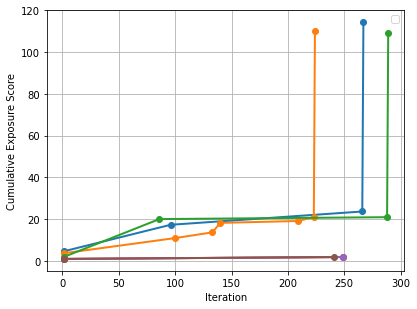

In [17]:
for i,j in enumerate(items_sort):
     plt.plot(items_sort[i]['iteration'], items_sort[i]['cum_score'],linestyle='-', linewidth=2, marker='o')
#plt.title("Exposure Score Over Time for the top/bottom 3 exposed items")
plt.xlabel("Iteration")
plt.ylabel("Cumulative Exposure Score")
plt.legend('')
plt.grid()
plt.savefig('foeir_png/Clicked_Exposure_over_iter_3.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()


In [18]:
items_sorted_2 = []
for i in items_clicked_ranked[0:5]:
    pd_3 = pd.read_csv('T_3_final/t_1/click_itm_score_iter' + str(i) + '.txt', names=['itemid','expo_score','label','count','iteration'], sep='\t')
    pd_3['cum_score'] = pd_3['expo_score'].cumsum().astype(float)
    items_sorted_2.append(pd_3)
    
for j in items_clicked_ranked[-5:]:
    print(j)
    pd_2 = pd.read_csv('T_3_final/t_1/click_itm_score_iter' + str(j) + '.txt', names=['itemid','expo_score','label','count','iteration'], sep='\t')
    pd_2['cum_score'] = pd_2['expo_score'].cumsum().astype(float)
    items_sorted_2.append(pd_2)
    
#items_plot_2 = items_plot_2[:3]
print(items_sorted_2)

366
2997
3276
959
3824
[   itemid  expo_score  label  count  iteration   cum_score
0    2500    4.545455      1      5          1    4.545455
1    2500   12.727273   True     14         96   17.272727
2    2500    6.363636  False      7        266   23.636364
3    2500   90.909091  False    100        267  114.545455,    itemid  expo_score  label  count  iteration   cum_score
0    3724    3.636364      1      4          1    3.636364
1    3724    7.272727  False      8        100   10.909091
2    3724    2.727273   True      3        133   13.636364
3    3724    4.545455  False      5        140   18.181818
4    3724    0.909091   True      1        209   19.090909
5    3724    1.818182   True      2        223   20.909091
6    3724   89.090909  False     98        224  110.000000,    itemid  expo_score  label  count  iteration   cum_score
0     960    1.818182      1      2          1    1.818182
1     960   18.181818  False     20         86   20.000000
2     960    0.909091  False  

/tmp/ipykernel_7977/2573820918.py:8: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/Clicked_Exposure_over_iter_5.jpg',format ='jpg',box_inches='tight', dpi=150)


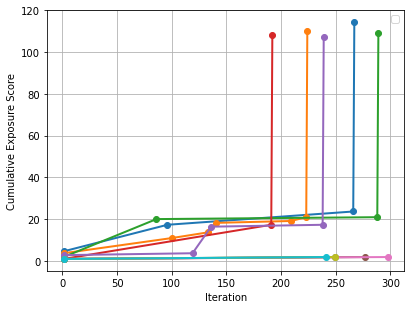

In [19]:
for i,j in enumerate(items_sorted_2):
     plt.plot(items_sorted_2[i]['iteration'], items_sorted_2[i]['cum_score'],linestyle='-', linewidth=2, marker='o',label='Items Sorted By Exposure Score')
#plt.title("Exposure Score Over Time for the top/bottom 3 exposed items")
plt.xlabel("Iteration")
plt.ylabel("Cumulative Exposure Score")
plt.legend('')
plt.grid()
plt.savefig('foeir_png/Clicked_Exposure_over_iter_5.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()


In [12]:
tr = pd.read_csv('T_3_final/t_1/out-1.txt',names=['userid','itemid','rate'],sep=',')
seq = cycle([1, 2, 3,4,5,6,7,8,9,10])
popularity_data = compute_popularity(tr,'itemid')
head, mid, tail = get_head_mid_tail(popularity_data ,0.4, 0.8)
tr['label'] = tr.apply(lambda row: label_items(row, head), axis=1)
tr['label'] = tr['label'].astype(bool)
#tr['label'] = (tr['label'] == '1').astype(bool)
tr['seq'] = [next(seq) for count in range(tr.shape[0])]
tr['expo_score'] = tr['seq'].apply(lambda k: expo_score(k))
tr['count'] = 1
#tr = tr[['userid','itemid','label','expo_score','count']]


#tr = tr[['itemid','expo_score','label','count']]

tr = tr.drop_duplicates(keep='first',subset=['userid']).reset_index(drop=True)

tr = tr[['itemid','label']]
#tr['iteration'] =1

tr['unpop'] = tr.label[tr.label == True].count()
tr['pop'] = tr.label[tr.label == False].count()
tr = tr[['unpop','pop']].drop_duplicates()
#print(tr)
tr.to_csv('T_3_final/t_1/clicked_label.txt',header=None, index=None, sep='\t', mode='w')

for i in range(2,301):
    tr_1 = pd.read_csv('T_3_final/t_' + str(i) + '/FOEIR-DIC_rec.txt',names=['userid','itemid','expo_score','label','count'],sep=",")
    tr_1 = tr_1.drop_duplicates(keep='first',subset=['userid']).reset_index(drop=True)
    tr_1['iteration'] = i
    tr_1 = tr_1[['itemid','label','iteration']]
    tr_1['unpop'] = tr_1.label[tr_1.label == True].count()
    tr_1['pop'] = tr_1.label[tr_1.label == False].count()
    tr_1 = tr_1[['unpop','pop']].drop_duplicates()
    #print(tr_1)
    tr_1.to_csv('T_3_final/t_1/clicked_label.txt',header=None, index=None, sep='\t', mode='a')

/tmp/ipykernel_7977/3530602362.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/Clicked_Total_recommendations.jpg',format ='jpg',box_inches='tight', dpi=150)


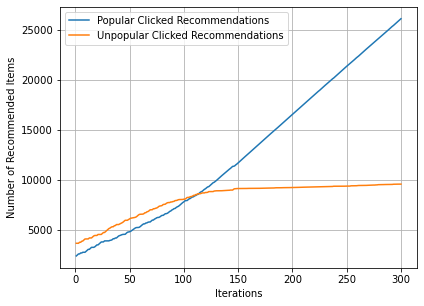

In [20]:
vc = pd.read_csv('T_3_final/t_1/clicked_label.txt',names=['unpop','pop'],sep='\t')
vc['index'] = range(1,len(vc)+1)
#print(vc,vc['ratio'].mean())
vc['cum_unpop'] = vc['unpop'].cumsum().astype(float)
vc['cum_pop'] = vc['pop'].cumsum().astype(float)

plt.plot(vc['index'], vc['cum_pop'], label = 'Popular Clicked Recommendations')
plt.plot(vc['index'], vc['cum_unpop'], label = 'Unpopular Clicked Recommendations')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Number of Pop/Unpop Recommendations")
plt.xlabel("Iterations")
plt.ylabel("Number of Recommended Items")
plt.legend()
plt.grid()
plt.savefig('foeir_png/Clicked_Total_recommendations.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()



In [24]:
pd_2 = pd.read_csv('T_3_final/t_1/total_clicked_items.txt', names=['itemid', 'score','count'], sep='\t')
items_ranked = list(pd_2['itemid'].unique())

for i in items_ranked:   
    pd_3 = pd.read_csv('T_3_final/t_1/score_per_itm_iter' + str(i) + '.txt', names=['itemid', 'label', 'cum_score', 'iteration'], sep='\t')
    pd_3['cum_score'] = pd_3['cum_score'].cumsum().astype(float)
    if len(pd_3) > 1:
        pd_3 = pd_3.drop_duplicates(subset='itemid',keep='last').reset_index(drop=True)
        #print(pd_3)
        pd_3.to_csv('T_3_final/t_1/clicked_exposed_after_boot.txt',header=None, index=False, sep='\t', mode='a')

In [28]:
td = pd.read_csv('T_3_final/t_1/count_score1.txt', names=['itemid', 'label', 'boot_expo_score'], sep='\t')
td_1 = pd.read_csv('T_3_final/t_1/clicked_exposed_after_boot.txt', names=['itemid','label', 'final_cum_expo_score','iteration'], sep='\t')
td['boot_rank'] = range(1,len(td)+1)
td_1['final_rank'] = range(1,len(td_1)+1)
ti = list(td_1['itemid'].unique())
td = td.loc[td['itemid'].isin(ti)].reset_index(drop=True)
td = td[['itemid','boot_expo_score','boot_rank']]
print(td)
td.to_csv('T_3_final/t_1/count_score3.txt',header=None, index=False, sep='\t', mode='w')

     itemid  boot_expo_score  boot_rank
0       639        19.636364          1
1      1450        18.363636          4
2      3581        16.727273         13
3      1784        16.727273         16
4       190        16.636364         17
..      ...              ...        ...
872    2522         4.181818       3064
873     153         4.090909       3066
874    2997         3.818182       3069
875    1626         3.363636       3078
876    1484         3.000000       3079

[877 rows x 3 columns]


In [32]:
#Need to update count_score and cumulative score files through the code in Pycharm or copy the code here!!
#Creates Rank Correlation Table // Boot_Final_Item_Exposure!!!
#td = pd.read_csv('T_3_final/t_1/out-1.txt',names=['userid','itemid','rate'],sep=',')
td_1 = pd.read_csv('T_3_final/t_1/clicked_exposed_after_boot.txt',names=['itemid','label','final_cum_expo_score','iteration'],sep='\t')
td_1 = td_1[['itemid','final_cum_expo_score']]

#tr = pd.read_csv('T_3_final/t_1/out-1.txt',names=['userid','itemid','rate'],sep=',')
#seq = cycle([1, 2, 3,4,5,6,7,8,9,10])
#td['seq'] = [next(seq) for count in range(td.shape[0])]
#td['boot_expo_score'] = td['seq'].apply(lambda k: expo_score(k))
#td['count'] = 1



#tr = tr[['itemid','expo_score','label','count']]

#td = td.drop_duplicates(keep='first',subset=['userid']).reset_index(drop=True)
#td = td[['itemid','boot_expo_score']]
#td = td.groupby(['itemid']).sum(['boot_expo_score']).reset_index()
#td = td.sort_values(by=['boot_expo_score'], ascending = False).reset_index(drop=True)
#print(td)
#tr['iteration'] = 1
#tr = tr[['itemid','expo_score','label','count']]


#td['boot_rank'] = range(1,len(td)+1)
td = pd.read_csv('T_3_final/t_1/count_score3.txt',names=['itemid','boot_expo_score','boot_rank'],sep='\t')
td_1['final_rank'] = range(1,len(td_1)+1)

td_2 = pd.DataFrame()
td_2 = td.head(10)
td_2 = td_2.append(td.tail(10))
td_2 = td_2[['itemid', 'boot_expo_score','boot_rank']]

itmids = list(td_2['itemid'].values)
td_1 = td_1.loc[td_1['itemid'].isin(itmids)]


rs = pd.DataFrame()
rs = pd.merge(td_2,td_1,on='itemid')
rs = rs[['itemid','boot_rank','final_rank','boot_expo_score','final_cum_expo_score']]
x_simple = np.array(rs['boot_rank'].values)
y_simple = np.array(rs['final_rank'].values)
my_rho = np.corrcoef(x_simple, y_simple)
print(my_rho)
df1 = rs.iloc[:10]
df2 = rs.iloc[10:]
display(df1,df2)

[[1.         0.29520301]
 [0.29520301 1.        ]]


,itemid,boot_rank,final_rank,boot_expo_score,final_cum_expo_score
0,639,1,488,19.636364,108.909091
1,1450,4,107,18.363636,163.000000
2,3581,13,20,16.727273,136.818182
3,1784,16,671,16.727273,322.727273
4,190,17,181,16.636364,317.181818
5,3078,20,492,16.545455,150.454545
6,2171,22,773,16.454545,122.090909
7,3446,26,458,16.363636,114.090909
8,319,27,385,16.272727,200.909091
9,3224,29,100,16.272727,129.909091


,itemid,boot_rank,final_rank,boot_expo_score,final_cum_expo_score
10,3055,3042,339,4.727273,177.545455
11,3941,3047,540,4.636364,132.272727
12,170,3049,242,4.545455,340.545455
13,3276,3050,869,4.545455,26.363636
14,252,3060,698,4.272727,229.272727
15,2522,3064,283,4.181818,885.272727
16,153,3066,710,4.090909,82.454545
17,2997,3069,866,3.818182,12.727273
18,1626,3078,424,3.363636,441.272727
19,1484,3079,202,3.000000,151.272727


In [27]:
tr = pd.read_csv('T_3_final/t_1/out-1.txt',names=['userid','itemid','rate'],sep=',')
seq = cycle([1, 2, 3,4,5,6,7,8,9,10])
popularity_data = compute_popularity(tr,'itemid')
head, mid, tail = get_head_mid_tail(popularity_data ,0.4, 0.8)
tr['label'] = tr.apply(lambda row: label_items(row, head), axis=1)
tr['label'] = tr['label'].astype(bool)
#tr['label'] = (tr['label'] == '1').astype(bool)
tr['seq'] = [next(seq) for count in range(tr.shape[0])]
tr['expo_score'] = tr['seq'].apply(lambda k: expo_score(k))
tr = tr[['itemid','expo_score','label']]

#tr['count'] = 1
#tr = tr[['userid','itemid','label','expo_score','count']]
#df_new = df[(df['Frequency'] == 0.8)
tr_1 = tr.loc[tr['label'] == True].reset_index(drop=True)
#rt = pd.DataFrame()
rt = tr.loc[tr['label'] == False].reset_index(drop=True)
tr_1['cum_pop_expo_score'] = tr_1['expo_score'].sum()
tr_1['cum_unpop_expo_score'] = rt['expo_score'].sum()
tr_1 = tr_1[['cum_pop_expo_score','cum_unpop_expo_score']]
tr_1 = tr_1.drop_duplicates()
tr_1['ratio'] = tr_1['cum_pop_expo_score'] / tr_1['cum_unpop_expo_score']
#tr_1.to_csv('T_3_final/t_1/pop_unpop_expo_score.txt',header=None, index=None, sep='\t', mode='w')

#print(tr_1)
#print(rt)
#tr = tr[['itemid','expo_score','label','count']]

#tr = tr.drop_duplicates(keep='first',subset=['userid']).reset_index(drop=True)


#tr['iteration'] =1

# tr['unpop'] = tr.label[tr.label == True].count()
# tr['pop'] = tr.label[tr.label == False].count()
# tr = tr[['unpop','pop']].drop_duplicates()
# #print(tr)

#tr.to_csv('T_3_final/t_1/clicked_label.txt',header=None, index=None, sep='\t', mode='w')

for i in range(2,301):
    tr_1 = pd.read_csv('T_3_final/t_' + str(i) + '/FOEIR-DIC_rec.txt',names=['userid','itemid','expo_score','label','count'],sep=",")
    tr = tr_1.loc[tr_1['label'] == True].reset_index(drop=True)
    #rt = pd.DataFrame()
    rt = tr_1.loc[tr_1['label'] == False].reset_index(drop=True)
    tr['cum_pop_expo_score'] = rt['expo_score'].sum()
    tr['cum_unpop_expo_score'] = tr['expo_score'].sum()
    tr = tr[['cum_pop_expo_score','cum_unpop_expo_score']]
    tr = tr.drop_duplicates()
    tr['ratio'] = tr['cum_pop_expo_score'] / tr['cum_unpop_expo_score']
    #print(tr)
    tr.to_csv('T_3_final/t_1/pop_unpop_expo_score.txt',header=None, index=None, sep='\t', mode='a')

/tmp/ipykernel_7977/2196197447.py:19: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/Pop_unpop_exposure_score.jpg',format ='jpg',box_inches='tight', dpi=150)


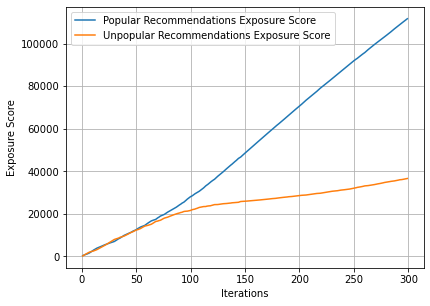

In [21]:
vc = pd.read_csv('T_3_final/t_1/pop_unpop_expo_score.txt',names=['pop','unpop','ratio'],sep='\t')
vc['index'] = range(1,len(vc)+1)
#print(vc,vc['ratio'].mean())
vc['cum_unpop'] = vc['unpop'].cumsum().astype(float)
vc['cum_pop'] = vc['pop'].cumsum().astype(float)

plt.plot(vc['index'], vc['cum_pop'], label = 'Popular Recommendations Exposure Score')
plt.plot(vc['index'], vc['cum_unpop'], label = 'Unpopular Recommendations Exposure Score')
#plt.plot(vc['index'], vc['ratio'], label = 'Ratio')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Number of Pop/Unpop Recommendations")
plt.xlabel("Iterations")
plt.ylabel("Exposure Score")
plt.legend()
plt.grid()
plt.savefig('foeir_png/Pop_unpop_exposure_score.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()


/tmp/ipykernel_7977/1176816511.py:19: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('/home/manolis/PycharmProjects/LB_only/BA_Laura-master/lb_png/Pop_unpop_exposure_score.jpg',format ='jpg',box_inches='tight', dpi=150)


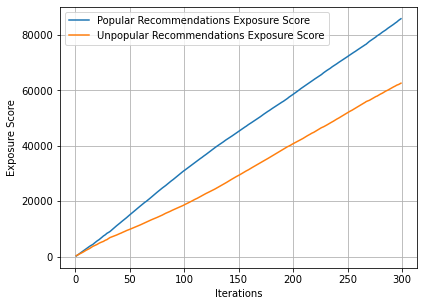

In [25]:
vc_1 = pd.read_csv('/home/manolis/PycharmProjects/LB_only/BA_Laura-master/LB_2_Final/t_1/pop_unpop_expo_score.txt',names=['pop','unpop','ratio'],sep='\t')
vc_1['index'] = range(1,len(vc_1)+1)
#print(vc,vc['ratio'].mean())
vc_1['cum_unpop'] = vc_1['unpop'].cumsum().astype(float)
vc_1['cum_pop'] = vc_1['pop'].cumsum().astype(float)

plt.plot(vc_1['index'], vc_1['cum_pop'], label = 'Popular Recommendations Exposure Score')
plt.plot(vc_1['index'], vc_1['cum_unpop'], label = 'Unpopular Recommendations Exposure Score')
#plt.plot(vc['index'], vc['ratio'], label = 'Ratio')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Number of Pop/Unpop Recommendations")
plt.xlabel("Iterations")
plt.ylabel("Exposure Score")
plt.legend()
plt.grid()
plt.savefig('/home/manolis/PycharmProjects/LB_only/BA_Laura-master/lb_png/Pop_unpop_exposure_score.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()


/tmp/ipykernel_7977/2896668877.py:14: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('foeir_png/Both_Ratio_Pop_unpop_exposure_score.jpg',format ='jpg',box_inches='tight', dpi=150)


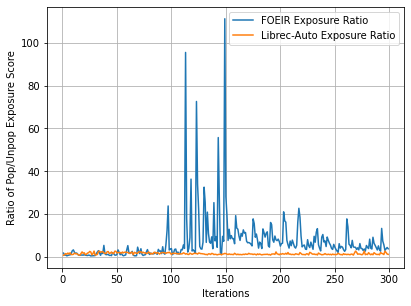

In [24]:
plt.plot(vc['index'], vc['ratio'], label = 'FOEIR Exposure Ratio')
plt.plot(vc_1['index'], vc_1['ratio'], label = 'Librec-Auto Exposure Ratio')
#plt.plot(vc_1['index'], vc_1['ratio'], label = 'Unpopular Recommendations Exposure Score')
#plt.plot(vc['index'], vc['ratio'], label = 'Ratio')
#plt.plot(x, y)
#plt.plot(x, y)
#plt.ylim([0.0001,0.02])
#plt.xlim([1,1000])
#plt.title("Number of Pop/Unpop Recommendations")
plt.xlabel("Iterations")
plt.ylabel("Ratio of Pop/Unpop Exposure Score")
plt.legend()
plt.grid()
plt.savefig('foeir_png/Both_Ratio_Pop_unpop_exposure_score.jpg',format ='jpg',box_inches='tight', dpi=150)
plt.show()


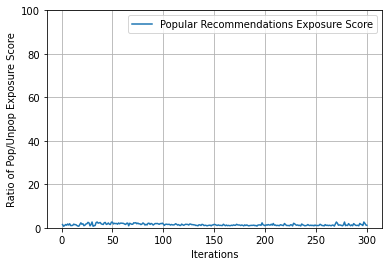

In [22]:
plt.plot(vc_1['index'], vc_1['ratio'], label = 'Popular Recommendations Exposure Score')
#plt.plot(vc_1['index'], vc_1['ratio'], label = 'Unpopular Recommendations Exposure Score')
#plt.plot(vc['index'], vc['ratio'], label = 'Ratio')
#plt.plot(x, y)
#plt.plot(x, y)
plt.ylim([0,100])
#plt.xlim([1,1000])
#plt.title("Number of Pop/Unpop Recommendations")
plt.xlabel("Iterations")
plt.ylabel("Ratio of Pop/Unpop Exposure Score")
plt.legend()
plt.grid()
plt.show()
#plt.savefig('FINAL_T_3_FOEIR_PGF/Ratio_Pop_unpop_exposure_score.jpg')